# Assignment #4 - Reinforcement Learning

### <font color="red"> DUE: Nov 26 (Tuesday) 11:00 pm </font>  

<font color="blue"> Heet Detroja </font>

# I. Overview

In this assignment we will implement Reinforcement Learning algorithm on Rummy game. We will understand and train a RL agent using SARSA or Q Learning. We will select one of the model for experiment, then use the various parameters on the selected model and choose the best parameters for final training of the RL agent. Finally, we will visualize and explain the results. We have implemented rummy here, Rummy is mostly played by 4 players where each player get 10 cards and rest of placed as closed deck.
But for this assignment to keep it simple, we have changed some rules, reduced the deck of cards and distribution of the cards among each player. Otherwise, the our Q table would be large to handle on our local machines.

# II. Problems 



## Rummy (Our Way)
![](https://upload.wikimedia.org/wikipedia/commons/9/9a/3_playing_cards.jpg)



### Description:
Rummy is mostly played by 4 players where each player get 10 cards and rest of placed as closed deck.  

But for this assignment to keep it simple, we have changed some rules, reduced the deck of cards and distribution of the cards among each player. Otherwise, the our Q table would be large to handle on our local machines.  

So in this game each player will get 3 cards randomly from 'A' to '5'. With each turn you have to pick a card either from the pile of closed or open cards depending on the cards you have. After that you have to select a card to drop to the pile from your deck. Your goal is to make all of your 3 cards of same number. As soon as one player reaches the goal state, it will meld the cards and game will stop and all other player will get score as the sum of their cards in hand. Player with minimum score will win the game.  

Each player will play for the 10 rounds and if nobody reach to the meld stage then each will player will get score equivalent to the sum of their cards in hand.

Player with the lowest score wins the game.



### <font color="red"> Game Introduction and Rules: </font>

You can only till max turns which is now 20. If you are able to meld your cards, you win otherwise you lose points as per your stash score.

Lets Simulate a Game Round :
The Goal of this game is to collect cards with the same rank.
Naming Conventions to follow H : Hearts, S : Spades, D : Diamonds, C : Clubs. Stash/Hand are the cards which you have. Stash/Hand Score: The sum of the rank of cards. 

- On the first turn you will be given 3 cards from the randomly shuffled deck. Eg: 3H, 2S, AD. Stash Score: 6
- In the next step you will have to either pick a card from pile or the deck. On the first turn, the top card of the deck is on the pile. The card on the pile is visible to you. So Card on the Pile : 2D . You have to decide whether you have to pick this card or you have to pick from pile. Since you alread
- Following the pickup step, you will have to drop one card from the stash/hand. Your Hand : 3H, 2S, AD, 2D
- You can drop any of these cards, but remember if you drop 2S or 2D you might not be able to make a series. So you have to decide whether to drop 3H or AD. Since there are maximum 20 turns, you have to keep your score low as well, Higher the score the higher points you lose. So you decide to drop 3H. Your hand/stash will be: 2S, 2D, AD
- Your opponent will play his hand, he/she shall pick up a card from a pile or deck and the drop a card to the pile.
- Now its your turn. The card on the Pile : 5H. Since picking up this card won't help you much. You decide to pick a card from the Deck. You get lucky, you get a 2C card. Your hand now is 2S, 2D, 2C, AD. Hurray! You can now meld these cards and drop the last card to make your score 0.
- You win this round. Your opponent Stash/Hand score : 15. So you are at 0 points and your opponent is at 15 points. You are ahead of him since you have to keep your score as low as possible.


## Rummy Environment

Importing Libraries

In [1]:
import collections
import matplotlib.pyplot as plt

In [2]:
import random 
from functools import reduce
from collections import defaultdict
import numpy as np
from copy import copy
%matplotlib inline

Here, we define the SUITS, RANKS of the cards and their RANK_VALUE.

In [3]:
SUIT = ['H','S','D','C']
RANK = ['A', '2', '3', '4', '5','6','7']
RANK_VALUE = {'A': 1, '2': 2, '3': 3, '4': 4, '5': 5, '6': 6, '7': 7, '8': 8, '9': 9, 'T': 10, 'Q': 10, 'K': 10}

## Card Class Definition
__init__  : Defines the card details such as rank, suit and calculates the rank value


In [4]:
class Card :
    def __init__(self,rank,suit):
        self.rank = rank
        self.suit = suit
        self.rank_to_val = RANK_VALUE[self.rank]
    
    def __str__(self):
        return f'{self.rank}{self.suit}'

    def __repr__(self):
        return f'{self.rank}{self.suit}'

    
    def __eq__(self,other):
        return self.rank == other.rank and self.suit == other.suit
  
# Deck class contains some basic operations performed with the cards:
# 1. Shuffling the cards.
# 2. Drawing card from the deck.

## Deck Class Definition
__shuffle__ : Shuffles the deck in random order

__draw_card__ : Draws a card from the top of the deck

In [5]:
class Deck:
    def __init__(self,packs):
        self.packs = packs
        self.cards = []
        for pack in range(0,packs) :
            for suit in SUIT :
                for rank in RANK :
                    self.cards.append(Card(rank,suit))
    
    def shuffle(self):
        random.shuffle(self.cards)
    
    def draw_card(self):
        card = self.cards[0]
        self.cards.pop(0)
        return card

## Player Class:

### 1.__init__(self,name,stash=list(),isBot=False): 
Initializing stash, name, isBot/dealer points for each player.

### 2. deal_card(self,card):
This method appends the card in the stash and check the condition that length of stash should not be greater than nuber of cards length in game.

### 3. drop_card(self,card):
This method removes the card from stash and add that card into pile.

### 4. meld(self):
This method tries to find the cards with the same rank in the hand. If it finds then it will merge the cards in the hand to the melded cards array in the game. 

### 5. stash_score(self):
This method calculates sum of all the cards in stash according to the rank of each card.

### 6. get_info(self,debug):
This function fetch all the information of the player.

In [6]:
class Player:
  
    """  
        Player class to create a player object.
        eg: player = Player("player1", list(), isBot = False)
        Above declaration will be for your agent.
        All the player names should be unique or else you will get error.
        
    """

    def __init__(self,name,stash=list(),isBot=False,points=0,conn=None):
        self.stash = stash
        self.name = name
        self.game = None
        self.isBot = isBot
        self.points = points
        self.conn = conn
        
    def deal_card(self,card):
        try :
            self.stash.append(card)
            if len(stash) > self.game.cardsLength + 1 :
                raise ValueError('Cannot have cards greater than ')
        except ValueError as err:
            print(err.args)
            
    def drop_card(self,card):
        self.stash.remove(card)
        self.game.add_pile(card)
        return -1

    
    def meld(self):
        card_hash = defaultdict(list)
        for card in self.stash:
            card_hash[card.rank].append(card)
        melded_card_ranks = []
        for (card_rank,meld_cards) in card_hash.items():
            if len(meld_cards) >= 3 :
                self.game.meld.append(meld_cards)
                melded_card_ranks.append(card_rank)
                for card in meld_cards:
                    self.stash.remove(card)
        
        for card_rank in melded_card_ranks :
            card_hash.pop(card_rank)
        return len(melded_card_ranks) > 0

    def stash_score(self) :
        score = 0
        for card in self.stash :
            score += RANK_VALUE[card.rank]
        return score
    
    def get_info(self,debug):
        if debug :
            print(f'Player Name : {self.name} \n Stash Score: {self.stash_score()} \n Stash : {", ".join(str(x) for x in self.stash)}')
        card_ranks = []
        card_suits = []
        pileset = None
        pile = None
        for card in self.stash :
            card_suits.append(RANK_VALUE[card.rank])
            card_ranks.append(card.suit)
        if len(self.game.pile) > 0 : 
            return {"Stash Score" : self.stash_score(), "CardSuit":  card_suits, "CardRanks": card_ranks, "PileRank": self.game.pile[-1].rank, "PileSuit":self.game.pile[-1].suit}
        return {"Stash Score" : self.stash_score(), "CardSuit":  card_suits, "CardRanks": card_ranks}


## Game Enviroment:

### 1. __init():  

### 2. add_pile(self, card):  This method takes a card as argument and first checks number of cards in the deck. If its is ‘0’ then add the cards from file to deck and append the passed card to the pile.

### 3. pick_card(self, player, action):  This methods helps player picking up the card from either Pile or Deck based on action.
			We have defined, If action = 0 then, player will pick a card from Pile
			And if action. = 1 then player will pick card from Deck. 
			Meld condition will be check after player picks the card, if the meld condition satisfied, player won. 
            You can modify the rewards in return, only the values

### 4. pick_from_pile(self, player): This method helps player picking card from the pile and simultaneously a card from pile gets reduced.

### 5. pick_from_deck(self, player): This method is similar to above method but it helps picking up card from the Deck. 

### 6. get_player(self, player_name): This function fetch the details of the player given player_name.

### 7. computer_play(self, player): This method defines the play of the computer/Dealer in following sequence:
			--> Randomly taking actions from picking up card from deck/pile.
			--> Checking the meld condition afterwards.
			--> If the meld condition does not satisfied, remove the card from his stash.

### 8. play(self): This method defines all the function city of play for the player:
		  --> Decrementing the maximum number of turns defined per game.
		  --> For each player, it will check the 'stash', if the 'Stash' for any player = 0 (That player won), it will add the value of each card in stash for all other players.
		  --> Or If maximum number of turns in each round becomes 0, it will add the card values in stash for all the players and return.
      
### 9. drop_card(self,player,card) This method drops a card from the player given player object and card object and returns the reward associated with it.

      --> You can modify the rewards which gets returned in the value.


### 9. reset(self, players): This method will reinitialize all the deck, pile and players.

### 10. _update_turn(self): This method is used to count the number of turns in the game.

In [7]:
class RummyAgent() :
    """
    Simple Rummy Environment
    
    Simple Rummy is a game where you need to make all the cards in your hand same before your opponent does.
    Here you are given 3 cards in your hand/stash to play.
    For the first move you have to pick a card from the deck or from the pile. 
    The card in deck would be random but you can see the card from the pile.
    In the next move you will have to drop a card from your hand.
    Your goal is to collect all the cards of the same rank. 
    Higher the rank of the card, the higher points you lose in the game. 
    You need to keep the stash score low. Eg, if you can AH,7S,5D your strategy would be to either find the first pair of the card or by removing the highest card in the deck.
    You only have 20 turns to either win the same or collect low scoring card.
    You can't see other players cards or their stash scores.
    
    Parameters
    ====
    players: Player objects which will play the game.
    max_card_length : Number of cards each player can have
    max_turns: Number of turns in a rummy game
    """

    def __init__(self, players, max_card_length=5, max_turns=20) :
        self.max_card_length = max_card_length
        self.max_turns = max_turns
        self.reset(players)
        
    def update_player_cards(self,players):
        for player in players :
            player = Player(player.name, list(), isBot=player.isBot, points=player.points, conn=player.conn)
            stash = []
            for i in range(self.max_card_length):
                player.stash.append(self.deck.draw_card())
            player.game = self
            self.players.append(player)
        self.pile = [self.deck.draw_card()]

    def add_pile(self,card):
        if len(self.deck.cards) == 0 :
            self.deck.cards.extend(self.pile)
            self.deck.shuffle()
            self.pile = []
        self.pile.append(card)
        
        
    def pick_card(self,player,action):
        if action == 0:
            self.pick_from_pile(player)
        else :
            self.pick_from_deck(player)
        state = [c for c in player.stash]
        if player.meld() :
            return {"reward" : 10, 'state': state}
        else :
            return {"reward" : -1, 'state': state}
#             return -player.stash_score()
       
    def pick_from_pile(self, player):
        card = self.pile[-1]
        self.pile.pop()
        return player.stash.append(card)
     
    def pick_from_deck(self, player):
        return player.stash.append(self.deck.draw_card())
    
    def get_player(self,  player_name):
        return_player = [player for player in self.players if player.name == player_name]
        if len(return_player) != 1:
            print("Invalid Player")
            return None
        else:
            return return_player[0]
    
    def drop_card(self,player,card):
        player.drop_card(card)
        return {"reward" : -1}


    def computer_play(self,player):
        #Gets a card from deck or pile
        if random.randint(0,1) == 1 :
            self.pick_from_pile(player)
        else :
            self.pick_from_deck(player)
            
        #tries to meld if it can
#         if random.randint(0,10) > 5 :
        player.meld()
        
        #removes a card from the stash
        if len(player.stash) != 0:
            card = player.stash[(random.randint(0,len(player.stash) - 1))]
            player.drop_card(card)
        
    def play(self):
        for player in self.players :
            if len(player.stash) == 0 :
                return True
        if self.max_turns <= 0 :
            return True
        return False

    def _update_turn(self):
        self.max_turns -= 1  
    
    def reset(self,players,max_turns=20):
        self.players = []
        self.deck = Deck(1)
        self.deck.shuffle()
        self.meld = []
        self.pile = []
        self.max_turns = max_turns
        self.update_player_cards(players)




### Example Run with Random Players

This following code shows how to create an environment and players to play 10 games with 20 maximum rounds. This only includes random picking up of card and dropping.  

In [8]:
p1 = Player('tabish',list())
p2 = Player('comp1',list(),isBot=True)
rummy = RummyAgent([p1,p2],max_card_length=3,max_turns=20)

In [9]:
maxiter = 3
debug = True
for j in range(maxiter):
        for player in rummy.players :
            player.points = player.stash_score()
        
        rummy.reset(rummy.players)
        random.shuffle(rummy.players)
        # int i = 0 
        if debug :
            print(f'**********************************\n\t\tGame Starts : {j}\n***********************************')
        while not rummy.play() :    
            rummy._update_turn()
            print(rummy.max_turns)       
            for player in rummy.players:
                if player.isBot :
                    if rummy.play():
                        continue
                    if debug :
                        print(f'{player.name} Plays')
                    rummy.computer_play(player)
                    if debug :
                        player.get_info(debug)
                        if player.stash == 0 :
                            print(f'{player.name} wins the round')

                else :
                    if rummy.play() :
                        continue
                    if debug :
                        print(f'{player.name} Plays')
                    player_info = player.get_info(debug)
                    action_taken = np.random.choice(1)
                    if debug :
                        print(f'Card in pile {player_info["PileSuit"]}{player_info["PileRank"]}')
                    result_1 = rummy.pick_card(player,action_taken)
                    result_1 = result_1["reward"]

                    if debug : 
                        print(f'{player.name} takes action {action_taken}')
                    #player stash will have no cards if the player has melded them 
                    #When you have picked up a card and you have drop it since the remaining cards have been melded. 
                    if len(player.stash) == 1:
                        rummy.drop_card(player,player.stash[0])
                        if debug :
                            print(f'{player.name} Wins the round')

                    elif len(player.stash) != 0 :

                        player_info = player.get_info(debug)
                        s = player_info['CardRanks']
                        action_taken = np.random.choice(4)
                        card = player.stash[action_taken]
                        if debug :
                            print(f'{player.name} drops card {card}')

                        result_1 = rummy.drop_card(player,card)
                        result_1 = result_1["reward"]
#                             pdb.set_trace()
                    else :
                        if debug :
                            print(f'{player.name} Wins the round')
                    if debug :
                        player.get_info(debug)
        


**********************************
		Game Starts : 0
***********************************
19
tabish Plays
Player Name : tabish 
 Stash Score: 15 
 Stash : 6S, 2D, 7D
Card in pile S4
tabish takes action 0
Player Name : tabish 
 Stash Score: 19 
 Stash : 6S, 2D, 7D, 4S
tabish drops card 4S
Player Name : tabish 
 Stash Score: 15 
 Stash : 6S, 2D, 7D
comp1 Plays
Player Name : comp1 
 Stash Score: 13 
 Stash : 2S, 7S, 4S
18
tabish Plays
Player Name : tabish 
 Stash Score: 15 
 Stash : 6S, 2D, 7D
Card in pile S3
tabish takes action 0
Player Name : tabish 
 Stash Score: 18 
 Stash : 6S, 2D, 7D, 3S
tabish drops card 3S
Player Name : tabish 
 Stash Score: 15 
 Stash : 6S, 2D, 7D
comp1 Plays
Player Name : comp1 
 Stash Score: 10 
 Stash : 2S, 4S, 4D
17
tabish Plays
Player Name : tabish 
 Stash Score: 15 
 Stash : 6S, 2D, 7D
Card in pile S7
tabish takes action 0
Player Name : tabish 
 Stash Score: 22 
 Stash : 6S, 2D, 7D, 7S
tabish drops card 7S
Player Name : tabish 
 Stash Score: 15 
 Stash : 6S,

# III. Methods

## Review of SARSA and Q-Learning

Q-Learning is an off-policy, model-free RL algorithm based on the well-known Bellman Equation.The goal of Q-learning is to learn a policy, which tells an agent what action to take under what circumstances. It does not require a model (hence the connotation "model-free") of the environment, and it can handle problems with stochastic transitions and rewards, without requiring adaptations.
$$
    Q(s_t, a_t) \leftarrow Q(s_t, a_t) + \alpha ( R_{t+1} + \gamma \max_a Q(s_{t+1}, a) - Q(s_t, a_t)) 
$$

SARSA very much resembles Q-learning. The key difference between SARSA and Q-learning is that SARSA is an on-policy algorithm. It implies that SARSA learns the Q-value based on the action performed by the current policy instead of the greedy policy.
$$
    Q(s_t, a_t) \leftarrow Q(s_t, a_t) + \alpha ( R_{t+1} + \gamma Q(s_{t+1}, a_{t+1}) - Q(s_t, a_t)) 
$$
By contrast, Q-learning has no constraint over the next action, as long as it maximizes the Q-value for the next state. Therefore, SARSA is an on-policy algorithm.

## TD learning approach: SARSA or Q-learning

For this problem I choose. As we want the agent to learn optimal greedy policy. Same in the case of Rummy game I want agent to learn by exploring.
SARSA will converge allowing for possible penalities from exploratory moves. It is very conservative and if there is any large negative closer to optimal path it tends to avoid it.
We want the agent to learn optimal policies.

## Function Approximator
We have implemented the fucntion approximator
$$
   Q(s_t, a_t) \leftarrow Q(s_t, a_t) + \alpha ( R_{t+1} + \gamma Q(s_{t+1}, a_{t+1}) - Q(s_t, a_t)) 
$$

## RLAgent for Rummy

Referencing the RLAgent in the lecture note, make your own agent class for the game. 

In [19]:
class RLAgent:
    """
        Reinforcement Learning Agent Model for training/testing
        with Tabular function approximation

    """

    def __init__(self, env, epsilon=0.2, alpha=0.1, gamma=1):
        self.env = env
        #self.size = env.get_size()
        self.no = 2
        self.epsilon = epsilon
        self.alpha = alpha
        self.gamma = gamma
        #TODO: 
        #self.Q table including the surrounding border
        self.Q = np.zeros((7, 7, 7, 7, 2, 4))

    def epsilon_greed_pick(self, s):
        if np.random.uniform() < self.epsilon:
            id1 = np.random.randint(2)
        else:
            id1 = np.where(self.Q[s[0], s[1], s[2], s[3], :, 0] == np.max(self.Q[s[0], s[1], s[2], s[3], :, 0]))[0][0]
        return id1

    def epsilon_greed_drop(self, s):
        if np.random.uniform() < self.epsilon:
            id1 = np.random.randint(4)
        else:
            id1 = np.where(self.Q[s[0], s[1], s[2], s[3], 0, :] == np.max(self.Q[s[0], s[1], s[2], s[3], 0, :]))[0][0]
        return id1
    
    
    def train(self, **params):

        # parameters
        maxiter = 500           # Number of games <- update to higher value to train better
        debug = True
        
        rtr=[]
        for j in range(maxiter):
            rewards=[]
            for player in rummy.players :
                player.points = player.stash_score()
            
            rummy.reset(rummy.players)
            random.shuffle(rummy.players)
            win=0
            loss=0
            if debug :
                print('**********************************\n\t\tGame Starts : {j}\n***********************************')
            for i in range(50):
                while not rummy.play() :
                    rummy._update_turn()
                    print(rummy.max_turns)
                    for player in rummy.players:
                        if player.isBot :
                            if rummy.play():
                                continue
                            if debug :
                                print(f'{player.name} Plays')
                            rummy.computer_play(player)
                            if debug :
                                player.get_info(debug)
                                if player.stash == 0 :
                                    print(f'{player.name} wins the round')

                        else :
                            if rummy.play() :
                                continue
                            if debug :
                                print(f'{player.name} Plays')
                            player_info = player.get_info(debug)

                            s = [c.rank_to_val - 1 for c in player.stash]
                            s.append(rummy.pile[-1].rank_to_val - 1)
                            print(f'.........................{s}')

                            a = self.epsilon_greed_pick(s=s)
                            action_taken = a
                            if debug :
                                print(f'Card in pile {player_info["PileSuit"]}{player_info["PileRank"]}')

                            result_1 = rummy.pick_card(player, a)
                            r = result_1["reward"]
                            rewards.append(r)
                            print(result_1['state'])
                            s_prime = [c.rank_to_val - 1 for c in result_1['state']]
                            a_prime = self.epsilon_greed_drop(s=s_prime)

    #                         Update the Q table for pick action

                            self.Q[s[0], s[1], s[2], s[3], a, :] += self.alpha * (r + self.gamma * self.Q[s_prime[0], s_prime[1], s_prime[2], s_prime[3], 0, a_prime] -\
                                                 self.Q[s[0], s[1], s[2], s[3], a, 0])
                            s = s_prime
                            a = a_prime

                            if debug :
                                print(f'{player.name} takes action {action_taken}')
                            #player stash will have no cards if the player has melded them
                            #When you have picked up a card and you have drop it since the remaining cards have been melded.
                            if len(player.stash) == 1:
                                rummy.drop_card(player,player.stash[0])
                                if debug :
                                    print(f'{player.name} Wins the round')

                            elif len(player.stash) != 0 :

                                player_info = player.get_info(debug)
    #                             s = player_info['CardRanks']
                                action_taken = a
                                card = player.stash[action_taken]
                                if debug :
                                    print(f'{player.name} drops card {card}')

                                result_1 = rummy.drop_card(player,card)
                                r = result_1["reward"]
                                rewards.append(r)
                                s_prime_drop = s
                                a_prime = self.epsilon_greed_pick(s=s_prime_drop)

    #                            Update the Q table for drop action
                                self.Q[s[0], s[1], s[2], s[3], :, a] += self.alpha * (r + self.gamma * \
                                                                                      self.Q[s_prime_drop[0], s_prime_drop[1], s_prime_drop[2], s_prime_drop[3], a_prime, 0] -\
                                                                                      self.Q[s[0], s[1], s[2], s[3], 0, a])
                            else :
                                if debug :
                                    print(f'{player.name} Wins the round')
                            if debug :
                                player.get_info(debug)
            rtr.append(np.sum(rewards))
            for i in range(len(rtr)):
                if rtr[i]>=0:
                    win=win+1
                else:
                    loss=loss+1                    
        return win,loss,rtr
    def test(self, **params):
        maxiter = 3           # Number of games <- update to higher value to train better
        rtr=[]
        for j in range(maxiter):
            rewards=[]
            for player in rummy.players :
                player.points = player.stash_score()
            rummy.reset(rummy.players)
            random.shuffle(rummy.players)
            # int i = 0
            win=0
            loss=0
            for i in range(50):
                while not rummy.play() :
                    rummy._update_turn()
                    print(rummy.max_turns)
                    for player in rummy.players:
                        if player.isBot :
                            if rummy.play():
                                continue
                            rummy.computer_play(player)
                        else :
                            if rummy.play() :
                                continue
                            s = [c.rank_to_val - 1 for c in player.stash]
                            s.append(rummy.pile[-1].rank_to_val - 1)
                            a = self.epsilon_greed_pick(s=s)
                            action_taken = a
                            result_1 = rummy.pick_card(player, a)
                            r = result_1["reward"]
                            rewards.append(r)
                            s_prime = [c.rank_to_val - 1 for c in result_1['state']]
                            a_prime = self.epsilon_greed_drop(s=s_prime)
    #                         Update the Q table for pick action
                            self.Q[s[0], s[1], s[2], s[3], a, :] += self.alpha * (r + self.gamma * self.Q[s_prime[0], s_prime[1], s_prime[2], s_prime[3], 0, a_prime] -\
                                                 self.Q[s[0], s[1], s[2], s[3], a, 0])
                            s = s_prime
                            a = a_prime
                            if len(player.stash) == 1:
                                rummy.drop_card(player,player.stash[0])
                            elif len(player.stash) != 0 :
                                player_info = player.get_info(debug)
    #                             s = player_info['CardRanks']
                                action_taken = a
                                card = player.stash[action_taken]
                                result_1 = rummy.drop_card(player,card)
                                r = result_1["reward"]
                                rewards.append(r)
                                s_prime_drop = s
                                a_prime = self.epsilon_greed_pick(s=s_prime_drop)

    #                            Update the Q table for drop action
                                self.Q[s[0], s[1], s[2], s[3], :, a] += self.alpha * (r + self.gamma * \
                                                                                      self.Q[s_prime_drop[0], s_prime_drop[1], s_prime_drop[2], s_prime_drop[3], a_prime, 0] -\
                                                                                      self.Q[s[0], s[1], s[2], s[3], 0, a])
            rtr.append(np.sum(rewards))
            for i in range(len(rtr)):
                if rtr[i]>=0:
                    win=win+1
                else:
                    loss=loss+1
        return win,loss,rtr

## Explanation of code

We have defined the train function here which gives us the enviroment to train our RL agent.This name simply reflects the fact that the main function for updating the Q-value depends on the current state of the agent "S1", the action the agent chooses "A1", the reward "R" the agent gets for choosing this action, the state "S2" that the agent enters after taking that action, and finally the next action "A2" the agent chooses in its new state.A SARSA agent interacts with the environment and updates the policy based on actions taken, hence this is known as an on-policy learning algorithm. The Q value for a state-action is updated by an error, adjusted by the learning rate alpha. Q values represent the possible reward received in the next time step for taking action a in state s, plus the discounted future reward received from the next state-action observation.

In [20]:
p1 = Player('heet', list())
p2 = Player('bot', list(), isBot=True)
rummy = RummyAgent([p1,p2], max_card_length=3, max_turns=20)
agent_rummy = RLAgent(rummy)
win,loss,r=agent_rummy.train()

**********************************
		Game Starts : {j}
***********************************
19
heet Plays
Player Name : heet 
 Stash Score: 15 
 Stash : 6D, 6S, 3D
.........................[5, 5, 2, 2]
Card in pile H3
[6D, 6S, 3D, 3H]
heet takes action 0
Player Name : heet 
 Stash Score: 18 
 Stash : 6D, 6S, 3D, 3H
heet drops card 6D
Player Name : heet 
 Stash Score: 12 
 Stash : 6S, 3D, 3H
bot Plays
Player Name : bot 
 Stash Score: 14 
 Stash : 2D, 6H, 6D
18
heet Plays
Player Name : heet 
 Stash Score: 12 
 Stash : 6S, 3D, 3H
.........................[5, 2, 2, 1]
Card in pile C2
[6S, 3D, 3H, 2C]
heet takes action 0
Player Name : heet 
 Stash Score: 14 
 Stash : 6S, 3D, 3H, 2C
heet drops card 6S
Player Name : heet 
 Stash Score: 8 
 Stash : 3D, 3H, 2C
bot Plays
Player Name : bot 
 Stash Score: 0 
 Stash : 
**********************************
		Game Starts : {j}
***********************************
19
bot Plays
Player Name : bot 
 Stash Score: 18 
 Stash : 6H, 5H, 7S
heet Plays
Player Name

[4H, 2D, 5C, AD]
heet takes action 0
Player Name : heet 
 Stash Score: 12 
 Stash : 4H, 2D, 5C, AD
heet drops card 4H
Player Name : heet 
 Stash Score: 8 
 Stash : 2D, 5C, AD
bot Plays
Player Name : bot 
 Stash Score: 13 
 Stash : 3S, 6D, 4H
12
heet Plays
Player Name : heet 
 Stash Score: 8 
 Stash : 2D, 5C, AD
.........................[1, 4, 0, 3]
Card in pile D4
[2D, 5C, AD, 4D]
heet takes action 0
Player Name : heet 
 Stash Score: 12 
 Stash : 2D, 5C, AD, 4D
heet drops card 2D
Player Name : heet 
 Stash Score: 10 
 Stash : 5C, AD, 4D
bot Plays
Player Name : bot 
 Stash Score: 13 
 Stash : 3S, 6D, 4H
11
heet Plays
Player Name : heet 
 Stash Score: 10 
 Stash : 5C, AD, 4D
.........................[4, 0, 3, 1]
Card in pile D2
[5C, AD, 4D, 2D]
heet takes action 0
Player Name : heet 
 Stash Score: 12 
 Stash : 5C, AD, 4D, 2D
heet drops card 5C
Player Name : heet 
 Stash Score: 7 
 Stash : AD, 4D, 2D
bot Plays
Player Name : bot 
 Stash Score: 13 
 Stash : 3S, 6D, 4H
10
heet Plays
Player N

14
heet Plays
Player Name : heet 
 Stash Score: 14 
 Stash : 7D, 5H, 2C
.........................[6, 4, 1, 3]
Card in pile D4
[7D, 5H, 2C, 4D]
heet takes action 0
Player Name : heet 
 Stash Score: 18 
 Stash : 7D, 5H, 2C, 4D
heet drops card 7D
Player Name : heet 
 Stash Score: 11 
 Stash : 5H, 2C, 4D
bot Plays
Player Name : bot 
 Stash Score: 14 
 Stash : 7C, 5S, 2D
13
heet Plays
Player Name : heet 
 Stash Score: 11 
 Stash : 5H, 2C, 4D
.........................[4, 1, 3, 2]
Card in pile H3
[5H, 2C, 4D, 3H]
heet takes action 0
Player Name : heet 
 Stash Score: 14 
 Stash : 5H, 2C, 4D, 3H
heet drops card 5H
Player Name : heet 
 Stash Score: 9 
 Stash : 2C, 4D, 3H
bot Plays
Player Name : bot 
 Stash Score: 10 
 Stash : 7C, 2D, AH
12
heet Plays
Player Name : heet 
 Stash Score: 9 
 Stash : 2C, 4D, 3H
.........................[1, 3, 2, 4]
Card in pile S5
[2C, 4D, 3H, 5S]
heet takes action 0
Player Name : heet 
 Stash Score: 14 
 Stash : 2C, 4D, 3H, 5S
heet drops card 2C
Player Name : heet 


.........................[6, 0, 5, 2]
Card in pile D3
[7C, AC, 6H, 3D]
heet takes action 0
Player Name : heet 
 Stash Score: 17 
 Stash : 7C, AC, 6H, 3D
heet drops card 7C
Player Name : heet 
 Stash Score: 10 
 Stash : AC, 6H, 3D
bot Plays
Player Name : bot 
 Stash Score: 10 
 Stash : 3C, 5H, 2D
7
heet Plays
Player Name : heet 
 Stash Score: 10 
 Stash : AC, 6H, 3D
.........................[0, 5, 2, 0]
Card in pile SA
[AC, 6H, 3D, 5S]
heet takes action 1
Player Name : heet 
 Stash Score: 15 
 Stash : AC, 6H, 3D, 5S
heet drops card AC
Player Name : heet 
 Stash Score: 14 
 Stash : 6H, 3D, 5S
bot Plays
Player Name : bot 
 Stash Score: 6 
 Stash : 3C, 2D, AC
6
heet Plays
Player Name : heet 
 Stash Score: 14 
 Stash : 6H, 3D, 5S
.........................[5, 2, 4, 4]
Card in pile H5
[6H, 3D, 5S, 5H]
heet takes action 0
Player Name : heet 
 Stash Score: 19 
 Stash : 6H, 3D, 5S, 5H
heet drops card 6H
Player Name : heet 
 Stash Score: 13 
 Stash : 3D, 5S, 5H
bot Plays
Player Name : bot 
 Stash

18
heet Plays
Player Name : heet 
 Stash Score: 10 
 Stash : 2S, 7D, AS
.........................[1, 6, 0, 4]
Card in pile H5
[2S, 7D, AS, 2C]
heet takes action 1
Player Name : heet 
 Stash Score: 12 
 Stash : 2S, 7D, AS, 2C
heet drops card 2S
Player Name : heet 
 Stash Score: 10 
 Stash : 7D, AS, 2C
bot Plays
Player Name : bot 
 Stash Score: 14 
 Stash : 4D, 5D, 5C
17
heet Plays
Player Name : heet 
 Stash Score: 10 
 Stash : 7D, AS, 2C
.........................[6, 0, 1, 3]
Card in pile H4
[7D, AS, 2C, 4H]
heet takes action 0
Player Name : heet 
 Stash Score: 14 
 Stash : 7D, AS, 2C, 4H
heet drops card 7D
Player Name : heet 
 Stash Score: 7 
 Stash : AS, 2C, 4H
bot Plays
Player Name : bot 
 Stash Score: 17 
 Stash : 5D, 5C, 7D
16
heet Plays
Player Name : heet 
 Stash Score: 7 
 Stash : AS, 2C, 4H
.........................[0, 1, 3, 3]
Card in pile D4
[AS, 2C, 4H, 4D]
heet takes action 0
Player Name : heet 
 Stash Score: 11 
 Stash : AS, 2C, 4H, 4D
heet drops card 2C
Player Name : heet 


Player Name : bot 
 Stash Score: 9 
 Stash : 2S, 2D, 5C
4
heet Plays
Player Name : heet 
 Stash Score: 11 
 Stash : 3D, 4D, 4H
.........................[2, 3, 3, 6]
Card in pile D7
[3D, 4D, 4H, 7D]
heet takes action 0
Player Name : heet 
 Stash Score: 18 
 Stash : 3D, 4D, 4H, 7D
heet drops card 4D
Player Name : heet 
 Stash Score: 14 
 Stash : 3D, 4H, 7D
bot Plays
Player Name : bot 
 Stash Score: 10 
 Stash : 2S, 2D, 6C
3
heet Plays
Player Name : heet 
 Stash Score: 14 
 Stash : 3D, 4H, 7D
.........................[2, 3, 6, 4]
Card in pile C5
[3D, 4H, 7D, AC]
heet takes action 1
Player Name : heet 
 Stash Score: 15 
 Stash : 3D, 4H, 7D, AC
heet drops card 4H
Player Name : heet 
 Stash Score: 11 
 Stash : 3D, 7D, AC
bot Plays
Player Name : bot 
 Stash Score: 12 
 Stash : 2S, 6C, 4H
2
heet Plays
Player Name : heet 
 Stash Score: 11 
 Stash : 3D, 7D, AC
.........................[2, 6, 0, 1]
Card in pile D2
[3D, 7D, AC, 2D]
heet takes action 0
Player Name : heet 
 Stash Score: 13 
 Stash :

Player Name : heet 
 Stash Score: 10 
 Stash : 5D, 2H, 3C
.........................[4, 1, 2, 1]
Card in pile S2
[5D, 2H, 3C, 4C]
heet takes action 1
Player Name : heet 
 Stash Score: 14 
 Stash : 5D, 2H, 3C, 4C
heet drops card 3C
Player Name : heet 
 Stash Score: 11 
 Stash : 5D, 2H, 4C
0
**********************************
		Game Starts : {j}
***********************************
19
bot Plays
Player Name : bot 
 Stash Score: 14 
 Stash : 2C, 7S, 5C
heet Plays
Player Name : heet 
 Stash Score: 9 
 Stash : 7C, AD, AC
.........................[6, 0, 0, 2]
Card in pile D3
[7C, AD, AC, 3D]
heet takes action 0
Player Name : heet 
 Stash Score: 12 
 Stash : 7C, AD, AC, 3D
heet drops card AD
Player Name : heet 
 Stash Score: 11 
 Stash : 7C, AC, 3D
18
bot Plays
Player Name : bot 
 Stash Score: 8 
 Stash : 2C, 5C, AD
heet Plays
Player Name : heet 
 Stash Score: 11 
 Stash : 7C, AC, 3D
.........................[6, 0, 2, 6]
Card in pile S7
[7C, AC, 3D, 3C]
heet takes action 1
Player Name : heet 
 S

[7C, 5C, 4D, 7D]
heet takes action 0
Player Name : heet 
 Stash Score: 23 
 Stash : 7C, 5C, 4D, 7D
heet drops card 7C
Player Name : heet 
 Stash Score: 16 
 Stash : 5C, 4D, 7D
11
bot Plays
Player Name : bot 
 Stash Score: 18 
 Stash : 4S, 7S, 7C
heet Plays
Player Name : heet 
 Stash Score: 16 
 Stash : 5C, 4D, 7D
.........................[4, 3, 6, 5]
Card in pile D6
[5C, 4D, 7D, 6D]
heet takes action 0
Player Name : heet 
 Stash Score: 22 
 Stash : 5C, 4D, 7D, 6D
heet drops card 7D
Player Name : heet 
 Stash Score: 15 
 Stash : 5C, 4D, 6D
10
bot Plays
Player Name : bot 
 Stash Score: 17 
 Stash : 4S, 7C, 6C
heet Plays
Player Name : heet 
 Stash Score: 15 
 Stash : 5C, 4D, 6D
.........................[4, 3, 5, 6]
Card in pile S7
[5C, 4D, 6D, 7S]
heet takes action 0
Player Name : heet 
 Stash Score: 22 
 Stash : 5C, 4D, 6D, 7S
heet drops card 5C
Player Name : heet 
 Stash Score: 17 
 Stash : 4D, 6D, 7S
9
bot Plays
Player Name : bot 
 Stash Score: 12 
 Stash : 4S, 6C, 2H
heet Plays
Player

heet takes action 0
Player Name : heet 
 Stash Score: 13 
 Stash : 6D, 3H, 3D, AS
heet drops card 6D
Player Name : heet 
 Stash Score: 7 
 Stash : 3H, 3D, AS
bot Plays
Player Name : bot 
 Stash Score: 14 
 Stash : 5S, 3C, 6D
16
heet Plays
Player Name : heet 
 Stash Score: 7 
 Stash : 3H, 3D, AS
.........................[2, 2, 0, 0]
Card in pile DA
[3H, 3D, AS, AD]
heet takes action 0
Player Name : heet 
 Stash Score: 8 
 Stash : 3H, 3D, AS, AD
heet drops card 3H
Player Name : heet 
 Stash Score: 5 
 Stash : 3D, AS, AD
bot Plays
Player Name : bot 
 Stash Score: 12 
 Stash : 3C, 6D, 3H
15
heet Plays
Player Name : heet 
 Stash Score: 5 
 Stash : 3D, AS, AD
.........................[2, 0, 0, 4]
Card in pile S5
[3D, AS, AD, 7C]
heet takes action 1
Player Name : heet 
 Stash Score: 12 
 Stash : 3D, AS, AD, 7C
heet drops card 3D
Player Name : heet 
 Stash Score: 9 
 Stash : AS, AD, 7C
bot Plays
Player Name : bot 
 Stash Score: 10 
 Stash : 6D, 3H, AC
14
heet Plays
Player Name : heet 
 Stash S

Card in pile DA
[2C, 2S, 4H, AD]
heet takes action 0
Player Name : heet 
 Stash Score: 9 
 Stash : 2C, 2S, 4H, AD
heet drops card 2C
Player Name : heet 
 Stash Score: 7 
 Stash : 2S, 4H, AD
bot Plays
Player Name : bot 
 Stash Score: 8 
 Stash : AH, 5C, 2C
8
heet Plays
Player Name : heet 
 Stash Score: 7 
 Stash : 2S, 4H, AD
.........................[1, 3, 0, 2]
Card in pile C3
[2S, 4H, AD, 3H]
heet takes action 1
Player Name : heet 
 Stash Score: 10 
 Stash : 2S, 4H, AD, 3H
heet drops card 2S
Player Name : heet 
 Stash Score: 8 
 Stash : 4H, AD, 3H
bot Plays
Player Name : bot 
 Stash Score: 9 
 Stash : 5C, 2C, 2S
7
heet Plays
Player Name : heet 
 Stash Score: 8 
 Stash : 4H, AD, 3H
.........................[3, 0, 2, 0]
Card in pile HA
[4H, AD, 3H, 4S]
heet takes action 1
Player Name : heet 
 Stash Score: 12 
 Stash : 4H, AD, 3H, 4S
heet drops card 4H
Player Name : heet 
 Stash Score: 8 
 Stash : AD, 3H, 4S
bot Plays
Player Name : bot 
 Stash Score: 13 
 Stash : 5C, 2S, 6H
6
heet Plays


16
heet Plays
Player Name : heet 
 Stash Score: 16 
 Stash : 4H, 6D, 6S
.........................[3, 5, 5, 1]
Card in pile S2
[4H, 6D, 6S, 2S]
heet takes action 0
Player Name : heet 
 Stash Score: 18 
 Stash : 4H, 6D, 6S, 2S
heet drops card 4H
Player Name : heet 
 Stash Score: 14 
 Stash : 6D, 6S, 2S
bot Plays
Player Name : bot 
 Stash Score: 12 
 Stash : 5C, 2C, 5H
15
heet Plays
Player Name : heet 
 Stash Score: 14 
 Stash : 6D, 6S, 2S
.........................[5, 5, 1, 2]
Card in pile S3
[6D, 6S, 2S, 3S]
heet takes action 0
Player Name : heet 
 Stash Score: 17 
 Stash : 6D, 6S, 2S, 3S
heet drops card 6D
Player Name : heet 
 Stash Score: 11 
 Stash : 6S, 2S, 3S
bot Plays
Player Name : bot 
 Stash Score: 16 
 Stash : 5C, 5H, 6D
14
heet Plays
Player Name : heet 
 Stash Score: 11 
 Stash : 6S, 2S, 3S
.........................[5, 1, 2, 1]
Card in pile C2
[6S, 2S, 3S, 2C]
heet takes action 0
Player Name : heet 
 Stash Score: 13 
 Stash : 6S, 2S, 3S, 2C
heet drops card 2S
Player Name : heet

Card in pile H2
[AD, 7C, 5D, 3H]
heet takes action 1
Player Name : heet 
 Stash Score: 16 
 Stash : AD, 7C, 5D, 3H
heet drops card AD
Player Name : heet 
 Stash Score: 15 
 Stash : 7C, 5D, 3H
bot Plays
Player Name : bot 
 Stash Score: 10 
 Stash : 5S, 4C, AD
12
heet Plays
Player Name : heet 
 Stash Score: 15 
 Stash : 7C, 5D, 3H
.........................[6, 4, 2, 6]
Card in pile D7
[7C, 5D, 3H, 6C]
heet takes action 1
Player Name : heet 
 Stash Score: 21 
 Stash : 7C, 5D, 3H, 6C
heet drops card 3H
Player Name : heet 
 Stash Score: 18 
 Stash : 7C, 5D, 6C
bot Plays
Player Name : bot 
 Stash Score: 12 
 Stash : 5S, 4C, 3S
11
heet Plays
Player Name : heet 
 Stash Score: 18 
 Stash : 7C, 5D, 6C
.........................[6, 4, 5, 0]
Card in pile DA
[7C, 5D, 6C, AD]
heet takes action 0
Player Name : heet 
 Stash Score: 19 
 Stash : 7C, 5D, 6C, AD
heet drops card 7C
Player Name : heet 
 Stash Score: 12 
 Stash : 5D, 6C, AD
bot Plays
Player Name : bot 
 Stash Score: 15 
 Stash : 5S, 4C, 6S
10


Player Name : bot 
 Stash Score: 19 
 Stash : 6C, 6D, 7C
17
heet Plays
Player Name : heet 
 Stash Score: 8 
 Stash : 2D, 3C, 3S
.........................[1, 2, 2, 4]
Card in pile D5
[2D, 3C, 3S, 2C]
heet takes action 1
Player Name : heet 
 Stash Score: 10 
 Stash : 2D, 3C, 3S, 2C
heet drops card 2C
Player Name : heet 
 Stash Score: 8 
 Stash : 2D, 3C, 3S
bot Plays
Player Name : bot 
 Stash Score: 14 
 Stash : 6C, 6D, 2C
16
heet Plays
Player Name : heet 
 Stash Score: 8 
 Stash : 2D, 3C, 3S
.........................[1, 2, 2, 6]
Card in pile C7
[2D, 3C, 3S, 7C]
heet takes action 0
Player Name : heet 
 Stash Score: 15 
 Stash : 2D, 3C, 3S, 7C
heet drops card 2D
Player Name : heet 
 Stash Score: 13 
 Stash : 3C, 3S, 7C
bot Plays
Player Name : bot 
 Stash Score: 16 
 Stash : 6C, 6D, 4H
15
heet Plays
Player Name : heet 
 Stash Score: 13 
 Stash : 3C, 3S, 7C
.........................[2, 2, 6, 1]
Card in pile C2
[3C, 3S, 7C, 2C]
heet takes action 0
Player Name : heet 
 Stash Score: 15 
 Stash 

heet Plays
Player Name : heet 
 Stash Score: 12 
 Stash : 7D, 4C, AC
.........................[6, 3, 0, 4]
Card in pile S5
[7D, 4C, AC, 7C]
heet takes action 1
Player Name : heet 
 Stash Score: 19 
 Stash : 7D, 4C, AC, 7C
heet drops card 7D
Player Name : heet 
 Stash Score: 12 
 Stash : 4C, AC, 7C
bot Plays
Player Name : bot 
 Stash Score: 9 
 Stash : 6S, AS, 2C
9
heet Plays
Player Name : heet 
 Stash Score: 12 
 Stash : 4C, AC, 7C
.........................[3, 0, 6, 2]
Card in pile S3
[4C, AC, 7C, 3S]
heet takes action 0
Player Name : heet 
 Stash Score: 15 
 Stash : 4C, AC, 7C, 3S
heet drops card 4C
Player Name : heet 
 Stash Score: 11 
 Stash : AC, 7C, 3S
bot Plays
Player Name : bot 
 Stash Score: 14 
 Stash : 6S, 2C, 6C
8
heet Plays
Player Name : heet 
 Stash Score: 11 
 Stash : AC, 7C, 3S
.........................[0, 6, 2, 0]
Card in pile SA
[AC, 7C, 3S, 5D]
heet takes action 1
Player Name : heet 
 Stash Score: 16 
 Stash : AC, 7C, 3S, 5D
heet drops card AC
Player Name : heet 
 Sta

 Stash : 4C, 5D, 7S, 2H
heet drops card 4C
Player Name : heet 
 Stash Score: 14 
 Stash : 5D, 7S, 2H
bot Plays
Player Name : bot 
 Stash Score: 0 
 Stash : 
**********************************
		Game Starts : {j}
***********************************
19
heet Plays
Player Name : heet 
 Stash Score: 16 
 Stash : 7D, 2S, 7H
.........................[6, 1, 6, 1]
Card in pile H2
[7D, 2S, 7H, 4S]
heet takes action 1
Player Name : heet 
 Stash Score: 20 
 Stash : 7D, 2S, 7H, 4S
heet drops card 7D
Player Name : heet 
 Stash Score: 13 
 Stash : 2S, 7H, 4S
bot Plays
Player Name : bot 
 Stash Score: 14 
 Stash : 3S, 5S, 6S
18
heet Plays
Player Name : heet 
 Stash Score: 13 
 Stash : 2S, 7H, 4S
.........................[1, 6, 3, 6]
Card in pile D7
[2S, 7H, 4S, 7D]
heet takes action 0
Player Name : heet 
 Stash Score: 20 
 Stash : 2S, 7H, 4S, 7D
heet drops card 2S
Player Name : heet 
 Stash Score: 18 
 Stash : 7H, 4S, 7D
bot Plays
Player Name : bot 
 Stash Score: 14 
 Stash : 3S, 5S, 6S
17
heet Plays


heet drops card 3H
Player Name : heet 
 Stash Score: 6 
 Stash : 2H, 3S, AS
18
bot Plays
Player Name : bot 
 Stash Score: 13 
 Stash : 4H, 6C, 3H
heet Plays
Player Name : heet 
 Stash Score: 6 
 Stash : 2H, 3S, AS
.........................[1, 2, 0, 5]
Card in pile S6
[2H, 3S, AS, 6S]
heet takes action 0
Player Name : heet 
 Stash Score: 12 
 Stash : 2H, 3S, AS, 6S
heet drops card 3S
Player Name : heet 
 Stash Score: 9 
 Stash : 2H, AS, 6S
17
bot Plays
Player Name : bot 
 Stash Score: 12 
 Stash : 6C, 3H, 3D
heet Plays
Player Name : heet 
 Stash Score: 9 
 Stash : 2H, AS, 6S
.........................[1, 0, 5, 3]
Card in pile H4
[2H, AS, 6S, 2D]
heet takes action 1
Player Name : heet 
 Stash Score: 11 
 Stash : 2H, AS, 6S, 2D
heet drops card AS
Player Name : heet 
 Stash Score: 10 
 Stash : 2H, 6S, 2D
16
bot Plays
Player Name : bot 
 Stash Score: 13 
 Stash : 3H, 3D, 7S
heet Plays
Player Name : heet 
 Stash Score: 10 
 Stash : 2H, 6S, 2D
.........................[1, 5, 1, 5]
Card in pile

bot Plays
Player Name : bot 
 Stash Score: 9 
 Stash : 4H, 3H, 2H
heet Plays
Player Name : heet 
 Stash Score: 11 
 Stash : 7D, 3D, AC
.........................[6, 2, 0, 5]
Card in pile D6
[7D, 3D, AC, 6D]
heet takes action 0
Player Name : heet 
 Stash Score: 17 
 Stash : 7D, 3D, AC, 6D
heet drops card AC
Player Name : heet 
 Stash Score: 16 
 Stash : 7D, 3D, 6D
7
bot Plays
Player Name : bot 
 Stash Score: 11 
 Stash : 4H, 3H, 4C
heet Plays
Player Name : heet 
 Stash Score: 16 
 Stash : 7D, 3D, 6D
.........................[6, 2, 5, 1]
Card in pile H2
[7D, 3D, 6D, 2H]
heet takes action 0
Player Name : heet 
 Stash Score: 18 
 Stash : 7D, 3D, 6D, 2H
heet drops card 7D
Player Name : heet 
 Stash Score: 11 
 Stash : 3D, 6D, 2H
6
bot Plays
Player Name : bot 
 Stash Score: 0 
 Stash : 
**********************************
		Game Starts : {j}
***********************************
19
heet Plays
Player Name : heet 
 Stash Score: 15 
 Stash : 5D, 5S, 5C
.........................[4, 4, 4, 0]
Card in 

heet drops card 7D
Player Name : heet 
 Stash Score: 13 
 Stash : AD, 5C, 7S
bot Plays
Player Name : bot 
 Stash Score: 15 
 Stash : 3C, 6H, 6D
11
heet Plays
Player Name : heet 
 Stash Score: 13 
 Stash : AD, 5C, 7S
.........................[0, 4, 6, 1]
Card in pile D2
[AD, 5C, 7S, 2D]
heet takes action 0
Player Name : heet 
 Stash Score: 15 
 Stash : AD, 5C, 7S, 2D
heet drops card AD
Player Name : heet 
 Stash Score: 14 
 Stash : 5C, 7S, 2D
bot Plays
Player Name : bot 
 Stash Score: 13 
 Stash : 3C, 6H, 4H
10
heet Plays
Player Name : heet 
 Stash Score: 14 
 Stash : 5C, 7S, 2D
.........................[4, 6, 1, 5]
Card in pile D6
[5C, 7S, 2D, 6D]
heet takes action 0
Player Name : heet 
 Stash Score: 20 
 Stash : 5C, 7S, 2D, 6D
heet drops card 7S
Player Name : heet 
 Stash Score: 13 
 Stash : 5C, 2D, 6D
bot Plays
Player Name : bot 
 Stash Score: 10 
 Stash : 3C, 4H, 3H
9
heet Plays
Player Name : heet 
 Stash Score: 13 
 Stash : 5C, 2D, 6D
.........................[4, 1, 5, 5]
Card in p

***********************************
19
bot Plays
Player Name : bot 
 Stash Score: 6 
 Stash : 2D, AS, 3C
heet Plays
Player Name : heet 
 Stash Score: 8 
 Stash : 5C, AH, 2C
.........................[4, 0, 1, 6]
Card in pile D7
[5C, AH, 2C, 7D]
heet takes action 0
Player Name : heet 
 Stash Score: 15 
 Stash : 5C, AH, 2C, 7D
heet drops card 5C
Player Name : heet 
 Stash Score: 10 
 Stash : AH, 2C, 7D
18
bot Plays
Player Name : bot 
 Stash Score: 10 
 Stash : 2D, 3C, 5C
heet Plays
Player Name : heet 
 Stash Score: 10 
 Stash : AH, 2C, 7D
.........................[0, 1, 6, 0]
Card in pile SA
[AH, 2C, 7D, 4H]
heet takes action 1
Player Name : heet 
 Stash Score: 14 
 Stash : AH, 2C, 7D, 4H
heet drops card 2C
Player Name : heet 
 Stash Score: 12 
 Stash : AH, 7D, 4H
17
bot Plays
Player Name : bot 
 Stash Score: 11 
 Stash : 2D, 3C, 6H
heet Plays
Player Name : heet 
 Stash Score: 12 
 Stash : AH, 7D, 4H
.........................[0, 6, 3, 4]
Card in pile C5
[AH, 7D, 4H, 5C]
heet takes action 

 Stash : 6S, 5D, 2S
7
bot Plays
Player Name : bot 
 Stash Score: 9 
 Stash : 3S, AH, 5S
heet Plays
Player Name : heet 
 Stash Score: 13 
 Stash : 6S, 5D, 2S
.........................[5, 4, 1, 6]
Card in pile H7
[6S, 5D, 2S, 7H]
heet takes action 0
Player Name : heet 
 Stash Score: 20 
 Stash : 6S, 5D, 2S, 7H
heet drops card 2S
Player Name : heet 
 Stash Score: 18 
 Stash : 6S, 5D, 7H
6
bot Plays
Player Name : bot 
 Stash Score: 11 
 Stash : 3S, 5S, 3D
heet Plays
Player Name : heet 
 Stash Score: 18 
 Stash : 6S, 5D, 7H
.........................[5, 4, 6, 0]
Card in pile HA
[6S, 5D, 7H, AS]
heet takes action 1
Player Name : heet 
 Stash Score: 19 
 Stash : 6S, 5D, 7H, AS
heet drops card 5D
Player Name : heet 
 Stash Score: 14 
 Stash : 6S, 7H, AS
5
bot Plays
Player Name : bot 
 Stash Score: 0 
 Stash : 
**********************************
		Game Starts : {j}
***********************************
19
bot Plays
Player Name : bot 
 Stash Score: 19 
 Stash : 7C, 5H, 7S
heet Plays
Player Name : h

heet takes action 0
Player Name : heet 
 Stash Score: 13 
 Stash : AD, 5S, 2C, 5D
heet drops card 5S
Player Name : heet 
 Stash Score: 8 
 Stash : AD, 2C, 5D
14
bot Plays
Player Name : bot 
 Stash Score: 13 
 Stash : AS, 7H, 5S
heet Plays
Player Name : heet 
 Stash Score: 8 
 Stash : AD, 2C, 5D
.........................[0, 1, 4, 5]
Card in pile S6
[AD, 2C, 5D, 6S]
heet takes action 0
Player Name : heet 
 Stash Score: 14 
 Stash : AD, 2C, 5D, 6S
heet drops card 2C
Player Name : heet 
 Stash Score: 12 
 Stash : AD, 5D, 6S
13
bot Plays
Player Name : bot 
 Stash Score: 14 
 Stash : 7H, 5S, 2C
heet Plays
Player Name : heet 
 Stash Score: 12 
 Stash : AD, 5D, 6S
.........................[0, 4, 5, 0]
Card in pile SA
[AD, 5D, 6S, 7D]
heet takes action 1
Player Name : heet 
 Stash Score: 19 
 Stash : AD, 5D, 6S, 7D
heet drops card 5D
Player Name : heet 
 Stash Score: 14 
 Stash : AD, 6S, 7D
12
bot Plays
Player Name : bot 
 Stash Score: 14 
 Stash : 7H, 5S, 2C
heet Plays
Player Name : heet 
 Sta

 Stash : 6H, AC, 7H, 4C
heet drops card 6H
Player Name : heet 
 Stash Score: 12 
 Stash : AC, 7H, 4C
bot Plays
Player Name : bot 
 Stash Score: 11 
 Stash : 5S, AD, 5C
10
heet Plays
Player Name : heet 
 Stash Score: 12 
 Stash : AC, 7H, 4C
.........................[0, 6, 3, 2]
Card in pile D3
[AC, 7H, 4C, 3D]
heet takes action 0
Player Name : heet 
 Stash Score: 15 
 Stash : AC, 7H, 4C, 3D
heet drops card AC
Player Name : heet 
 Stash Score: 14 
 Stash : 7H, 4C, 3D
bot Plays
Player Name : bot 
 Stash Score: 11 
 Stash : 5S, 5C, AC
9
heet Plays
Player Name : heet 
 Stash Score: 14 
 Stash : 7H, 4C, 3D
.........................[6, 3, 2, 0]
Card in pile DA
[7H, 4C, 3D, 2D]
heet takes action 1
Player Name : heet 
 Stash Score: 16 
 Stash : 7H, 4C, 3D, 2D
heet drops card 4C
Player Name : heet 
 Stash Score: 12 
 Stash : 7H, 3D, 2D
bot Plays
Player Name : bot 
 Stash Score: 11 
 Stash : 5S, 5C, AC
8
heet Plays
Player Name : heet 
 Stash Score: 12 
 Stash : 7H, 3D, 2D
........................

heet takes action 1
Player Name : heet 
 Stash Score: 18 
 Stash : 6D, 3S, 2H, 7D
heet drops card 6D
Player Name : heet 
 Stash Score: 12 
 Stash : 3S, 2H, 7D
bot Plays
Player Name : bot 
 Stash Score: 10 
 Stash : AC, 5S, 4H
11
heet Plays
Player Name : heet 
 Stash Score: 12 
 Stash : 3S, 2H, 7D
.........................[2, 1, 6, 5]
Card in pile C6
[3S, 2H, 7D, 6C]
heet takes action 0
Player Name : heet 
 Stash Score: 18 
 Stash : 3S, 2H, 7D, 6C
heet drops card 2H
Player Name : heet 
 Stash Score: 16 
 Stash : 3S, 7D, 6C
bot Plays
Player Name : bot 
 Stash Score: 7 
 Stash : AC, 4H, 2H
10
heet Plays
Player Name : heet 
 Stash Score: 16 
 Stash : 3S, 7D, 6C
.........................[2, 6, 5, 4]
Card in pile S5
[3S, 7D, 6C, 5S]
heet takes action 0
Player Name : heet 
 Stash Score: 21 
 Stash : 3S, 7D, 6C, 5S
heet drops card 3S
Player Name : heet 
 Stash Score: 18 
 Stash : 7D, 6C, 5S
bot Plays
Player Name : bot 
 Stash Score: 6 
 Stash : AC, 2H, 3S
9
heet Plays
Player Name : heet 
 Stas

bot Plays
Player Name : bot 
 Stash Score: 12 
 Stash : 4H, 2H, 6C
heet Plays
Player Name : heet 
 Stash Score: 12 
 Stash : 2S, 4S, 6H
.........................[1, 3, 5, 6]
Card in pile C7
[2S, 4S, 6H, 7C]
heet takes action 0
Player Name : heet 
 Stash Score: 19 
 Stash : 2S, 4S, 6H, 7C
heet drops card 4S
Player Name : heet 
 Stash Score: 15 
 Stash : 2S, 6H, 7C
6
bot Plays
Player Name : bot 
 Stash Score: 14 
 Stash : 4H, 6C, 4S
heet Plays
Player Name : heet 
 Stash Score: 15 
 Stash : 2S, 6H, 7C
.........................[1, 5, 6, 1]
Card in pile H2
[2S, 6H, 7C, 7D]
heet takes action 1
Player Name : heet 
 Stash Score: 22 
 Stash : 2S, 6H, 7C, 7D
heet drops card 6H
Player Name : heet 
 Stash Score: 16 
 Stash : 2S, 7C, 7D
5
bot Plays
Player Name : bot 
 Stash Score: 16 
 Stash : 4H, 6C, 6H
heet Plays
Player Name : heet 
 Stash Score: 16 
 Stash : 2S, 7C, 7D
.........................[1, 6, 6, 3]
Card in pile S4
[2S, 7C, 7D, AS]
heet takes action 1
Player Name : heet 
 Stash Score: 17 

bot Plays
Player Name : bot 
 Stash Score: 14 
 Stash : 4S, 7C, 3C
7
heet Plays
Player Name : heet 
 Stash Score: 13 
 Stash : 5C, 6C, 2H
.........................[4, 5, 1, 0]
Card in pile DA
[5C, 6C, 2H, AD]
heet takes action 0
Player Name : heet 
 Stash Score: 14 
 Stash : 5C, 6C, 2H, AD
heet drops card 5C
Player Name : heet 
 Stash Score: 9 
 Stash : 6C, 2H, AD
bot Plays
Player Name : bot 
 Stash Score: 15 
 Stash : 7C, 3C, 5C
6
heet Plays
Player Name : heet 
 Stash Score: 9 
 Stash : 6C, 2H, AD
.........................[5, 1, 0, 3]
Card in pile S4
[6C, 2H, AD, 5S]
heet takes action 1
Player Name : heet 
 Stash Score: 14 
 Stash : 6C, 2H, AD, 5S
heet drops card 2H
Player Name : heet 
 Stash Score: 12 
 Stash : 6C, AD, 5S
bot Plays
Player Name : bot 
 Stash Score: 15 
 Stash : 7C, 3C, 5C
5
heet Plays
Player Name : heet 
 Stash Score: 12 
 Stash : 6C, AD, 5S
.........................[5, 0, 4, 4]
Card in pile H5
[6C, AD, 5S, 5H]
heet takes action 0
Player Name : heet 
 Stash Score: 17 

 Stash : AC, 7S, 3S
bot Plays
Player Name : bot 
 Stash Score: 10 
 Stash : 3H, 6S, AS
2
heet Plays
Player Name : heet 
 Stash Score: 11 
 Stash : AC, 7S, 3S
.........................[0, 6, 2, 5]
Card in pile C6
[AC, 7S, 3S, 2D]
heet takes action 1
Player Name : heet 
 Stash Score: 13 
 Stash : AC, 7S, 3S, 2D
heet drops card AC
Player Name : heet 
 Stash Score: 12 
 Stash : 7S, 3S, 2D
bot Plays
Player Name : bot 
 Stash Score: 10 
 Stash : 3H, 6S, AC
1
heet Plays
Player Name : heet 
 Stash Score: 12 
 Stash : 7S, 3S, 2D
.........................[6, 2, 1, 0]
Card in pile SA
[7S, 3S, 2D, AS]
heet takes action 0
Player Name : heet 
 Stash Score: 13 
 Stash : 7S, 3S, 2D, AS
heet drops card 7S
Player Name : heet 
 Stash Score: 6 
 Stash : 3S, 2D, AS
bot Plays
Player Name : bot 
 Stash Score: 11 
 Stash : 3H, AC, 7S
0
**********************************
		Game Starts : {j}
***********************************
19
bot Plays
Player Name : bot 
 Stash Score: 7 
 Stash : 3S, AC, 3H
heet Plays
Playe

.........................[2, 5, 2, 0]
Card in pile HA
[3D, 6C, 3H, AH]
heet takes action 0
Player Name : heet 
 Stash Score: 13 
 Stash : 3D, 6C, 3H, AH
heet drops card 3D
Player Name : heet 
 Stash Score: 10 
 Stash : 6C, 3H, AH
2
bot Plays
Player Name : bot 
 Stash Score: 13 
 Stash : 4H, 6H, 3D
heet Plays
Player Name : heet 
 Stash Score: 10 
 Stash : 6C, 3H, AH
.........................[5, 2, 0, 1]
Card in pile H2
[6C, 3H, AH, 3S]
heet takes action 1
Player Name : heet 
 Stash Score: 13 
 Stash : 6C, 3H, AH, 3S
heet drops card 6C
Player Name : heet 
 Stash Score: 7 
 Stash : 3H, AH, 3S
1
bot Plays
Player Name : bot 
 Stash Score: 16 
 Stash : 4H, 6H, 6C
heet Plays
Player Name : heet 
 Stash Score: 7 
 Stash : 3H, AH, 3S
.........................[2, 0, 2, 2]
Card in pile D3
[3H, AH, 3S, 3D]
heet takes action 0
heet Wins the round
Player Name : heet 
 Stash Score: 0 
 Stash : 
**********************************
		Game Starts : {j}
***********************************
19
bot Plays
Play

bot Plays
Player Name : bot 
 Stash Score: 15 
 Stash : 7D, 4H, 4S
heet Plays
Player Name : heet 
 Stash Score: 7 
 Stash : 2S, AC, 4C
.........................[1, 0, 3, 5]
Card in pile H6
[2S, AC, 4C, 2H]
heet takes action 1
Player Name : heet 
 Stash Score: 9 
 Stash : 2S, AC, 4C, 2H
heet drops card 2S
Player Name : heet 
 Stash Score: 7 
 Stash : AC, 4C, 2H
3
bot Plays
Player Name : bot 
 Stash Score: 15 
 Stash : 7D, 4H, 4S
heet Plays
Player Name : heet 
 Stash Score: 7 
 Stash : AC, 4C, 2H
.........................[0, 3, 1, 1]
Card in pile S2
[AC, 4C, 2H, 6C]
heet takes action 1
Player Name : heet 
 Stash Score: 13 
 Stash : AC, 4C, 2H, 6C
heet drops card 6C
Player Name : heet 
 Stash Score: 7 
 Stash : AC, 4C, 2H
2
bot Plays
Player Name : bot 
 Stash Score: 15 
 Stash : 4H, 4S, 7H
heet Plays
Player Name : heet 
 Stash Score: 7 
 Stash : AC, 4C, 2H
.........................[0, 3, 1, 6]
Card in pile D7
[AC, 4C, 2H, 7S]
heet takes action 1
Player Name : heet 
 Stash Score: 14 
 Stas

Player Name : heet 
 Stash Score: 25 
 Stash : 7D, 6D, 5C, 7C
heet drops card 6D
Player Name : heet 
 Stash Score: 19 
 Stash : 7D, 5C, 7C
11
bot Plays
Player Name : bot 
 Stash Score: 11 
 Stash : 2C, 3C, 6S
heet Plays
Player Name : heet 
 Stash Score: 19 
 Stash : 7D, 5C, 7C
.........................[6, 4, 6, 3]
Card in pile C4
[7D, 5C, 7C, AC]
heet takes action 1
Player Name : heet 
 Stash Score: 20 
 Stash : 7D, 5C, 7C, AC
heet drops card 5C
Player Name : heet 
 Stash Score: 15 
 Stash : 7D, 7C, AC
10
bot Plays
Player Name : bot 
 Stash Score: 16 
 Stash : 3C, 6S, 7H
heet Plays
Player Name : heet 
 Stash Score: 15 
 Stash : 7D, 7C, AC
.........................[6, 6, 0, 1]
Card in pile C2
[7D, 7C, AC, AD]
heet takes action 1
Player Name : heet 
 Stash Score: 16 
 Stash : 7D, 7C, AC, AD
heet drops card 7C
Player Name : heet 
 Stash Score: 9 
 Stash : 7D, AC, AD
9
bot Plays
Player Name : bot 
 Stash Score: 17 
 Stash : 3C, 7H, 7C
heet Plays
Player Name : heet 
 Stash Score: 9 
 Stash 

heet drops card AS
Player Name : heet 
 Stash Score: 11 
 Stash : 5D, 2C, 4S
bot Plays
Player Name : bot 
 Stash Score: 13 
 Stash : 5S, 7S, AD
7
heet Plays
Player Name : heet 
 Stash Score: 11 
 Stash : 5D, 2C, 4S
.........................[4, 1, 3, 5]
Card in pile H6
[5D, 2C, 4S, 6H]
heet takes action 0
Player Name : heet 
 Stash Score: 17 
 Stash : 5D, 2C, 4S, 6H
heet drops card 5D
Player Name : heet 
 Stash Score: 12 
 Stash : 2C, 4S, 6H
bot Plays
Player Name : bot 
 Stash Score: 13 
 Stash : 7S, AD, 5D
6
heet Plays
Player Name : heet 
 Stash Score: 12 
 Stash : 2C, 4S, 6H
.........................[1, 3, 5, 4]
Card in pile S5
[2C, 4S, 6H, 5S]
heet takes action 0
Player Name : heet 
 Stash Score: 17 
 Stash : 2C, 4S, 6H, 5S
heet drops card 5S
Player Name : heet 
 Stash Score: 12 
 Stash : 2C, 4S, 6H
bot Plays
Player Name : bot 
 Stash Score: 13 
 Stash : 7S, AD, 5S
5
heet Plays
Player Name : heet 
 Stash Score: 12 
 Stash : 2C, 4S, 6H
.........................[1, 3, 5, 4]
Card in pil

heet Plays
Player Name : heet 
 Stash Score: 20 
 Stash : 6D, 7D, 7S
.........................[5, 6, 6, 5]
Card in pile S6
[6D, 7D, 7S, AH]
heet takes action 1
Player Name : heet 
 Stash Score: 21 
 Stash : 6D, 7D, 7S, AH
heet drops card 7D
Player Name : heet 
 Stash Score: 14 
 Stash : 6D, 7S, AH
7
bot Plays
Player Name : bot 
 Stash Score: 14 
 Stash : 6H, 5D, 3C
heet Plays
Player Name : heet 
 Stash Score: 14 
 Stash : 6D, 7S, AH
.........................[5, 6, 0, 4]
Card in pile S5
[6D, 7S, AH, 5S]
heet takes action 0
Player Name : heet 
 Stash Score: 19 
 Stash : 6D, 7S, AH, 5S
heet drops card 7S
Player Name : heet 
 Stash Score: 12 
 Stash : 6D, AH, 5S
6
bot Plays
Player Name : bot 
 Stash Score: 14 
 Stash : 6H, 5D, 3C
heet Plays
Player Name : heet 
 Stash Score: 12 
 Stash : 6D, AH, 5S
.........................[5, 0, 4, 6]
Card in pile S7
[6D, AH, 5S, 7S]
heet takes action 0
Player Name : heet 
 Stash Score: 19 
 Stash : 6D, AH, 5S, 7S
heet drops card 5S
Player Name : heet 
 St

.........................[6, 4, 4, 0]
Card in pile CA
[7C, 5C, 5S, 5H]
heet takes action 1
heet Wins the round
Player Name : heet 
 Stash Score: 0 
 Stash : 
**********************************
		Game Starts : {j}
***********************************
19
heet Plays
Player Name : heet 
 Stash Score: 15 
 Stash : 7S, 7D, AD
.........................[6, 6, 0, 4]
Card in pile S5
[7S, 7D, AD, 3C]
heet takes action 1
Player Name : heet 
 Stash Score: 18 
 Stash : 7S, 7D, AD, 3C
heet drops card 7D
Player Name : heet 
 Stash Score: 11 
 Stash : 7S, AD, 3C
bot Plays
Player Name : bot 
 Stash Score: 10 
 Stash : 4C, 2S, 4D
18
heet Plays
Player Name : heet 
 Stash Score: 11 
 Stash : 7S, AD, 3C
.........................[6, 0, 2, 4]
Card in pile H5
[7S, AD, 3C, 6C]
heet takes action 1
Player Name : heet 
 Stash Score: 17 
 Stash : 7S, AD, 3C, 6C
heet drops card 6C
Player Name : heet 
 Stash Score: 11 
 Stash : 7S, AD, 3C
bot Plays
Player Name : bot 
 Stash Score: 10 
 Stash : 4C, 2S, 4D
17
heet Plays

Player Name : bot 
 Stash Score: 14 
 Stash : 3H, 6D, 5S
10
heet Plays
Player Name : heet 
 Stash Score: 16 
 Stash : 7C, 5D, 4C
.........................[6, 4, 3, 5]
Card in pile C6
[7C, 5D, 4C, 4H]
heet takes action 1
Player Name : heet 
 Stash Score: 20 
 Stash : 7C, 5D, 4C, 4H
heet drops card 4C
Player Name : heet 
 Stash Score: 16 
 Stash : 7C, 5D, 4H
bot Plays
Player Name : bot 
 Stash Score: 14 
 Stash : 3H, 6D, 5S
9
heet Plays
Player Name : heet 
 Stash Score: 16 
 Stash : 7C, 5D, 4H
.........................[6, 4, 3, 2]
Card in pile S3
[7C, 5D, 4H, 3S]
heet takes action 0
Player Name : heet 
 Stash Score: 19 
 Stash : 7C, 5D, 4H, 3S
heet drops card 7C
Player Name : heet 
 Stash Score: 12 
 Stash : 5D, 4H, 3S
bot Plays
Player Name : bot 
 Stash Score: 15 
 Stash : 3H, 5S, 7C
8
heet Plays
Player Name : heet 
 Stash Score: 12 
 Stash : 5D, 4H, 3S
.........................[4, 3, 2, 5]
Card in pile D6
[5D, 4H, 3S, AC]
heet takes action 1
Player Name : heet 
 Stash Score: 13 
 Stash

10
heet Plays
Player Name : heet 
 Stash Score: 8 
 Stash : AS, 2C, 5S
.........................[0, 1, 4, 0]
Card in pile HA
[AS, 2C, 5S, AH]
heet takes action 0
Player Name : heet 
 Stash Score: 9 
 Stash : AS, 2C, 5S, AH
heet drops card AH
Player Name : heet 
 Stash Score: 8 
 Stash : AS, 2C, 5S
bot Plays
Player Name : bot 
 Stash Score: 12 
 Stash : 6D, 5D, AC
9
heet Plays
Player Name : heet 
 Stash Score: 8 
 Stash : AS, 2C, 5S
.........................[0, 1, 4, 0]
Card in pile HA
[AS, 2C, 5S, 2S]
heet takes action 1
Player Name : heet 
 Stash Score: 10 
 Stash : AS, 2C, 5S, 2S
heet drops card 5S
Player Name : heet 
 Stash Score: 5 
 Stash : AS, 2C, 2S
bot Plays
Player Name : bot 
 Stash Score: 16 
 Stash : 6D, 5D, 5S
8
heet Plays
Player Name : heet 
 Stash Score: 5 
 Stash : AS, 2C, 2S
.........................[0, 1, 1, 0]
Card in pile CA
[AS, 2C, 2S, 3S]
heet takes action 1
Player Name : heet 
 Stash Score: 8 
 Stash : AS, 2C, 2S, 3S
heet drops card 2C
Player Name : heet 
 Stash 

16
heet Plays
Player Name : heet 
 Stash Score: 6 
 Stash : 4H, AD, AH
.........................[3, 0, 0, 4]
Card in pile D5
[4H, AD, AH, 3S]
heet takes action 1
Player Name : heet 
 Stash Score: 9 
 Stash : 4H, AD, AH, 3S
heet drops card AH
Player Name : heet 
 Stash Score: 8 
 Stash : 4H, AD, 3S
bot Plays
Player Name : bot 
 Stash Score: 14 
 Stash : 5H, 6D, 3H
15
heet Plays
Player Name : heet 
 Stash Score: 8 
 Stash : 4H, AD, 3S
.........................[3, 0, 2, 1]
Card in pile S2
[4H, AD, 3S, 2S]
heet takes action 0
Player Name : heet 
 Stash Score: 10 
 Stash : 4H, AD, 3S, 2S
heet drops card AD
Player Name : heet 
 Stash Score: 9 
 Stash : 4H, 3S, 2S
bot Plays
Player Name : bot 
 Stash Score: 11 
 Stash : 5H, 3H, 3D
14
heet Plays
Player Name : heet 
 Stash Score: 9 
 Stash : 4H, 3S, 2S
.........................[3, 2, 1, 5]
Card in pile D6
[4H, 3S, 2S, 5C]
heet takes action 1
Player Name : heet 
 Stash Score: 14 
 Stash : 4H, 3S, 2S, 5C
heet drops card 3S
Player Name : heet 
 Sta

heet drops card AC
Player Name : heet 
 Stash Score: 14 
 Stash : 3S, 5D, 6S
bot Plays
Player Name : bot 
 Stash Score: 10 
 Stash : 2S, 7H, AC
16
heet Plays
Player Name : heet 
 Stash Score: 14 
 Stash : 3S, 5D, 6S
.........................[2, 4, 5, 3]
Card in pile H4
[3S, 5D, 6S, 5S]
heet takes action 1
Player Name : heet 
 Stash Score: 19 
 Stash : 3S, 5D, 6S, 5S
heet drops card 6S
Player Name : heet 
 Stash Score: 13 
 Stash : 3S, 5D, 5S
bot Plays
Player Name : bot 
 Stash Score: 10 
 Stash : 2S, 7H, AC
15
heet Plays
Player Name : heet 
 Stash Score: 13 
 Stash : 3S, 5D, 5S
.........................[2, 4, 4, 5]
Card in pile S6
[3S, 5D, 5S, 6S]
heet takes action 0
Player Name : heet 
 Stash Score: 19 
 Stash : 3S, 5D, 5S, 6S
heet drops card 5D
Player Name : heet 
 Stash Score: 14 
 Stash : 3S, 5S, 6S
bot Plays
Player Name : bot 
 Stash Score: 13 
 Stash : 7H, AC, 5D
14
heet Plays
Player Name : heet 
 Stash Score: 14 
 Stash : 3S, 5S, 6S
.........................[2, 4, 5, 1]
Card in 

8
heet Plays
Player Name : heet 
 Stash Score: 8 
 Stash : AD, 6S, AH
.........................[0, 5, 0, 0]
Card in pile SA
[AD, 6S, AH, AS]
heet takes action 0
heet Wins the round
Player Name : heet 
 Stash Score: 0 
 Stash : 
**********************************
		Game Starts : {j}
***********************************
19
bot Plays
Player Name : bot 
 Stash Score: 7 
 Stash : 2H, 4C, AH
heet Plays
Player Name : heet 
 Stash Score: 14 
 Stash : 4S, 5D, 5S
.........................[3, 4, 4, 5]
Card in pile D6
[4S, 5D, 5S, 6D]
heet takes action 0
Player Name : heet 
 Stash Score: 20 
 Stash : 4S, 5D, 5S, 6D
heet drops card 4S
Player Name : heet 
 Stash Score: 16 
 Stash : 5D, 5S, 6D
18
bot Plays
Player Name : bot 
 Stash Score: 7 
 Stash : 2H, 4C, AH
heet Plays
Player Name : heet 
 Stash Score: 16 
 Stash : 5D, 5S, 6D
.........................[4, 4, 5, 3]
Card in pile H4
[5D, 5S, 6D, 4H]
heet takes action 0
Player Name : heet 
 Stash Score: 20 
 Stash : 5D, 5S, 6D, 4H
heet drops card 5S
Pla

19
bot Plays
Player Name : bot 
 Stash Score: 10 
 Stash : 4S, 2C, 4D
heet Plays
Player Name : heet 
 Stash Score: 9 
 Stash : 4H, 3S, 2H
.........................[3, 2, 1, 5]
Card in pile H6
[4H, 3S, 2H, 6H]
heet takes action 0
Player Name : heet 
 Stash Score: 15 
 Stash : 4H, 3S, 2H, 6H
heet drops card 3S
Player Name : heet 
 Stash Score: 12 
 Stash : 4H, 2H, 6H
18
bot Plays
Player Name : bot 
 Stash Score: 11 
 Stash : 2C, 4D, 5C
heet Plays
Player Name : heet 
 Stash Score: 12 
 Stash : 4H, 2H, 6H
.........................[3, 1, 5, 3]
Card in pile S4
[4H, 2H, 6H, 7H]
heet takes action 1
Player Name : heet 
 Stash Score: 19 
 Stash : 4H, 2H, 6H, 7H
heet drops card 2H
Player Name : heet 
 Stash Score: 17 
 Stash : 4H, 6H, 7H
17
bot Plays
Player Name : bot 
 Stash Score: 11 
 Stash : 4D, 5C, 2H
heet Plays
Player Name : heet 
 Stash Score: 17 
 Stash : 4H, 6H, 7H
.........................[3, 5, 6, 1]
Card in pile C2
[4H, 6H, 7H, 3H]
heet takes action 1
Player Name : heet 
 Stash Score:

13
heet Plays
Player Name : heet 
 Stash Score: 9 
 Stash : 6C, AC, 2H
.........................[5, 0, 1, 3]
Card in pile D4
[6C, AC, 2H, 4D]
heet takes action 0
Player Name : heet 
 Stash Score: 13 
 Stash : 6C, AC, 2H, 4D
heet drops card 6C
Player Name : heet 
 Stash Score: 7 
 Stash : AC, 2H, 4D
bot Plays
Player Name : bot 
 Stash Score: 15 
 Stash : 6D, 3D, 6C
12
heet Plays
Player Name : heet 
 Stash Score: 7 
 Stash : AC, 2H, 4D
.........................[0, 1, 3, 6]
Card in pile D7
[AC, 2H, 4D, 7D]
heet takes action 0
Player Name : heet 
 Stash Score: 14 
 Stash : AC, 2H, 4D, 7D
heet drops card 7D
Player Name : heet 
 Stash Score: 7 
 Stash : AC, 2H, 4D
bot Plays
Player Name : bot 
 Stash Score: 15 
 Stash : 6D, 3D, 6C
11
heet Plays
Player Name : heet 
 Stash Score: 7 
 Stash : AC, 2H, 4D
.........................[0, 1, 3, 6]
Card in pile D7
[AC, 2H, 4D, 5H]
heet takes action 1
Player Name : heet 
 Stash Score: 12 
 Stash : AC, 2H, 4D, 5H
heet drops card 2H
Player Name : heet 
 St

heet drops card 3H
Player Name : heet 
 Stash Score: 20 
 Stash : 7S, 6C, 7D
0
**********************************
		Game Starts : {j}
***********************************
19
bot Plays
Player Name : bot 
 Stash Score: 12 
 Stash : 6D, AD, 5D
heet Plays
Player Name : heet 
 Stash Score: 5 
 Stash : 3D, AH, AS
.........................[2, 0, 0, 3]
Card in pile C4
[3D, AH, AS, 3S]
heet takes action 1
Player Name : heet 
 Stash Score: 8 
 Stash : 3D, AH, AS, 3S
heet drops card AH
Player Name : heet 
 Stash Score: 7 
 Stash : 3D, AS, 3S
18
bot Plays
Player Name : bot 
 Stash Score: 15 
 Stash : 6D, 5D, 4H
heet Plays
Player Name : heet 
 Stash Score: 7 
 Stash : 3D, AS, 3S
.........................[2, 0, 2, 0]
Card in pile DA
[3D, AS, 3S, AD]
heet takes action 0
Player Name : heet 
 Stash Score: 8 
 Stash : 3D, AS, 3S, AD
heet drops card AS
Player Name : heet 
 Stash Score: 7 
 Stash : 3D, 3S, AD
17
bot Plays
Player Name : bot 
 Stash Score: 11 
 Stash : 5D, 4H, 2D
heet Plays
Player Name : hee

.........................[6, 5, 5, 3]
Card in pile D4
[7D, 6C, 6H, 2H]
heet takes action 1
Player Name : heet 
 Stash Score: 21 
 Stash : 7D, 6C, 6H, 2H
heet drops card 7D
Player Name : heet 
 Stash Score: 14 
 Stash : 6C, 6H, 2H
14
bot Plays
Player Name : bot 
 Stash Score: 13 
 Stash : AH, 5C, 7D
heet Plays
Player Name : heet 
 Stash Score: 14 
 Stash : 6C, 6H, 2H
.........................[5, 5, 1, 3]
Card in pile S4
[6C, 6H, 2H, 4S]
heet takes action 0
Player Name : heet 
 Stash Score: 18 
 Stash : 6C, 6H, 2H, 4S
heet drops card 2H
Player Name : heet 
 Stash Score: 16 
 Stash : 6C, 6H, 4S
13
bot Plays
Player Name : bot 
 Stash Score: 10 
 Stash : AH, 7D, 2H
heet Plays
Player Name : heet 
 Stash Score: 16 
 Stash : 6C, 6H, 4S
.........................[5, 5, 3, 4]
Card in pile C5
[6C, 6H, 4S, 5C]
heet takes action 0
Player Name : heet 
 Stash Score: 21 
 Stash : 6C, 6H, 4S, 5C
heet drops card 4S
Player Name : heet 
 Stash Score: 17 
 Stash : 6C, 6H, 5C
12
bot Plays
Player Name : bot 


bot Plays
Player Name : bot 
 Stash Score: 12 
 Stash : 6C, 2D, 4S
4
heet Plays
Player Name : heet 
 Stash Score: 11 
 Stash : 3H, 5H, 3S
.........................[2, 4, 2, 4]
Card in pile S5
[3H, 5H, 3S, 5S]
heet takes action 0
Player Name : heet 
 Stash Score: 16 
 Stash : 3H, 5H, 3S, 5S
heet drops card 3H
Player Name : heet 
 Stash Score: 13 
 Stash : 5H, 3S, 5S
bot Plays
Player Name : bot 
 Stash Score: 13 
 Stash : 6C, 4S, 3H
3
heet Plays
Player Name : heet 
 Stash Score: 13 
 Stash : 5H, 3S, 5S
.........................[4, 2, 4, 1]
Card in pile D2
[5H, 3S, 5S, 2D]
heet takes action 0
Player Name : heet 
 Stash Score: 15 
 Stash : 5H, 3S, 5S, 2D
heet drops card 3S
Player Name : heet 
 Stash Score: 12 
 Stash : 5H, 5S, 2D
bot Plays
Player Name : bot 
 Stash Score: 14 
 Stash : 6C, 4S, 4D
2
heet Plays
Player Name : heet 
 Stash Score: 12 
 Stash : 5H, 5S, 2D
.........................[4, 4, 1, 2]
Card in pile H3
[5H, 5S, 2D, 4H]
heet takes action 1
Player Name : heet 
 Stash Score: 1

15
heet Plays
Player Name : heet 
 Stash Score: 9 
 Stash : 2H, 3H, 4C
.........................[1, 2, 3, 6]
Card in pile S7
[2H, 3H, 4C, 6H]
heet takes action 1
Player Name : heet 
 Stash Score: 15 
 Stash : 2H, 3H, 4C, 6H
heet drops card 4C
Player Name : heet 
 Stash Score: 11 
 Stash : 2H, 3H, 6H
bot Plays
Player Name : bot 
 Stash Score: 9 
 Stash : 5C, AS, 3C
14
heet Plays
Player Name : heet 
 Stash Score: 11 
 Stash : 2H, 3H, 6H
.........................[1, 2, 5, 2]
Card in pile S3
[2H, 3H, 6H, 3S]
heet takes action 0
Player Name : heet 
 Stash Score: 14 
 Stash : 2H, 3H, 6H, 3S
heet drops card 3H
Player Name : heet 
 Stash Score: 11 
 Stash : 2H, 6H, 3S
bot Plays
Player Name : bot 
 Stash Score: 8 
 Stash : AS, 3C, 4H
13
heet Plays
Player Name : heet 
 Stash Score: 11 
 Stash : 2H, 6H, 3S
.........................[1, 5, 2, 4]
Card in pile C5
[2H, 6H, 3S, 5D]
heet takes action 1
Player Name : heet 
 Stash Score: 16 
 Stash : 2H, 6H, 3S, 5D
heet drops card 3S
Player Name : heet 
 

heet takes action 1
Player Name : heet 
 Stash Score: 11 
 Stash : 3D, 3C, AC, 4S
heet drops card 3C
Player Name : heet 
 Stash Score: 8 
 Stash : 3D, AC, 4S
17
bot Plays
Player Name : bot 
 Stash Score: 12 
 Stash : 7D, 2S, 3C
heet Plays
Player Name : heet 
 Stash Score: 8 
 Stash : 3D, AC, 4S
.........................[2, 0, 3, 3]
Card in pile D4
[3D, AC, 4S, AH]
heet takes action 1
Player Name : heet 
 Stash Score: 9 
 Stash : 3D, AC, 4S, AH
heet drops card 4S
Player Name : heet 
 Stash Score: 5 
 Stash : 3D, AC, AH
16
bot Plays
Player Name : bot 
 Stash Score: 14 
 Stash : 7D, 3C, 4C
heet Plays
Player Name : heet 
 Stash Score: 5 
 Stash : 3D, AC, AH
.........................[2, 0, 0, 1]
Card in pile S2
[3D, AC, AH, 3H]
heet takes action 1
Player Name : heet 
 Stash Score: 8 
 Stash : 3D, AC, AH, 3H
heet drops card 3H
Player Name : heet 
 Stash Score: 5 
 Stash : 3D, AC, AH
15
bot Plays
Player Name : bot 
 Stash Score: 18 
 Stash : 7D, 4C, 7S
heet Plays
Player Name : heet 
 Stash Sc

heet takes action 0
Player Name : heet 
 Stash Score: 9 
 Stash : AH, 3C, 2H, 3H
heet drops card 2H
Player Name : heet 
 Stash Score: 7 
 Stash : AH, 3C, 3H
15
bot Plays
Player Name : bot 
 Stash Score: 13 
 Stash : 6S, 5C, 2H
heet Plays
Player Name : heet 
 Stash Score: 7 
 Stash : AH, 3C, 3H
.........................[0, 2, 2, 6]
Card in pile S7
[AH, 3C, 3H, 6H]
heet takes action 1
Player Name : heet 
 Stash Score: 13 
 Stash : AH, 3C, 3H, 6H
heet drops card 3C
Player Name : heet 
 Stash Score: 10 
 Stash : AH, 3H, 6H
14
bot Plays
Player Name : bot 
 Stash Score: 13 
 Stash : 6S, 5C, 2H
heet Plays
Player Name : heet 
 Stash Score: 10 
 Stash : AH, 3H, 6H
.........................[0, 2, 5, 2]
Card in pile C3
[AH, 3H, 6H, 5D]
heet takes action 1
Player Name : heet 
 Stash Score: 15 
 Stash : AH, 3H, 6H, 5D
heet drops card 3H
Player Name : heet 
 Stash Score: 12 
 Stash : AH, 6H, 5D
13
bot Plays
Player Name : bot 
 Stash Score: 13 
 Stash : 6S, 5C, 2H
heet Plays
Player Name : heet 
 Stas

5
heet Plays
Player Name : heet 
 Stash Score: 16 
 Stash : 7S, 2C, 7H
.........................[6, 1, 6, 5]
Card in pile H6
[7S, 2C, 7H, 7C]
heet takes action 1
heet Wins the round
Player Name : heet 
 Stash Score: 0 
 Stash : 
**********************************
		Game Starts : {j}
***********************************
19
bot Plays
Player Name : bot 
 Stash Score: 14 
 Stash : 7S, 5H, 2H
heet Plays
Player Name : heet 
 Stash Score: 17 
 Stash : 6D, 5S, 6H
.........................[5, 4, 5, 0]
Card in pile HA
[6D, 5S, 6H, AH]
heet takes action 0
Player Name : heet 
 Stash Score: 18 
 Stash : 6D, 5S, 6H, AH
heet drops card 5S
Player Name : heet 
 Stash Score: 13 
 Stash : 6D, 6H, AH
18
bot Plays
Player Name : bot 
 Stash Score: 16 
 Stash : 7S, 2H, 7C
heet Plays
Player Name : heet 
 Stash Score: 13 
 Stash : 6D, 6H, AH
.........................[5, 5, 0, 4]
Card in pile H5
[6D, 6H, AH, 4D]
heet takes action 1
Player Name : heet 
 Stash Score: 17 
 Stash : 6D, 6H, AH, 4D
heet drops card AH


Player Name : heet 
 Stash Score: 13 
 Stash : 2C, 4D, 7S
bot Plays
Player Name : bot 
 Stash Score: 12 
 Stash : 7D, 2H, 3S
18
heet Plays
Player Name : heet 
 Stash Score: 13 
 Stash : 2C, 4D, 7S
.........................[1, 3, 6, 5]
Card in pile H6
[2C, 4D, 7S, 6H]
heet takes action 0
Player Name : heet 
 Stash Score: 19 
 Stash : 2C, 4D, 7S, 6H
heet drops card 4D
Player Name : heet 
 Stash Score: 15 
 Stash : 2C, 7S, 6H
bot Plays
Player Name : bot 
 Stash Score: 13 
 Stash : 7D, 2H, 4S
17
heet Plays
Player Name : heet 
 Stash Score: 15 
 Stash : 2C, 7S, 6H
.........................[1, 6, 5, 2]
Card in pile S3
[2C, 7S, 6H, 5S]
heet takes action 1
Player Name : heet 
 Stash Score: 20 
 Stash : 2C, 7S, 6H, 5S
heet drops card 7S
Player Name : heet 
 Stash Score: 13 
 Stash : 2C, 6H, 5S
bot Plays
Player Name : bot 
 Stash Score: 17 
 Stash : 7D, 4S, 6D
16
heet Plays
Player Name : heet 
 Stash Score: 13 
 Stash : 2C, 6H, 5S
.........................[1, 5, 4, 1]
Card in pile H2
[2C, 6H, 5S

heet takes action 1
heet Wins the round
Player Name : heet 
 Stash Score: 0 
 Stash : 
**********************************
		Game Starts : {j}
***********************************
19
heet Plays
Player Name : heet 
 Stash Score: 14 
 Stash : 6H, AS, 7H
.........................[5, 0, 6, 3]
Card in pile D4
[6H, AS, 7H, 2S]
heet takes action 1
Player Name : heet 
 Stash Score: 16 
 Stash : 6H, AS, 7H, 2S
heet drops card AS
Player Name : heet 
 Stash Score: 15 
 Stash : 6H, 7H, 2S
bot Plays
Player Name : bot 
 Stash Score: 6 
 Stash : 3C, 2D, AS
18
heet Plays
Player Name : heet 
 Stash Score: 15 
 Stash : 6H, 7H, 2S
.........................[5, 6, 1, 4]
Card in pile D5
[6H, 7H, 2S, AD]
heet takes action 1
Player Name : heet 
 Stash Score: 16 
 Stash : 6H, 7H, 2S, AD
heet drops card 7H
Player Name : heet 
 Stash Score: 9 
 Stash : 6H, 2S, AD
bot Plays
Player Name : bot 
 Stash Score: 11 
 Stash : 3C, AS, 7H
17
heet Plays
Player Name : heet 
 Stash Score: 9 
 Stash : 6H, 2S, AD
...............

bot Plays
Player Name : bot 
 Stash Score: 11 
 Stash : 3C, 6C, 2S
16
heet Plays
Player Name : heet 
 Stash Score: 10 
 Stash : 3H, 6D, AC
.........................[2, 5, 0, 1]
Card in pile D2
[3H, 6D, AC, 2C]
heet takes action 1
Player Name : heet 
 Stash Score: 12 
 Stash : 3H, 6D, AC, 2C
heet drops card 6D
Player Name : heet 
 Stash Score: 6 
 Stash : 3H, AC, 2C
bot Plays
Player Name : bot 
 Stash Score: 10 
 Stash : 3C, 6C, AH
15
heet Plays
Player Name : heet 
 Stash Score: 6 
 Stash : 3H, AC, 2C
.........................[2, 0, 1, 1]
Card in pile S2
[3H, AC, 2C, 2S]
heet takes action 0
Player Name : heet 
 Stash Score: 8 
 Stash : 3H, AC, 2C, 2S
heet drops card AC
Player Name : heet 
 Stash Score: 7 
 Stash : 3H, 2C, 2S
bot Plays
Player Name : bot 
 Stash Score: 5 
 Stash : 3C, AH, AC
14
heet Plays
Player Name : heet 
 Stash Score: 7 
 Stash : 3H, 2C, 2S
.........................[2, 1, 1, 5]
Card in pile C6
[3H, 2C, 2S, 6C]
heet takes action 0
Player Name : heet 
 Stash Score: 13 


 Stash : 2D, AS, 3H
.........................[1, 0, 2, 1]
Card in pile H2
[2D, AS, 3H, 5C]
heet takes action 1
Player Name : heet 
 Stash Score: 11 
 Stash : 2D, AS, 3H, 5C
heet drops card AS
Player Name : heet 
 Stash Score: 10 
 Stash : 2D, 3H, 5C
bot Plays
Player Name : bot 
 Stash Score: 13 
 Stash : 6C, 6H, AS
16
heet Plays
Player Name : heet 
 Stash Score: 10 
 Stash : 2D, 3H, 5C
.........................[1, 2, 4, 1]
Card in pile C2
[2D, 3H, 5C, 3S]
heet takes action 1
Player Name : heet 
 Stash Score: 13 
 Stash : 2D, 3H, 5C, 3S
heet drops card 2D
Player Name : heet 
 Stash Score: 11 
 Stash : 3H, 5C, 3S
bot Plays
Player Name : bot 
 Stash Score: 9 
 Stash : 6H, AS, 2D
15
heet Plays
Player Name : heet 
 Stash Score: 11 
 Stash : 3H, 5C, 3S
.........................[2, 4, 2, 5]
Card in pile C6
[3H, 5C, 3S, 6C]
heet takes action 0
Player Name : heet 
 Stash Score: 17 
 Stash : 3H, 5C, 3S, 6C
heet drops card 5C
Player Name : heet 
 Stash Score: 12 
 Stash : 3H, 3S, 6C
bot Plays
Pla

heet takes action 1
Player Name : heet 
 Stash Score: 19 
 Stash : 3H, 5D, 5H, 6C
heet drops card 5H
Player Name : heet 
 Stash Score: 14 
 Stash : 3H, 5D, 6C
bot Plays
Player Name : bot 
 Stash Score: 6 
 Stash : 3S, AC, 2D
9
heet Plays
Player Name : heet 
 Stash Score: 14 
 Stash : 3H, 5D, 6C
.........................[2, 4, 5, 5]
Card in pile H6
[3H, 5D, 6C, 6H]
heet takes action 0
Player Name : heet 
 Stash Score: 20 
 Stash : 3H, 5D, 6C, 6H
heet drops card 6C
Player Name : heet 
 Stash Score: 14 
 Stash : 3H, 5D, 6H
bot Plays
Player Name : bot 
 Stash Score: 6 
 Stash : 3S, AC, 2D
8
heet Plays
Player Name : heet 
 Stash Score: 14 
 Stash : 3H, 5D, 6H
.........................[2, 4, 5, 5]
Card in pile S6
[3H, 5D, 6H, AH]
heet takes action 1
Player Name : heet 
 Stash Score: 15 
 Stash : 3H, 5D, 6H, AH
heet drops card 3H
Player Name : heet 
 Stash Score: 12 
 Stash : 5D, 6H, AH
bot Plays
Player Name : bot 
 Stash Score: 9 
 Stash : 3S, AC, 5C
7
heet Plays
Player Name : heet 
 Stash S

heet Plays
Player Name : heet 
 Stash Score: 8 
 Stash : 2H, AS, 5C
.........................[1, 0, 4, 6]
Card in pile S7
[2H, AS, 5C, 3S]
heet takes action 1
Player Name : heet 
 Stash Score: 11 
 Stash : 2H, AS, 5C, 3S
heet drops card 2H
Player Name : heet 
 Stash Score: 9 
 Stash : AS, 5C, 3S
14
bot Plays
Player Name : bot 
 Stash Score: 7 
 Stash : 4D, AH, 2H
heet Plays
Player Name : heet 
 Stash Score: 9 
 Stash : AS, 5C, 3S
.........................[0, 4, 2, 1]
Card in pile D2
[AS, 5C, 3S, 2D]
heet takes action 0
Player Name : heet 
 Stash Score: 11 
 Stash : AS, 5C, 3S, 2D
heet drops card 3S
Player Name : heet 
 Stash Score: 8 
 Stash : AS, 5C, 2D
13
bot Plays
Player Name : bot 
 Stash Score: 7 
 Stash : AH, 2H, 4C
heet Plays
Player Name : heet 
 Stash Score: 8 
 Stash : AS, 5C, 2D
.........................[0, 4, 1, 3]
Card in pile D4
[AS, 5C, 2D, 4D]
heet takes action 0
Player Name : heet 
 Stash Score: 12 
 Stash : AS, 5C, 2D, 4D
heet drops card 5C
Player Name : heet 
 Stash S

bot Plays
Player Name : bot 
 Stash Score: 7 
 Stash : AS, 2H, 4C
heet Plays
Player Name : heet 
 Stash Score: 12 
 Stash : 2S, 3C, 7S
.........................[1, 2, 6, 0]
Card in pile HA
[2S, 3C, 7S, 2D]
heet takes action 1
Player Name : heet 
 Stash Score: 14 
 Stash : 2S, 3C, 7S, 2D
heet drops card 3C
Player Name : heet 
 Stash Score: 11 
 Stash : 2S, 7S, 2D
13
bot Plays
Player Name : bot 
 Stash Score: 7 
 Stash : AS, 2H, 4C
heet Plays
Player Name : heet 
 Stash Score: 11 
 Stash : 2S, 7S, 2D
.........................[1, 6, 1, 2]
Card in pile C3
[2S, 7S, 2D, 3C]
heet takes action 0
Player Name : heet 
 Stash Score: 14 
 Stash : 2S, 7S, 2D, 3C
heet drops card 7S
Player Name : heet 
 Stash Score: 7 
 Stash : 2S, 2D, 3C
12
bot Plays
Player Name : bot 
 Stash Score: 9 
 Stash : 2H, 4C, 3S
heet Plays
Player Name : heet 
 Stash Score: 7 
 Stash : 2S, 2D, 3C
.........................[1, 1, 2, 0]
Card in pile SA
[2S, 2D, 3C, AC]
heet takes action 1
Player Name : heet 
 Stash Score: 8 
 St

Card in pile D4
[4S, 3C, 4H, 4D]
heet takes action 0
heet Wins the round
Player Name : heet 
 Stash Score: 0 
 Stash : 
**********************************
		Game Starts : {j}
***********************************
19
heet Plays
Player Name : heet 
 Stash Score: 11 
 Stash : AC, 5H, 5D
.........................[0, 4, 4, 3]
Card in pile S4
[AC, 5H, 5D, 7D]
heet takes action 1
Player Name : heet 
 Stash Score: 18 
 Stash : AC, 5H, 5D, 7D
heet drops card 5H
Player Name : heet 
 Stash Score: 13 
 Stash : AC, 5D, 7D
bot Plays
Player Name : bot 
 Stash Score: 8 
 Stash : 4C, 2C, 2H
18
heet Plays
Player Name : heet 
 Stash Score: 13 
 Stash : AC, 5D, 7D
.........................[0, 4, 6, 4]
Card in pile C5
[AC, 5D, 7D, 5C]
heet takes action 0
Player Name : heet 
 Stash Score: 18 
 Stash : AC, 5D, 7D, 5C
heet drops card 5C
Player Name : heet 
 Stash Score: 13 
 Stash : AC, 5D, 7D
bot Plays
Player Name : bot 
 Stash Score: 8 
 Stash : 4C, 2C, 2H
17
heet Plays
Player Name : heet 
 Stash Score: 13 
 

Card in pile SA
[AD, 4D, 2S, 5D]
heet takes action 1
Player Name : heet 
 Stash Score: 12 
 Stash : AD, 4D, 2S, 5D
heet drops card AD
Player Name : heet 
 Stash Score: 11 
 Stash : 4D, 2S, 5D
18
bot Plays
Player Name : bot 
 Stash Score: 12 
 Stash : 6H, 5S, AD
heet Plays
Player Name : heet 
 Stash Score: 11 
 Stash : 4D, 2S, 5D
.........................[3, 1, 4, 1]
Card in pile H2
[4D, 2S, 5D, 3C]
heet takes action 1
Player Name : heet 
 Stash Score: 14 
 Stash : 4D, 2S, 5D, 3C
heet drops card 5D
Player Name : heet 
 Stash Score: 9 
 Stash : 4D, 2S, 3C
17
bot Plays
Player Name : bot 
 Stash Score: 12 
 Stash : 6H, 5S, AD
heet Plays
Player Name : heet 
 Stash Score: 9 
 Stash : 4D, 2S, 3C
.........................[3, 1, 2, 4]
Card in pile D5
[4D, 2S, 3C, 5D]
heet takes action 0
Player Name : heet 
 Stash Score: 14 
 Stash : 4D, 2S, 3C, 5D
heet drops card 2S
Player Name : heet 
 Stash Score: 12 
 Stash : 4D, 3C, 5D
16
bot Plays
Player Name : bot 
 Stash Score: 13 
 Stash : 6H, 5S, 2S
he

Player Name : bot 
 Stash Score: 16 
 Stash : 6C, 4H, 6D
heet Plays
Player Name : heet 
 Stash Score: 13 
 Stash : 4S, 7D, 2S
.........................[3, 6, 1, 0]
Card in pile SA
[4S, 7D, 2S, AS]
heet takes action 0
Player Name : heet 
 Stash Score: 14 
 Stash : 4S, 7D, 2S, AS
heet drops card 2S
Player Name : heet 
 Stash Score: 12 
 Stash : 4S, 7D, AS
11
bot Plays
Player Name : bot 
 Stash Score: 13 
 Stash : 6C, 4H, 3H
heet Plays
Player Name : heet 
 Stash Score: 12 
 Stash : 4S, 7D, AS
.........................[3, 6, 0, 5]
Card in pile D6
[4S, 7D, AS, AD]
heet takes action 1
Player Name : heet 
 Stash Score: 13 
 Stash : 4S, 7D, AS, AD
heet drops card AD
Player Name : heet 
 Stash Score: 12 
 Stash : 4S, 7D, AS
10
bot Plays
Player Name : bot 
 Stash Score: 13 
 Stash : 6C, 4H, 3H
heet Plays
Player Name : heet 
 Stash Score: 12 
 Stash : 4S, 7D, AS
.........................[3, 6, 0, 4]
Card in pile D5
[4S, 7D, AS, 5D]
heet takes action 0
Player Name : heet 
 Stash Score: 17 
 Stash 

Card in pile S3
[6C, 4D, 5C, 2C]
heet takes action 1
Player Name : heet 
 Stash Score: 17 
 Stash : 6C, 4D, 5C, 2C
heet drops card 2C
Player Name : heet 
 Stash Score: 15 
 Stash : 6C, 4D, 5C
bot Plays
Player Name : bot 
 Stash Score: 14 
 Stash : 7H, 5H, 2S
10
heet Plays
Player Name : heet 
 Stash Score: 15 
 Stash : 6C, 4D, 5C
.........................[5, 3, 4, 3]
Card in pile S4
[6C, 4D, 5C, 5S]
heet takes action 1
Player Name : heet 
 Stash Score: 20 
 Stash : 6C, 4D, 5C, 5S
heet drops card 5S
Player Name : heet 
 Stash Score: 15 
 Stash : 6C, 4D, 5C
bot Plays
Player Name : bot 
 Stash Score: 14 
 Stash : 7H, 5H, 2S
9
heet Plays
Player Name : heet 
 Stash Score: 15 
 Stash : 6C, 4D, 5C
.........................[5, 3, 4, 5]
Card in pile D6
[6C, 4D, 5C, 6D]
heet takes action 0
Player Name : heet 
 Stash Score: 21 
 Stash : 6C, 4D, 5C, 6D
heet drops card 6D
Player Name : heet 
 Stash Score: 15 
 Stash : 6C, 4D, 5C
bot Plays
Player Name : bot 
 Stash Score: 9 
 Stash : 5H, 2S, 2H
8
hee

heet takes action 1
Player Name : heet 
 Stash Score: 20 
 Stash : 7D, 6H, AD, 6C
heet drops card 6C
Player Name : heet 
 Stash Score: 14 
 Stash : 7D, 6H, AD
bot Plays
Player Name : bot 
 Stash Score: 18 
 Stash : 7H, 5D, 6C
7
heet Plays
Player Name : heet 
 Stash Score: 14 
 Stash : 7D, 6H, AD
.........................[6, 5, 0, 2]
Card in pile C3
[7D, 6H, AD, AH]
heet takes action 1
Player Name : heet 
 Stash Score: 15 
 Stash : 7D, 6H, AD, AH
heet drops card 6H
Player Name : heet 
 Stash Score: 9 
 Stash : 7D, AD, AH
bot Plays
Player Name : bot 
 Stash Score: 18 
 Stash : 7H, 5D, 6C
6
heet Plays
Player Name : heet 
 Stash Score: 9 
 Stash : 7D, AD, AH
.........................[6, 0, 0, 5]
Card in pile H6
[7D, AD, AH, 6H]
heet takes action 0
Player Name : heet 
 Stash Score: 15 
 Stash : 7D, AD, AH, 6H
heet drops card 7D
Player Name : heet 
 Stash Score: 8 
 Stash : AD, AH, 6H
bot Plays
Player Name : bot 
 Stash Score: 20 
 Stash : 7H, 6C, 7D
5
heet Plays
Player Name : heet 
 Stash S

heet takes action 1
Player Name : heet 
 Stash Score: 12 
 Stash : 4D, AC, 4H, 3H
heet drops card 4H
Player Name : heet 
 Stash Score: 8 
 Stash : 4D, AC, 3H
18
bot Plays
Player Name : bot 
 Stash Score: 12 
 Stash : 7C, 4S, AH
heet Plays
Player Name : heet 
 Stash Score: 8 
 Stash : 4D, AC, 3H
.........................[3, 0, 2, 5]
Card in pile S6
[4D, AC, 3H, 2S]
heet takes action 1
Player Name : heet 
 Stash Score: 10 
 Stash : 4D, AC, 3H, 2S
heet drops card 3H
Player Name : heet 
 Stash Score: 7 
 Stash : 4D, AC, 2S
17
bot Plays
Player Name : bot 
 Stash Score: 12 
 Stash : 7C, 4S, AH
heet Plays
Player Name : heet 
 Stash Score: 7 
 Stash : 4D, AC, 2S
.........................[3, 0, 1, 6]
Card in pile H7
[4D, AC, 2S, 7H]
heet takes action 0
Player Name : heet 
 Stash Score: 14 
 Stash : 4D, AC, 2S, 7H
heet drops card AC
Player Name : heet 
 Stash Score: 13 
 Stash : 4D, 2S, 7H
16
bot Plays
Player Name : bot 
 Stash Score: 17 
 Stash : 7C, 4S, 6D
heet Plays
Player Name : heet 
 Stash

3
heet Plays
Player Name : heet 
 Stash Score: 14 
 Stash : 6C, 2D, 6H
.........................[5, 1, 5, 0]
Card in pile SA
[6C, 2D, 6H, AS]
heet takes action 0
Player Name : heet 
 Stash Score: 15 
 Stash : 6C, 2D, 6H, AS
heet drops card 6C
Player Name : heet 
 Stash Score: 9 
 Stash : 2D, 6H, AS
bot Plays
Player Name : bot 
 Stash Score: 17 
 Stash : 5D, 6S, 6C
2
heet Plays
Player Name : heet 
 Stash Score: 9 
 Stash : 2D, 6H, AS
.........................[1, 5, 0, 2]
Card in pile D3
[2D, 6H, AS, 3D]
heet takes action 0
Player Name : heet 
 Stash Score: 12 
 Stash : 2D, 6H, AS, 3D
heet drops card 2D
Player Name : heet 
 Stash Score: 10 
 Stash : 6H, AS, 3D
bot Plays
Player Name : bot 
 Stash Score: 13 
 Stash : 5D, 6C, 2D
1
heet Plays
Player Name : heet 
 Stash Score: 10 
 Stash : 6H, AS, 3D
.........................[5, 0, 2, 5]
Card in pile S6
[6H, AS, 3D, 7H]
heet takes action 1
Player Name : heet 
 Stash Score: 17 
 Stash : 6H, AS, 3D, 7H
heet drops card 3D
Player Name : heet 
 St

# IV - Results

In [21]:
import seaborn as sns

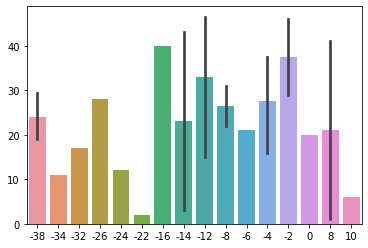

In [22]:
sns.barplot(r[:50],range(50))

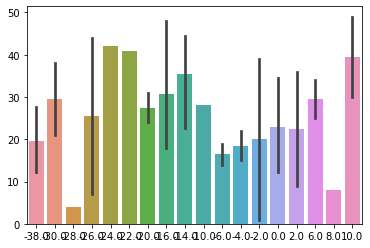

In [23]:
sns.barplot(r[50:100],range(50))

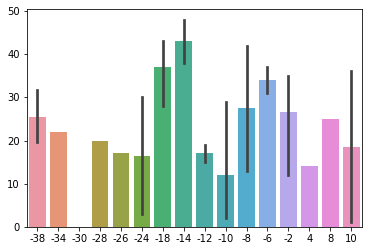

In [25]:
sns.barplot(r[150:200],range(50))

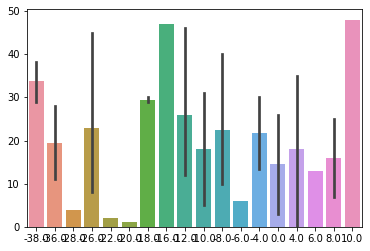

In [26]:
sns.barplot(r[250:300],range(50))

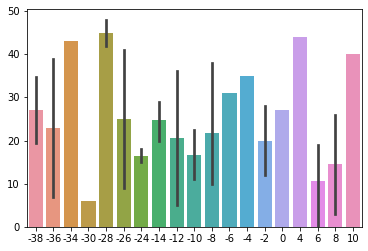

In [27]:
sns.barplot(r[300:350],range(50))

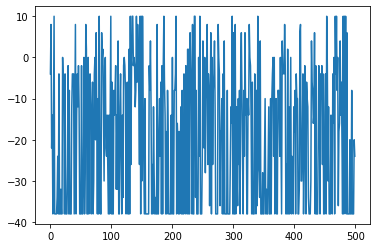

In [28]:
plt.plot(r)

# Experiments to find best parameter

In [30]:
alpha=[]
accuracy=[]
for i in range(10):
    agent=RLAgent(rummy)
    rt,q=agent.train(gamma=0.99,alpha=0.1*i,epsilon=0.1,maxiter=100)
    alpha.append(round((0.1*i),1))
    t=w+l
    accuracy1=((w/t)*100)
    accuracy.append(accuracy1)

**********************************
		Game Starts : {j}
***********************************
19
heet Plays
Player Name : heet 
 Stash Score: 10 
 Stash : 2C, 3S, 5S
.........................[1, 2, 4, 6]
Card in pile H7
[2C, 3S, 5S, 7H]
heet takes action 0
Player Name : heet 
 Stash Score: 17 
 Stash : 2C, 3S, 5S, 7H
heet drops card 2C
Player Name : heet 
 Stash Score: 15 
 Stash : 3S, 5S, 7H
bot Plays
Player Name : bot 
 Stash Score: 9 
 Stash : AS, 6H, 2C
18
heet Plays
Player Name : heet 
 Stash Score: 15 
 Stash : 3S, 5S, 7H
.........................[2, 4, 6, 1]
Card in pile H2
[3S, 5S, 7H, 2H]
heet takes action 0
Player Name : heet 
 Stash Score: 17 
 Stash : 3S, 5S, 7H, 2H
heet drops card 3S
Player Name : heet 
 Stash Score: 14 
 Stash : 5S, 7H, 2H
bot Plays
Player Name : bot 
 Stash Score: 11 
 Stash : 6H, 2C, 3S
17
heet Plays
Player Name : heet 
 Stash Score: 14 
 Stash : 5S, 7H, 2H
.........................[4, 6, 1, 0]
Card in pile SA
[5S, 7H, 2H, AS]
heet takes action 0
Player Na

15
heet Plays
Player Name : heet 
 Stash Score: 17 
 Stash : 3S, 7C, 7S
.........................[2, 6, 6, 1]
Card in pile C2
[3S, 7C, 7S, AH]
heet takes action 1
Player Name : heet 
 Stash Score: 18 
 Stash : 3S, 7C, 7S, AH
heet drops card 3S
Player Name : heet 
 Stash Score: 15 
 Stash : 7C, 7S, AH
bot Plays
Player Name : bot 
 Stash Score: 10 
 Stash : 4C, 3C, 3S
14
heet Plays
Player Name : heet 
 Stash Score: 15 
 Stash : 7C, 7S, AH
.........................[6, 6, 0, 4]
Card in pile D5
[7C, 7S, AH, 5D]
heet takes action 0
Player Name : heet 
 Stash Score: 20 
 Stash : 7C, 7S, AH, 5D
heet drops card 5D
Player Name : heet 
 Stash Score: 15 
 Stash : 7C, 7S, AH
bot Plays
Player Name : bot 
 Stash Score: 7 
 Stash : 3C, 3S, AC
13
heet Plays
Player Name : heet 
 Stash Score: 15 
 Stash : 7C, 7S, AH
.........................[6, 6, 0, 3]
Card in pile C4
[7C, 7S, AH, 4C]
heet takes action 0
Player Name : heet 
 Stash Score: 19 
 Stash : 7C, 7S, AH, 4C
heet drops card 7C
Player Name : heet 

Player Name : heet 
 Stash Score: 10 
 Stash : 5H, 2D, 3D
14
bot Plays
Player Name : bot 
 Stash Score: 12 
 Stash : 4D, 5D, 3S
heet Plays
Player Name : heet 
 Stash Score: 10 
 Stash : 5H, 2D, 3D
.........................[4, 1, 2, 0]
Card in pile HA
[5H, 2D, 3D, AH]
heet takes action 0
Player Name : heet 
 Stash Score: 11 
 Stash : 5H, 2D, 3D, AH
heet drops card 5H
Player Name : heet 
 Stash Score: 6 
 Stash : 2D, 3D, AH
13
bot Plays
Player Name : bot 
 Stash Score: 14 
 Stash : 4D, 5D, 5H
heet Plays
Player Name : heet 
 Stash Score: 6 
 Stash : 2D, 3D, AH
.........................[1, 2, 0, 2]
Card in pile S3
[2D, 3D, AH, 3S]
heet takes action 0
Player Name : heet 
 Stash Score: 9 
 Stash : 2D, 3D, AH, 3S
heet drops card 2D
Player Name : heet 
 Stash Score: 7 
 Stash : 3D, AH, 3S
12
bot Plays
Player Name : bot 
 Stash Score: 14 
 Stash : 4D, 5D, 5H
heet Plays
Player Name : heet 
 Stash Score: 7 
 Stash : 3D, AH, 3S
.........................[2, 0, 2, 1]
Card in pile D2
[3D, AH, 3S, 2D]

heet drops card 7D
Player Name : heet 
 Stash Score: 9 
 Stash : 6C, AH, 2S
17
bot Plays
Player Name : bot 
 Stash Score: 15 
 Stash : 4D, 7H, 4S
heet Plays
Player Name : heet 
 Stash Score: 9 
 Stash : 6C, AH, 2S
.........................[5, 0, 1, 2]
Card in pile S3
[6C, AH, 2S, 3S]
heet takes action 0
Player Name : heet 
 Stash Score: 12 
 Stash : 6C, AH, 2S, 3S
heet drops card 6C
Player Name : heet 
 Stash Score: 6 
 Stash : AH, 2S, 3S
16
bot Plays
Player Name : bot 
 Stash Score: 14 
 Stash : 4D, 4S, 6C
heet Plays
Player Name : heet 
 Stash Score: 6 
 Stash : AH, 2S, 3S
.........................[0, 1, 2, 6]
Card in pile H7
[AH, 2S, 3S, 7H]
heet takes action 0
Player Name : heet 
 Stash Score: 13 
 Stash : AH, 2S, 3S, 7H
heet drops card AH
Player Name : heet 
 Stash Score: 12 
 Stash : 2S, 3S, 7H
15
bot Plays
Player Name : bot 
 Stash Score: 14 
 Stash : 4D, 4S, 6H
heet Plays
Player Name : heet 
 Stash Score: 12 
 Stash : 2S, 3S, 7H
.........................[1, 2, 6, 5]
Card in pile

Card in pile D2
[5S, 5D, 4D, 2D]
heet takes action 0
Player Name : heet 
 Stash Score: 16 
 Stash : 5S, 5D, 4D, 2D
heet drops card 5S
Player Name : heet 
 Stash Score: 11 
 Stash : 5D, 4D, 2D
11
bot Plays
Player Name : bot 
 Stash Score: 16 
 Stash : 5C, 6D, 5S
heet Plays
Player Name : heet 
 Stash Score: 11 
 Stash : 5D, 4D, 2D
.........................[4, 3, 1, 2]
Card in pile C3
[5D, 4D, 2D, 3C]
heet takes action 0
Player Name : heet 
 Stash Score: 14 
 Stash : 5D, 4D, 2D, 3C
heet drops card 5D
Player Name : heet 
 Stash Score: 9 
 Stash : 4D, 2D, 3C
10
bot Plays
Player Name : bot 
 Stash Score: 14 
 Stash : 5C, 6D, 3D
heet Plays
Player Name : heet 
 Stash Score: 9 
 Stash : 4D, 2D, 3C
.........................[3, 1, 2, 4]
Card in pile S5
[4D, 2D, 3C, 5S]
heet takes action 0
Player Name : heet 
 Stash Score: 14 
 Stash : 4D, 2D, 3C, 5S
heet drops card 2D
Player Name : heet 
 Stash Score: 12 
 Stash : 4D, 3C, 5S
9
bot Plays
Player Name : bot 
 Stash Score: 11 
 Stash : 6D, 3D, 2D
hee

Card in pile S6
[2D, AD, 4C, 2C]
heet takes action 1
Player Name : heet 
 Stash Score: 9 
 Stash : 2D, AD, 4C, 2C
heet drops card 2D
Player Name : heet 
 Stash Score: 7 
 Stash : AD, 4C, 2C
18
bot Plays
Player Name : bot 
 Stash Score: 11 
 Stash : 7D, AC, 3H
heet Plays
Player Name : heet 
 Stash Score: 7 
 Stash : AD, 4C, 2C
.........................[0, 3, 1, 4]
Card in pile C5
[AD, 4C, 2C, 5C]
heet takes action 0
Player Name : heet 
 Stash Score: 12 
 Stash : AD, 4C, 2C, 5C
heet drops card AD
Player Name : heet 
 Stash Score: 11 
 Stash : 4C, 2C, 5C
17
bot Plays
Player Name : bot 
 Stash Score: 11 
 Stash : 7D, AC, 3D
heet Plays
Player Name : heet 
 Stash Score: 11 
 Stash : 4C, 2C, 5C
.........................[3, 1, 4, 2]
Card in pile H3
[4C, 2C, 5C, 6D]
heet takes action 1
Player Name : heet 
 Stash Score: 17 
 Stash : 4C, 2C, 5C, 6D
heet drops card 4C
Player Name : heet 
 Stash Score: 13 
 Stash : 2C, 5C, 6D
16
bot Plays
Player Name : bot 
 Stash Score: 8 
 Stash : AC, 3D, 4C
heet

1
heet Plays
Player Name : heet 
 Stash Score: 9 
 Stash : 2C, 4D, 3H
.........................[1, 3, 2, 5]
Card in pile C6
[2C, 4D, 3H, 6C]
heet takes action 0
Player Name : heet 
 Stash Score: 15 
 Stash : 2C, 4D, 3H, 6C
heet drops card 3H
Player Name : heet 
 Stash Score: 12 
 Stash : 2C, 4D, 6C
bot Plays
Player Name : bot 
 Stash Score: 7 
 Stash : 2D, 3S, 2S
0
**********************************
		Game Starts : {j}
***********************************
19
heet Plays
Player Name : heet 
 Stash Score: 7 
 Stash : 4S, 2H, AD
.........................[3, 1, 0, 5]
Card in pile C6
[4S, 2H, AD, 3C]
heet takes action 1
Player Name : heet 
 Stash Score: 10 
 Stash : 4S, 2H, AD, 3C
heet drops card 4S
Player Name : heet 
 Stash Score: 6 
 Stash : 2H, AD, 3C
bot Plays
Player Name : bot 
 Stash Score: 12 
 Stash : 5H, 5C, 2S
18
heet Plays
Player Name : heet 
 Stash Score: 6 
 Stash : 2H, AD, 3C
.........................[1, 0, 2, 0]
Card in pile CA
[2H, AD, 3C, AC]
heet takes action 0
Player Name 

14
heet Plays
Player Name : heet 
 Stash Score: 16 
 Stash : 5H, 6C, 5C
.........................[4, 5, 4, 6]
Card in pile D7
[5H, 6C, 5C, 7D]
heet takes action 0
Player Name : heet 
 Stash Score: 23 
 Stash : 5H, 6C, 5C, 7D
heet drops card 5H
Player Name : heet 
 Stash Score: 18 
 Stash : 6C, 5C, 7D
bot Plays
Player Name : bot 
 Stash Score: 7 
 Stash : 2C, 3C, 2S
13
heet Plays
Player Name : heet 
 Stash Score: 18 
 Stash : 6C, 5C, 7D
.........................[5, 4, 6, 4]
Card in pile H5
[6C, 5C, 7D, 5H]
heet takes action 0
Player Name : heet 
 Stash Score: 23 
 Stash : 6C, 5C, 7D, 5H
heet drops card 6C
Player Name : heet 
 Stash Score: 17 
 Stash : 5C, 7D, 5H
bot Plays
Player Name : bot 
 Stash Score: 7 
 Stash : 2C, 3C, 2S
12
heet Plays
Player Name : heet 
 Stash Score: 17 
 Stash : 5C, 7D, 5H
.........................[4, 6, 4, 2]
Card in pile H3
[5C, 7D, 5H, 3H]
heet takes action 0
Player Name : heet 
 Stash Score: 20 
 Stash : 5C, 7D, 5H, 3H
heet drops card 5C
Player Name : heet 


Player Name : bot 
 Stash Score: 16 
 Stash : 6H, 5C, 5S
9
heet Plays
Player Name : heet 
 Stash Score: 10 
 Stash : 3C, 4C, 3D
.........................[2, 3, 2, 1]
Card in pile C2
[3C, 4C, 3D, 2C]
heet takes action 0
Player Name : heet 
 Stash Score: 12 
 Stash : 3C, 4C, 3D, 2C
heet drops card 3C
Player Name : heet 
 Stash Score: 9 
 Stash : 4C, 3D, 2C
bot Plays
Player Name : bot 
 Stash Score: 16 
 Stash : 6H, 5C, 5S
8
heet Plays
Player Name : heet 
 Stash Score: 9 
 Stash : 4C, 3D, 2C
.........................[3, 2, 1, 3]
Card in pile H4
[4C, 3D, 2C, 4H]
heet takes action 0
Player Name : heet 
 Stash Score: 13 
 Stash : 4C, 3D, 2C, 4H
heet drops card 4C
Player Name : heet 
 Stash Score: 9 
 Stash : 3D, 2C, 4H
bot Plays
Player Name : bot 
 Stash Score: 14 
 Stash : 6H, 5S, 3H
7
heet Plays
Player Name : heet 
 Stash Score: 9 
 Stash : 3D, 2C, 4H
.........................[2, 1, 3, 4]
Card in pile C5
[3D, 2C, 4H, 6D]
heet takes action 1
Player Name : heet 
 Stash Score: 15 
 Stash : 3D

15
heet Plays
Player Name : heet 
 Stash Score: 9 
 Stash : 2S, 4S, 3S
.........................[1, 3, 2, 4]
Card in pile C5
[2S, 4S, 3S, 6D]
heet takes action 1
Player Name : heet 
 Stash Score: 15 
 Stash : 2S, 4S, 3S, 6D
heet drops card 2S
Player Name : heet 
 Stash Score: 13 
 Stash : 4S, 3S, 6D
bot Plays
Player Name : bot 
 Stash Score: 8 
 Stash : 2D, 4C, 2S
14
heet Plays
Player Name : heet 
 Stash Score: 13 
 Stash : 4S, 3S, 6D
.........................[3, 2, 5, 6]
Card in pile H7
[4S, 3S, 6D, 7H]
heet takes action 0
Player Name : heet 
 Stash Score: 20 
 Stash : 4S, 3S, 6D, 7H
heet drops card 3S
Player Name : heet 
 Stash Score: 17 
 Stash : 4S, 6D, 7H
bot Plays
Player Name : bot 
 Stash Score: 7 
 Stash : 2D, 2S, 3D
13
heet Plays
Player Name : heet 
 Stash Score: 17 
 Stash : 4S, 6D, 7H
.........................[3, 5, 6, 3]
Card in pile C4
[4S, 6D, 7H, 4C]
heet takes action 0
Player Name : heet 
 Stash Score: 21 
 Stash : 4S, 6D, 7H, 4C
heet drops card 4S
Player Name : heet 
 

heet takes action 0
Player Name : heet 
 Stash Score: 11 
 Stash : 2C, 5S, AS, 3D
heet drops card 2C
Player Name : heet 
 Stash Score: 9 
 Stash : 5S, AS, 3D
9
bot Plays
Player Name : bot 
 Stash Score: 19 
 Stash : 5H, 7S, 7D
heet Plays
Player Name : heet 
 Stash Score: 9 
 Stash : 5S, AS, 3D
.........................[4, 0, 2, 5]
Card in pile C6
[5S, AS, 3D, AC]
heet takes action 1
Player Name : heet 
 Stash Score: 10 
 Stash : 5S, AS, 3D, AC
heet drops card AS
Player Name : heet 
 Stash Score: 9 
 Stash : 5S, 3D, AC
8
bot Plays
Player Name : bot 
 Stash Score: 13 
 Stash : 5H, 7D, AS
heet Plays
Player Name : heet 
 Stash Score: 9 
 Stash : 5S, 3D, AC
.........................[4, 2, 0, 6]
Card in pile S7
[5S, 3D, AC, 7S]
heet takes action 0
Player Name : heet 
 Stash Score: 16 
 Stash : 5S, 3D, AC, 7S
heet drops card 7S
Player Name : heet 
 Stash Score: 9 
 Stash : 5S, 3D, AC
7
bot Plays
Player Name : bot 
 Stash Score: 13 
 Stash : 5H, AS, 7S
heet Plays
Player Name : heet 
 Stash Sco

 Stash : 6C, AH, 2C
bot Plays
Player Name : bot 
 Stash Score: 10 
 Stash : AS, 3S, 6S
18
heet Plays
Player Name : heet 
 Stash Score: 9 
 Stash : 6C, AH, 2C
.........................[5, 0, 1, 3]
Card in pile C4
[6C, AH, 2C, 4C]
heet takes action 0
Player Name : heet 
 Stash Score: 13 
 Stash : 6C, AH, 2C, 4C
heet drops card 6C
Player Name : heet 
 Stash Score: 7 
 Stash : AH, 2C, 4C
bot Plays
Player Name : bot 
 Stash Score: 10 
 Stash : AS, 3S, 6S
17
heet Plays
Player Name : heet 
 Stash Score: 7 
 Stash : AH, 2C, 4C
.........................[0, 1, 3, 1]
Card in pile S2
[AH, 2C, 4C, 2S]
heet takes action 0
Player Name : heet 
 Stash Score: 9 
 Stash : AH, 2C, 4C, 2S
heet drops card AH
Player Name : heet 
 Stash Score: 8 
 Stash : 2C, 4C, 2S
bot Plays
Player Name : bot 
 Stash Score: 10 
 Stash : AS, 6S, 3H
16
heet Plays
Player Name : heet 
 Stash Score: 8 
 Stash : 2C, 4C, 2S
.........................[1, 3, 1, 2]
Card in pile S3
[2C, 4C, 2S, 3S]
heet takes action 0
Player Name : heet

bot Plays
Player Name : bot 
 Stash Score: 14 
 Stash : AS, 6S, 7C
heet Plays
Player Name : heet 
 Stash Score: 17 
 Stash : 6H, 4S, 7S
.........................[5, 3, 6, 5]
Card in pile C6
[6H, 4S, 7S, 6C]
heet takes action 0
Player Name : heet 
 Stash Score: 23 
 Stash : 6H, 4S, 7S, 6C
heet drops card 4S
Player Name : heet 
 Stash Score: 19 
 Stash : 6H, 7S, 6C
17
bot Plays
Player Name : bot 
 Stash Score: 12 
 Stash : AS, 7C, 4S
heet Plays
Player Name : heet 
 Stash Score: 19 
 Stash : 6H, 7S, 6C
.........................[5, 6, 5, 5]
Card in pile S6
[6H, 7S, 6C, 6S]
heet takes action 0
heet Wins the round
Player Name : heet 
 Stash Score: 0 
 Stash : 
**********************************
		Game Starts : {j}
***********************************
19
bot Plays
Player Name : bot 
 Stash Score: 14 
 Stash : 4H, 5D, 5S
heet Plays
Player Name : heet 
 Stash Score: 10 
 Stash : 2H, 2C, 6S
.........................[1, 1, 5, 1]
Card in pile D2
[2H, 2C, 6S, 2D]
heet takes action 0
heet Wins the ro

heet takes action 1
Player Name : heet 
 Stash Score: 16 
 Stash : 3D, 5D, AD, 7S
heet drops card 5D
Player Name : heet 
 Stash Score: 11 
 Stash : 3D, AD, 7S
bot Plays
Player Name : bot 
 Stash Score: 0 
 Stash : 
**********************************
		Game Starts : {j}
***********************************
19
bot Plays
Player Name : bot 
 Stash Score: 15 
 Stash : 5D, 4H, 6H
heet Plays
Player Name : heet 
 Stash Score: 11 
 Stash : 2D, 3H, 6C
.........................[1, 2, 5, 0]
Card in pile CA
[2D, 3H, 6C, AC]
heet takes action 0
Player Name : heet 
 Stash Score: 12 
 Stash : 2D, 3H, 6C, AC
heet drops card 3H
Player Name : heet 
 Stash Score: 9 
 Stash : 2D, 6C, AC
18
bot Plays
Player Name : bot 
 Stash Score: 15 
 Stash : 5D, 4H, 6H
heet Plays
Player Name : heet 
 Stash Score: 9 
 Stash : 2D, 6C, AC
.........................[1, 5, 0, 2]
Card in pile D3
[2D, 6C, AC, 3D]
heet takes action 0
Player Name : heet 
 Stash Score: 12 
 Stash : 2D, 6C, AC, 3D
heet drops card 6C
Player Name : he

18
bot Plays
Player Name : bot 
 Stash Score: 12 
 Stash : 6C, 3H, 3D
heet Plays
Player Name : heet 
 Stash Score: 12 
 Stash : 2S, 5C, 5D
.........................[1, 4, 4, 5]
Card in pile S6
[2S, 5C, 5D, 6S]
heet takes action 0
Player Name : heet 
 Stash Score: 18 
 Stash : 2S, 5C, 5D, 6S
heet drops card 6S
Player Name : heet 
 Stash Score: 12 
 Stash : 2S, 5C, 5D
17
bot Plays
Player Name : bot 
 Stash Score: 15 
 Stash : 6C, 3D, 6S
heet Plays
Player Name : heet 
 Stash Score: 12 
 Stash : 2S, 5C, 5D
.........................[1, 4, 4, 2]
Card in pile H3
[2S, 5C, 5D, 3H]
heet takes action 0
Player Name : heet 
 Stash Score: 15 
 Stash : 2S, 5C, 5D, 3H
heet drops card 5C
Player Name : heet 
 Stash Score: 10 
 Stash : 2S, 5D, 3H
16
bot Plays
Player Name : bot 
 Stash Score: 15 
 Stash : 6C, 3D, 6S
heet Plays
Player Name : heet 
 Stash Score: 10 
 Stash : 2S, 5D, 3H
.........................[1, 4, 2, 0]
Card in pile DA
[2S, 5D, 3H, AD]
heet takes action 0
Player Name : heet 
 Stash Score

Player Name : heet 
 Stash Score: 8 
 Stash : 3C, 4H, AS
.........................[2, 3, 0, 1]
Card in pile C2
[3C, 4H, AS, AD]
heet takes action 1
Player Name : heet 
 Stash Score: 9 
 Stash : 3C, 4H, AS, AD
heet drops card 4H
Player Name : heet 
 Stash Score: 5 
 Stash : 3C, AS, AD
5
bot Plays
Player Name : bot 
 Stash Score: 15 
 Stash : 3S, 6D, 6H
heet Plays
Player Name : heet 
 Stash Score: 5 
 Stash : 3C, AS, AD
.........................[2, 0, 0, 3]
Card in pile H4
[3C, AS, AD, 4H]
heet takes action 0
Player Name : heet 
 Stash Score: 9 
 Stash : 3C, AS, AD, 4H
heet drops card AS
Player Name : heet 
 Stash Score: 8 
 Stash : 3C, AD, 4H
4
bot Plays
Player Name : bot 
 Stash Score: 16 
 Stash : 3S, 6D, 7D
heet Plays
Player Name : heet 
 Stash Score: 8 
 Stash : 3C, AD, 4H
.........................[2, 0, 3, 5]
Card in pile H6
[3C, AD, 4H, 6H]
heet takes action 0
Player Name : heet 
 Stash Score: 14 
 Stash : 3C, AD, 4H, 6H
heet drops card 4H
Player Name : heet 
 Stash Score: 10 
 St

heet Plays
Player Name : heet 
 Stash Score: 13 
 Stash : AS, 5C, 7C
.........................[0, 4, 6, 3]
Card in pile D4
[AS, 5C, 7C, 4D]
heet takes action 0
Player Name : heet 
 Stash Score: 17 
 Stash : AS, 5C, 7C, 4D
heet drops card AS
Player Name : heet 
 Stash Score: 16 
 Stash : 5C, 7C, 4D
bot Plays
Player Name : bot 
 Stash Score: 9 
 Stash : 6C, 2H, AS
10
heet Plays
Player Name : heet 
 Stash Score: 16 
 Stash : 5C, 7C, 4D
.........................[4, 6, 3, 4]
Card in pile D5
[5C, 7C, 4D, 5D]
heet takes action 0
Player Name : heet 
 Stash Score: 21 
 Stash : 5C, 7C, 4D, 5D
heet drops card 5C
Player Name : heet 
 Stash Score: 16 
 Stash : 7C, 4D, 5D
bot Plays
Player Name : bot 
 Stash Score: 11 
 Stash : 6C, AS, 4C
9
heet Plays
Player Name : heet 
 Stash Score: 16 
 Stash : 7C, 4D, 5D
.........................[6, 3, 4, 1]
Card in pile H2
[7C, 4D, 5D, 2H]
heet takes action 0
Player Name : heet 
 Stash Score: 18 
 Stash : 7C, 4D, 5D, 2H
heet drops card 7C
Player Name : heet 
 St

 Stash : 4H, 5S, 6H, 3H
heet drops card 4H
Player Name : heet 
 Stash Score: 14 
 Stash : 5S, 6H, 3H
bot Plays
Player Name : bot 
 Stash Score: 8 
 Stash : 4D, 3S, AS
3
heet Plays
Player Name : heet 
 Stash Score: 14 
 Stash : 5S, 6H, 3H
.........................[4, 5, 2, 1]
Card in pile C2
[5S, 6H, 3H, 7D]
heet takes action 1
Player Name : heet 
 Stash Score: 21 
 Stash : 5S, 6H, 3H, 7D
heet drops card 6H
Player Name : heet 
 Stash Score: 15 
 Stash : 5S, 3H, 7D
bot Plays
Player Name : bot 
 Stash Score: 8 
 Stash : 4D, 3S, AS
2
heet Plays
Player Name : heet 
 Stash Score: 15 
 Stash : 5S, 3H, 7D
.........................[4, 2, 6, 5]
Card in pile H6
[5S, 3H, 7D, 6H]
heet takes action 0
Player Name : heet 
 Stash Score: 21 
 Stash : 5S, 3H, 7D, 6H
heet drops card 5S
Player Name : heet 
 Stash Score: 16 
 Stash : 3H, 7D, 6H
bot Plays
Player Name : bot 
 Stash Score: 9 
 Stash : 3S, AS, 5C
1
heet Plays
Player Name : heet 
 Stash Score: 16 
 Stash : 3H, 7D, 6H
.........................[2,

***********************************
19
bot Plays
Player Name : bot 
 Stash Score: 14 
 Stash : 6D, 6H, 2S
heet Plays
Player Name : heet 
 Stash Score: 12 
 Stash : 4S, 6C, 2C
.........................[3, 5, 1, 1]
Card in pile D2
[4S, 6C, 2C, 2D]
heet takes action 0
Player Name : heet 
 Stash Score: 14 
 Stash : 4S, 6C, 2C, 2D
heet drops card 2C
Player Name : heet 
 Stash Score: 12 
 Stash : 4S, 6C, 2D
18
bot Plays
Player Name : bot 
 Stash Score: 10 
 Stash : 6D, 2S, 2C
heet Plays
Player Name : heet 
 Stash Score: 12 
 Stash : 4S, 6C, 2D
.........................[3, 5, 1, 5]
Card in pile H6
[4S, 6C, 2D, 6H]
heet takes action 0
Player Name : heet 
 Stash Score: 18 
 Stash : 4S, 6C, 2D, 6H
heet drops card 4S
Player Name : heet 
 Stash Score: 14 
 Stash : 6C, 2D, 6H
17
bot Plays
Player Name : bot 
 Stash Score: 12 
 Stash : 6D, 2S, 4S
heet Plays
Player Name : heet 
 Stash Score: 14 
 Stash : 6C, 2D, 6H
.........................[5, 1, 5, 1]
Card in pile C2
[6C, 2D, 6H, 2C]
heet takes actio

.........................[2, 6, 3, 3]
Card in pile C4
[3C, 7D, 4D, 7C]
heet takes action 1
Player Name : heet 
 Stash Score: 21 
 Stash : 3C, 7D, 4D, 7C
heet drops card 4D
Player Name : heet 
 Stash Score: 17 
 Stash : 3C, 7D, 7C
bot Plays
Player Name : bot 
 Stash Score: 13 
 Stash : 7H, 5S, AS
7
heet Plays
Player Name : heet 
 Stash Score: 17 
 Stash : 3C, 7D, 7C
.........................[2, 6, 6, 3]
Card in pile D4
[3C, 7D, 7C, 4D]
heet takes action 0
Player Name : heet 
 Stash Score: 21 
 Stash : 3C, 7D, 7C, 4D
heet drops card 3C
Player Name : heet 
 Stash Score: 18 
 Stash : 7D, 7C, 4D
bot Plays
Player Name : bot 
 Stash Score: 8 
 Stash : 5S, AS, 2H
6
heet Plays
Player Name : heet 
 Stash Score: 18 
 Stash : 7D, 7C, 4D
.........................[6, 6, 3, 6]
Card in pile H7
[7D, 7C, 4D, 7H]
heet takes action 0
heet Wins the round
Player Name : heet 
 Stash Score: 0 
 Stash : 
**********************************
		Game Starts : {j}
***********************************
19
bot Plays
Pla

 Stash : 7H, 3C, 2H
heet Plays
Player Name : heet 
 Stash Score: 17 
 Stash : 7C, 5H, 5S
.........................[6, 4, 4, 4]
Card in pile C5
[7C, 5H, 5S, 5C]
heet takes action 0
heet Wins the round
Player Name : heet 
 Stash Score: 0 
 Stash : 
**********************************
		Game Starts : {j}
***********************************
19
bot Plays
Player Name : bot 
 Stash Score: 14 
 Stash : AD, 7C, 6H
heet Plays
Player Name : heet 
 Stash Score: 10 
 Stash : AS, 3S, 6D
.........................[0, 2, 5, 2]
Card in pile C3
[AS, 3S, 6D, 7D]
heet takes action 1
Player Name : heet 
 Stash Score: 17 
 Stash : AS, 3S, 6D, 7D
heet drops card AS
Player Name : heet 
 Stash Score: 16 
 Stash : 3S, 6D, 7D
18
bot Plays
Player Name : bot 
 Stash Score: 9 
 Stash : AD, 7C, AS
heet Plays
Player Name : heet 
 Stash Score: 16 
 Stash : 3S, 6D, 7D
.........................[2, 5, 6, 5]
Card in pile H6
[3S, 6D, 7D, 6H]
heet takes action 0
Player Name : heet 
 Stash Score: 22 
 Stash : 3S, 6D, 7D, 6H
he

18
heet Plays
Player Name : heet 
 Stash Score: 11 
 Stash : 4D, 3D, 4S
.........................[3, 2, 3, 6]
Card in pile C7
[4D, 3D, 4S, 7C]
heet takes action 0
Player Name : heet 
 Stash Score: 18 
 Stash : 4D, 3D, 4S, 7C
heet drops card 4D
Player Name : heet 
 Stash Score: 14 
 Stash : 3D, 4S, 7C
bot Plays
Player Name : bot 
 Stash Score: 12 
 Stash : 7H, 2C, 3H
17
heet Plays
Player Name : heet 
 Stash Score: 14 
 Stash : 3D, 4S, 7C
.........................[2, 3, 6, 5]
Card in pile H6
[3D, 4S, 7C, 6H]
heet takes action 0
Player Name : heet 
 Stash Score: 20 
 Stash : 3D, 4S, 7C, 6H
heet drops card 7C
Player Name : heet 
 Stash Score: 13 
 Stash : 3D, 4S, 6H
bot Plays
Player Name : bot 
 Stash Score: 14 
 Stash : 7H, 3H, 4H
16
heet Plays
Player Name : heet 
 Stash Score: 13 
 Stash : 3D, 4S, 6H
.........................[2, 3, 5, 1]
Card in pile C2
[3D, 4S, 6H, 2C]
heet takes action 0
Player Name : heet 
 Stash Score: 15 
 Stash : 3D, 4S, 6H, 2C
heet drops card 4S
Player Name : heet

heet drops card 6H
Player Name : heet 
 Stash Score: 12 
 Stash : 5C, 5H, 2D
8
bot Plays
Player Name : bot 
 Stash Score: 12 
 Stash : 4S, AD, 7C
heet Plays
Player Name : heet 
 Stash Score: 12 
 Stash : 5C, 5H, 2D
.........................[4, 4, 1, 1]
Card in pile C2
[5C, 5H, 2D, 2S]
heet takes action 1
Player Name : heet 
 Stash Score: 14 
 Stash : 5C, 5H, 2D, 2S
heet drops card 5C
Player Name : heet 
 Stash Score: 9 
 Stash : 5H, 2D, 2S
7
bot Plays
Player Name : bot 
 Stash Score: 11 
 Stash : AD, 7C, 3C
heet Plays
Player Name : heet 
 Stash Score: 9 
 Stash : 5H, 2D, 2S
.........................[4, 1, 1, 3]
Card in pile S4
[5H, 2D, 2S, 4H]
heet takes action 1
Player Name : heet 
 Stash Score: 13 
 Stash : 5H, 2D, 2S, 4H
heet drops card 2D
Player Name : heet 
 Stash Score: 11 
 Stash : 5H, 2S, 4H
6
bot Plays
Player Name : bot 
 Stash Score: 9 
 Stash : AD, 3C, 5D
heet Plays
Player Name : heet 
 Stash Score: 11 
 Stash : 5H, 2S, 4H
.........................[4, 1, 3, 6]
Card in pile C

[4C, 3H, 4H, 5C]
heet takes action 1
Player Name : heet 
 Stash Score: 16 
 Stash : 4C, 3H, 4H, 5C
heet drops card 4C
Player Name : heet 
 Stash Score: 12 
 Stash : 3H, 4H, 5C
bot Plays
Player Name : bot 
 Stash Score: 10 
 Stash : AH, 3S, 6D
14
heet Plays
Player Name : heet 
 Stash Score: 12 
 Stash : 3H, 4H, 5C
.........................[2, 3, 4, 1]
Card in pile H2
[3H, 4H, 5C, AD]
heet takes action 1
Player Name : heet 
 Stash Score: 13 
 Stash : 3H, 4H, 5C, AD
heet drops card 4H
Player Name : heet 
 Stash Score: 9 
 Stash : 3H, 5C, AD
bot Plays
Player Name : bot 
 Stash Score: 8 
 Stash : AH, 3S, 4H
13
heet Plays
Player Name : heet 
 Stash Score: 9 
 Stash : 3H, 5C, AD
.........................[2, 4, 0, 5]
Card in pile D6
[3H, 5C, AD, 6D]
heet takes action 0
Player Name : heet 
 Stash Score: 15 
 Stash : 3H, 5C, AD, 6D
heet drops card 5C
Player Name : heet 
 Stash Score: 10 
 Stash : 3H, AD, 6D
bot Plays
Player Name : bot 
 Stash Score: 10 
 Stash : AH, 4H, 5C
12
heet Plays
Player N

heet drops card 3D
Player Name : heet 
 Stash Score: 8 
 Stash : 2S, 2D, 4C
bot Plays
Player Name : bot 
 Stash Score: 10 
 Stash : 6S, AS, 3D
5
heet Plays
Player Name : heet 
 Stash Score: 8 
 Stash : 2S, 2D, 4C
.........................[1, 1, 3, 6]
Card in pile H7
[2S, 2D, 4C, 6C]
heet takes action 1
Player Name : heet 
 Stash Score: 14 
 Stash : 2S, 2D, 4C, 6C
heet drops card 4C
Player Name : heet 
 Stash Score: 10 
 Stash : 2S, 2D, 6C
bot Plays
Player Name : bot 
 Stash Score: 11 
 Stash : 6S, AS, 4C
4
heet Plays
Player Name : heet 
 Stash Score: 10 
 Stash : 2S, 2D, 6C
.........................[1, 1, 5, 2]
Card in pile D3
[2S, 2D, 6C, 5S]
heet takes action 1
Player Name : heet 
 Stash Score: 15 
 Stash : 2S, 2D, 6C, 5S
heet drops card 2S
Player Name : heet 
 Stash Score: 13 
 Stash : 2D, 6C, 5S
bot Plays
Player Name : bot 
 Stash Score: 11 
 Stash : 6S, AS, 4H
3
heet Plays
Player Name : heet 
 Stash Score: 13 
 Stash : 2D, 6C, 5S
.........................[1, 5, 4, 3]
Card in pile 

[5S, AD, 3C, 4H]
heet takes action 1
Player Name : heet 
 Stash Score: 13 
 Stash : 5S, AD, 3C, 4H
heet drops card AD
Player Name : heet 
 Stash Score: 12 
 Stash : 5S, 3C, 4H
bot Plays
Player Name : bot 
 Stash Score: 14 
 Stash : 2C, 6C, 6H
15
heet Plays
Player Name : heet 
 Stash Score: 12 
 Stash : 5S, 3C, 4H
.........................[4, 2, 3, 6]
Card in pile D7
[5S, 3C, 4H, 7D]
heet takes action 0
Player Name : heet 
 Stash Score: 19 
 Stash : 5S, 3C, 4H, 7D
heet drops card 7D
Player Name : heet 
 Stash Score: 12 
 Stash : 5S, 3C, 4H
bot Plays
Player Name : bot 
 Stash Score: 15 
 Stash : 6C, 6H, 3H
14
heet Plays
Player Name : heet 
 Stash Score: 12 
 Stash : 5S, 3C, 4H
.........................[4, 2, 3, 1]
Card in pile C2
[5S, 3C, 4H, 5D]
heet takes action 1
Player Name : heet 
 Stash Score: 17 
 Stash : 5S, 3C, 4H, 5D
heet drops card 4H
Player Name : heet 
 Stash Score: 13 
 Stash : 5S, 3C, 5D
bot Plays
Player Name : bot 
 Stash Score: 15 
 Stash : 6C, 6H, 3H
13
heet Plays
Playe

Player Name : bot 
 Stash Score: 12 
 Stash : 4D, 7D, AS
heet Plays
Player Name : heet 
 Stash Score: 16 
 Stash : 3H, 7C, 6S
.........................[2, 6, 5, 0]
Card in pile CA
[3H, 7C, 6S, 4H]
heet takes action 1
Player Name : heet 
 Stash Score: 20 
 Stash : 3H, 7C, 6S, 4H
heet drops card 7C
Player Name : heet 
 Stash Score: 13 
 Stash : 3H, 6S, 4H
16
bot Plays
Player Name : bot 
 Stash Score: 9 
 Stash : 7D, AS, AH
heet Plays
Player Name : heet 
 Stash Score: 13 
 Stash : 3H, 6S, 4H
.........................[2, 5, 3, 3]
Card in pile D4
[3H, 6S, 4H, 4D]
heet takes action 0
Player Name : heet 
 Stash Score: 17 
 Stash : 3H, 6S, 4H, 4D
heet drops card 3H
Player Name : heet 
 Stash Score: 14 
 Stash : 6S, 4H, 4D
15
bot Plays
Player Name : bot 
 Stash Score: 9 
 Stash : 7D, AS, AH
heet Plays
Player Name : heet 
 Stash Score: 14 
 Stash : 6S, 4H, 4D
.........................[5, 3, 3, 2]
Card in pile H3
[6S, 4H, 4D, 3H]
heet takes action 0
Player Name : heet 
 Stash Score: 17 
 Stash : 

heet takes action 1
Player Name : heet 
 Stash Score: 15 
 Stash : 7S, 5C, AH, 2H
heet drops card 7S
Player Name : heet 
 Stash Score: 8 
 Stash : 5C, AH, 2H
14
bot Plays
Player Name : bot 
 Stash Score: 9 
 Stash : 5H, 3D, AD
heet Plays
Player Name : heet 
 Stash Score: 8 
 Stash : 5C, AH, 2H
.........................[4, 0, 1, 5]
Card in pile C6
[5C, AH, 2H, 3C]
heet takes action 1
Player Name : heet 
 Stash Score: 11 
 Stash : 5C, AH, 2H, 3C
heet drops card 5C
Player Name : heet 
 Stash Score: 6 
 Stash : AH, 2H, 3C
13
bot Plays
Player Name : bot 
 Stash Score: 9 
 Stash : 3D, AD, 5C
heet Plays
Player Name : heet 
 Stash Score: 6 
 Stash : AH, 2H, 3C
.........................[0, 1, 2, 4]
Card in pile H5
[AH, 2H, 3C, 2C]
heet takes action 1
Player Name : heet 
 Stash Score: 8 
 Stash : AH, 2H, 3C, 2C
heet drops card AH
Player Name : heet 
 Stash Score: 7 
 Stash : 2H, 3C, 2C
12
bot Plays
Player Name : bot 
 Stash Score: 9 
 Stash : 3D, 5C, AH
heet Plays
Player Name : heet 
 Stash Scor

heet takes action 1
Player Name : heet 
 Stash Score: 11 
 Stash : 5C, 2H, AS, 3S
heet drops card 2H
Player Name : heet 
 Stash Score: 9 
 Stash : 5C, AS, 3S
1
bot Plays
Player Name : bot 
 Stash Score: 16 
 Stash : 5H, 7C, 4H
heet Plays
Player Name : heet 
 Stash Score: 9 
 Stash : 5C, AS, 3S
.........................[4, 0, 2, 6]
Card in pile H7
[5C, AS, 3S, 7H]
heet takes action 0
Player Name : heet 
 Stash Score: 16 
 Stash : 5C, AS, 3S, 7H
heet drops card 5C
Player Name : heet 
 Stash Score: 11 
 Stash : AS, 3S, 7H
0
**********************************
		Game Starts : {j}
***********************************
19
heet Plays
Player Name : heet 
 Stash Score: 11 
 Stash : 7D, 2D, 2S
.........................[6, 1, 1, 2]
Card in pile S3
[7D, 2D, 2S, 3S]
heet takes action 0
Player Name : heet 
 Stash Score: 14 
 Stash : 7D, 2D, 2S, 3S
heet drops card 2D
Player Name : heet 
 Stash Score: 12 
 Stash : 7D, 2S, 3S
bot Plays
Player Name : bot 
 Stash Score: 10 
 Stash : 7C, AD, 2D
18
heet Plays

Card in pile H5
[5S, 3C, 2S, 5H]
heet takes action 0
Player Name : heet 
 Stash Score: 15 
 Stash : 5S, 3C, 2S, 5H
heet drops card 3C
Player Name : heet 
 Stash Score: 12 
 Stash : 5S, 2S, 5H
15
bot Plays
Player Name : bot 
 Stash Score: 10 
 Stash : 5C, AD, 4C
heet Plays
Player Name : heet 
 Stash Score: 12 
 Stash : 5S, 2S, 5H
.........................[4, 1, 4, 3]
Card in pile D4
[5S, 2S, 5H, 4D]
heet takes action 0
Player Name : heet 
 Stash Score: 16 
 Stash : 5S, 2S, 5H, 4D
heet drops card 2S
Player Name : heet 
 Stash Score: 14 
 Stash : 5S, 5H, 4D
14
bot Plays
Player Name : bot 
 Stash Score: 10 
 Stash : 5C, AD, 4C
heet Plays
Player Name : heet 
 Stash Score: 14 
 Stash : 5S, 5H, 4D
.........................[4, 4, 3, 1]
Card in pile S2
[5S, 5H, 4D, 6H]
heet takes action 1
Player Name : heet 
 Stash Score: 20 
 Stash : 5S, 5H, 4D, 6H
heet drops card 5H
Player Name : heet 
 Stash Score: 15 
 Stash : 5S, 4D, 6H
13
bot Plays
Player Name : bot 
 Stash Score: 11 
 Stash : 5C, AD, 5H


Card in pile S3
[6D, AH, 4S, AC]
heet takes action 1
Player Name : heet 
 Stash Score: 12 
 Stash : 6D, AH, 4S, AC
heet drops card 6D
Player Name : heet 
 Stash Score: 6 
 Stash : AH, 4S, AC
bot Plays
Player Name : bot 
 Stash Score: 9 
 Stash : AS, 2D, 6D
12
heet Plays
Player Name : heet 
 Stash Score: 6 
 Stash : AH, 4S, AC
.........................[0, 3, 0, 6]
Card in pile D7
[AH, 4S, AC, 4D]
heet takes action 1
Player Name : heet 
 Stash Score: 10 
 Stash : AH, 4S, AC, 4D
heet drops card AC
Player Name : heet 
 Stash Score: 9 
 Stash : AH, 4S, 4D
bot Plays
Player Name : bot 
 Stash Score: 4 
 Stash : AS, 2D, AC
11
heet Plays
Player Name : heet 
 Stash Score: 9 
 Stash : AH, 4S, 4D
.........................[0, 3, 3, 5]
Card in pile D6
[AH, 4S, 4D, 6D]
heet takes action 0
Player Name : heet 
 Stash Score: 15 
 Stash : AH, 4S, 4D, 6D
heet drops card AH
Player Name : heet 
 Stash Score: 14 
 Stash : 4S, 4D, 6D
bot Plays
Player Name : bot 
 Stash Score: 4 
 Stash : AS, 2D, AC
10
heet Pl

Card in pile DA
[2S, 4H, 7C, 7H]
heet takes action 1
Player Name : heet 
 Stash Score: 20 
 Stash : 2S, 4H, 7C, 7H
heet drops card 4H
Player Name : heet 
 Stash Score: 16 
 Stash : 2S, 7C, 7H
bot Plays
Player Name : bot 
 Stash Score: 12 
 Stash : 4S, 2C, 6D
8
heet Plays
Player Name : heet 
 Stash Score: 16 
 Stash : 2S, 7C, 7H
.........................[1, 6, 6, 6]
Card in pile D7
[2S, 7C, 7H, 7D]
heet takes action 0
heet Wins the round
Player Name : heet 
 Stash Score: 0 
 Stash : 
**********************************
		Game Starts : {j}
***********************************
19
bot Plays
Player Name : bot 
 Stash Score: 18 
 Stash : 7C, 5S, 6D
heet Plays
Player Name : heet 
 Stash Score: 17 
 Stash : 6H, 6S, 5D
.........................[5, 5, 4, 1]
Card in pile H2
[6H, 6S, 5D, 2C]
heet takes action 1
Player Name : heet 
 Stash Score: 19 
 Stash : 6H, 6S, 5D, 2C
heet drops card 6S
Player Name : heet 
 Stash Score: 13 
 Stash : 6H, 5D, 2C
18
bot Plays
Player Name : bot 
 Stash Score: 18 
 S

Card in pile S3
[7D, 6C, AC, AH]
heet takes action 1
Player Name : heet 
 Stash Score: 15 
 Stash : 7D, 6C, AC, AH
heet drops card AH
Player Name : heet 
 Stash Score: 14 
 Stash : 7D, 6C, AC
2
bot Plays
Player Name : bot 
 Stash Score: 16 
 Stash : 4D, 5H, 7S
heet Plays
Player Name : heet 
 Stash Score: 14 
 Stash : 7D, 6C, AC
.........................[6, 5, 0, 6]
Card in pile H7
[7D, 6C, AC, 7H]
heet takes action 0
Player Name : heet 
 Stash Score: 21 
 Stash : 7D, 6C, AC, 7H
heet drops card 7D
Player Name : heet 
 Stash Score: 14 
 Stash : 6C, AC, 7H
1
bot Plays
Player Name : bot 
 Stash Score: 15 
 Stash : 5H, 7S, 3C
heet Plays
Player Name : heet 
 Stash Score: 14 
 Stash : 6C, AC, 7H
.........................[5, 0, 6, 3]
Card in pile D4
[6C, AC, 7H, 5S]
heet takes action 1
Player Name : heet 
 Stash Score: 19 
 Stash : 6C, AC, 7H, 5S
heet drops card 7H
Player Name : heet 
 Stash Score: 12 
 Stash : 6C, AC, 5S
0
**********************************
		Game Starts : {j}
***************

 Stash : 5H, 2D, 4C
bot Plays
Player Name : bot 
 Stash Score: 14 
 Stash : 7C, 3C, 4H
7
heet Plays
Player Name : heet 
 Stash Score: 11 
 Stash : 5H, 2D, 4C
.........................[4, 1, 3, 1]
Card in pile C2
[5H, 2D, 4C, 4S]
heet takes action 1
Player Name : heet 
 Stash Score: 15 
 Stash : 5H, 2D, 4C, 4S
heet drops card 4C
Player Name : heet 
 Stash Score: 11 
 Stash : 5H, 2D, 4S
bot Plays
Player Name : bot 
 Stash Score: 14 
 Stash : 7C, 3C, 4H
6
heet Plays
Player Name : heet 
 Stash Score: 11 
 Stash : 5H, 2D, 4S
.........................[4, 1, 3, 3]
Card in pile C4
[5H, 2D, 4S, 5D]
heet takes action 1
Player Name : heet 
 Stash Score: 16 
 Stash : 5H, 2D, 4S, 5D
heet drops card 4S
Player Name : heet 
 Stash Score: 12 
 Stash : 5H, 2D, 5D
bot Plays
Player Name : bot 
 Stash Score: 14 
 Stash : 7C, 3C, 4S
5
heet Plays
Player Name : heet 
 Stash Score: 12 
 Stash : 5H, 2D, 5D
.........................[4, 1, 4, 3]
Card in pile H4
[5H, 2D, 5D, 3D]
heet takes action 1
Player Name : h

heet takes action 0
Player Name : heet 
 Stash Score: 17 
 Stash : 6S, 7D, 3H, AC
heet drops card 3H
Player Name : heet 
 Stash Score: 14 
 Stash : 6S, 7D, AC
2
bot Plays
Player Name : bot 
 Stash Score: 14 
 Stash : 4H, 4C, 6C
heet Plays
Player Name : heet 
 Stash Score: 14 
 Stash : 6S, 7D, AC
.........................[5, 6, 0, 6]
Card in pile C7
[6S, 7D, AC, 7S]
heet takes action 1
Player Name : heet 
 Stash Score: 21 
 Stash : 6S, 7D, AC, 7S
heet drops card 7S
Player Name : heet 
 Stash Score: 14 
 Stash : 6S, 7D, AC
1
bot Plays
Player Name : bot 
 Stash Score: 17 
 Stash : 4C, 6C, 7S
heet Plays
Player Name : heet 
 Stash Score: 14 
 Stash : 6S, 7D, AC
.........................[5, 6, 0, 3]
Card in pile H4
[6S, 7D, AC, 2H]
heet takes action 1
Player Name : heet 
 Stash Score: 16 
 Stash : 6S, 7D, AC, 2H
heet drops card 6S
Player Name : heet 
 Stash Score: 10 
 Stash : 7D, AC, 2H
0
**********************************
		Game Starts : {j}
***********************************
19
heet Play

Card in pile H2
[4H, 2C, 5D, 2H]
heet takes action 0
Player Name : heet 
 Stash Score: 13 
 Stash : 4H, 2C, 5D, 2H
heet drops card 2C
Player Name : heet 
 Stash Score: 11 
 Stash : 4H, 5D, 2H
bot Plays
Player Name : bot 
 Stash Score: 12 
 Stash : 7D, 3H, 2C
14
heet Plays
Player Name : heet 
 Stash Score: 11 
 Stash : 4H, 5D, 2H
.........................[3, 4, 1, 4]
Card in pile S5
[4H, 5D, 2H, 5S]
heet takes action 0
Player Name : heet 
 Stash Score: 16 
 Stash : 4H, 5D, 2H, 5S
heet drops card 5D
Player Name : heet 
 Stash Score: 11 
 Stash : 4H, 2H, 5S
bot Plays
Player Name : bot 
 Stash Score: 15 
 Stash : 7D, 2C, 6C
13
heet Plays
Player Name : heet 
 Stash Score: 11 
 Stash : 4H, 2H, 5S
.........................[3, 1, 4, 2]
Card in pile H3
[4H, 2H, 5S, 4S]
heet takes action 1
Player Name : heet 
 Stash Score: 15 
 Stash : 4H, 2H, 5S, 4S
heet drops card 2H
Player Name : heet 
 Stash Score: 13 
 Stash : 4H, 5S, 4S
bot Plays
Player Name : bot 
 Stash Score: 19 
 Stash : 7D, 6C, 6S
12


Player Name : bot 
 Stash Score: 8 
 Stash : 2H, AS, 5S
5
heet Plays
Player Name : heet 
 Stash Score: 14 
 Stash : 7C, 2D, 5D
.........................[6, 1, 4, 2]
Card in pile D3
[7C, 2D, 5D, 3H]
heet takes action 1
Player Name : heet 
 Stash Score: 17 
 Stash : 7C, 2D, 5D, 3H
heet drops card 5D
Player Name : heet 
 Stash Score: 12 
 Stash : 7C, 2D, 3H
bot Plays
Player Name : bot 
 Stash Score: 12 
 Stash : 2H, 5S, 5D
4
heet Plays
Player Name : heet 
 Stash Score: 12 
 Stash : 7C, 2D, 3H
.........................[6, 1, 2, 0]
Card in pile SA
[7C, 2D, 3H, 4D]
heet takes action 1
Player Name : heet 
 Stash Score: 16 
 Stash : 7C, 2D, 3H, 4D
heet drops card 3H
Player Name : heet 
 Stash Score: 13 
 Stash : 7C, 2D, 4D
bot Plays
Player Name : bot 
 Stash Score: 13 
 Stash : 5S, 5D, 3C
3
heet Plays
Player Name : heet 
 Stash Score: 13 
 Stash : 7C, 2D, 4D
.........................[6, 1, 3, 1]
Card in pile H2
[7C, 2D, 4D, 2H]
heet takes action 0
Player Name : heet 
 Stash Score: 15 
 Stash :

.........................[6, 4, 1, 4]
Card in pile S5
[7C, 5D, 2D, 7H]
heet takes action 1
Player Name : heet 
 Stash Score: 21 
 Stash : 7C, 5D, 2D, 7H
heet drops card 5D
Player Name : heet 
 Stash Score: 16 
 Stash : 7C, 2D, 7H
10
bot Plays
Player Name : bot 
 Stash Score: 14 
 Stash : 6C, 3S, 5D
heet Plays
Player Name : heet 
 Stash Score: 16 
 Stash : 7C, 2D, 7H
.........................[6, 1, 6, 0]
Card in pile SA
[7C, 2D, 7H, AS]
heet takes action 0
Player Name : heet 
 Stash Score: 17 
 Stash : 7C, 2D, 7H, AS
heet drops card 7C
Player Name : heet 
 Stash Score: 10 
 Stash : 2D, 7H, AS
9
bot Plays
Player Name : bot 
 Stash Score: 14 
 Stash : 6C, 3S, 5D
heet Plays
Player Name : heet 
 Stash Score: 10 
 Stash : 2D, 7H, AS
.........................[1, 6, 0, 0]
Card in pile DA
[2D, 7H, AS, AD]
heet takes action 0
Player Name : heet 
 Stash Score: 11 
 Stash : 2D, 7H, AS, AD
heet drops card 7H
Player Name : heet 
 Stash Score: 4 
 Stash : 2D, AS, AD
8
bot Plays
Player Name : bot 
 St

heet Plays
Player Name : heet 
 Stash Score: 9 
 Stash : 6S, AD, 2H
.........................[5, 0, 1, 2]
Card in pile H3
[6S, AD, 2H, 3H]
heet takes action 0
Player Name : heet 
 Stash Score: 12 
 Stash : 6S, AD, 2H, 3H
heet drops card 2H
Player Name : heet 
 Stash Score: 10 
 Stash : 6S, AD, 3H
17
bot Plays
Player Name : bot 
 Stash Score: 7 
 Stash : AS, 4D, 2H
heet Plays
Player Name : heet 
 Stash Score: 10 
 Stash : 6S, AD, 3H
.........................[5, 0, 2, 6]
Card in pile C7
[6S, AD, 3H, 7C]
heet takes action 0
Player Name : heet 
 Stash Score: 17 
 Stash : 6S, AD, 3H, 7C
heet drops card 7C
Player Name : heet 
 Stash Score: 10 
 Stash : 6S, AD, 3H
16
bot Plays
Player Name : bot 
 Stash Score: 13 
 Stash : 4D, 2H, 7C
heet Plays
Player Name : heet 
 Stash Score: 10 
 Stash : 6S, AD, 3H
.........................[5, 0, 2, 0]
Card in pile SA
[6S, AD, 3H, 3S]
heet takes action 1
Player Name : heet 
 Stash Score: 13 
 Stash : 6S, AD, 3H, 3S
heet drops card 3H
Player Name : heet 
 St

[3H, 7S, 2D, 7C]
heet takes action 1
Player Name : heet 
 Stash Score: 19 
 Stash : 3H, 7S, 2D, 7C
heet drops card 3H
Player Name : heet 
 Stash Score: 16 
 Stash : 7S, 2D, 7C
bot Plays
Player Name : bot 
 Stash Score: 14 
 Stash : 3S, 7D, 4C
15
heet Plays
Player Name : heet 
 Stash Score: 16 
 Stash : 7S, 2D, 7C
.........................[6, 1, 6, 5]
Card in pile D6
[7S, 2D, 7C, 5H]
heet takes action 1
Player Name : heet 
 Stash Score: 21 
 Stash : 7S, 2D, 7C, 5H
heet drops card 2D
Player Name : heet 
 Stash Score: 19 
 Stash : 7S, 7C, 5H
bot Plays
Player Name : bot 
 Stash Score: 12 
 Stash : 7D, 4C, AC
14
heet Plays
Player Name : heet 
 Stash Score: 19 
 Stash : 7S, 7C, 5H
.........................[6, 6, 4, 2]
Card in pile S3
[7S, 7C, 5H, 5S]
heet takes action 1
Player Name : heet 
 Stash Score: 24 
 Stash : 7S, 7C, 5H, 5S
heet drops card 7C
Player Name : heet 
 Stash Score: 17 
 Stash : 7S, 5H, 5S
bot Plays
Player Name : bot 
 Stash Score: 18 
 Stash : 7D, 4C, 7C
13
heet Plays
Playe

heet takes action 0
Player Name : heet 
 Stash Score: 19 
 Stash : 6S, 4S, 7D, 2H
heet drops card 7D
Player Name : heet 
 Stash Score: 12 
 Stash : 6S, 4S, 2H
10
bot Plays
Player Name : bot 
 Stash Score: 8 
 Stash : 3D, AC, 4H
heet Plays
Player Name : heet 
 Stash Score: 12 
 Stash : 6S, 4S, 2H
.........................[5, 3, 1, 6]
Card in pile D7
[6S, 4S, 2H, 7D]
heet takes action 0
Player Name : heet 
 Stash Score: 19 
 Stash : 6S, 4S, 2H, 7D
heet drops card 2H
Player Name : heet 
 Stash Score: 17 
 Stash : 6S, 4S, 7D
9
bot Plays
Player Name : bot 
 Stash Score: 11 
 Stash : 3D, AC, 7C
heet Plays
Player Name : heet 
 Stash Score: 17 
 Stash : 6S, 4S, 7D
.........................[5, 3, 6, 3]
Card in pile H4
[6S, 4S, 7D, 4H]
heet takes action 0
Player Name : heet 
 Stash Score: 21 
 Stash : 6S, 4S, 7D, 4H
heet drops card 4H
Player Name : heet 
 Stash Score: 17 
 Stash : 6S, 4S, 7D
8
bot Plays
Player Name : bot 
 Stash Score: 11 
 Stash : 3D, AC, 7C
heet Plays
Player Name : heet 
 Stas

Card in pile C4
[2H, 3C, 6S, 4C]
heet takes action 0
Player Name : heet 
 Stash Score: 15 
 Stash : 2H, 3C, 6S, 4C
heet drops card 3C
Player Name : heet 
 Stash Score: 12 
 Stash : 2H, 6S, 4C
bot Plays
Player Name : bot 
 Stash Score: 10 
 Stash : 7C, 2S, AD
14
heet Plays
Player Name : heet 
 Stash Score: 12 
 Stash : 2H, 6S, 4C
.........................[1, 5, 3, 3]
Card in pile H4
[2H, 6S, 4C, 5S]
heet takes action 1
Player Name : heet 
 Stash Score: 17 
 Stash : 2H, 6S, 4C, 5S
heet drops card 6S
Player Name : heet 
 Stash Score: 11 
 Stash : 2H, 4C, 5S
bot Plays
Player Name : bot 
 Stash Score: 10 
 Stash : 7C, 2S, AD
13
heet Plays
Player Name : heet 
 Stash Score: 11 
 Stash : 2H, 4C, 5S
.........................[1, 3, 4, 5]
Card in pile H6
[2H, 4C, 5S, 6H]
heet takes action 0
Player Name : heet 
 Stash Score: 17 
 Stash : 2H, 4C, 5S, 6H
heet drops card 5S
Player Name : heet 
 Stash Score: 12 
 Stash : 2H, 4C, 6H
bot Plays
Player Name : bot 
 Stash Score: 8 
 Stash : 2S, AD, 5S
12
h

heet takes action 1
Player Name : heet 
 Stash Score: 8 
 Stash : AC, 4D, AD, 2D
heet drops card 4D
Player Name : heet 
 Stash Score: 4 
 Stash : AC, AD, 2D
18
bot Plays
Player Name : bot 
 Stash Score: 11 
 Stash : 5D, 5H, AH
heet Plays
Player Name : heet 
 Stash Score: 4 
 Stash : AC, AD, 2D
.........................[0, 0, 1, 5]
Card in pile D6
[AC, AD, 2D, 3H]
heet takes action 1
Player Name : heet 
 Stash Score: 7 
 Stash : AC, AD, 2D, 3H
heet drops card 3H
Player Name : heet 
 Stash Score: 4 
 Stash : AC, AD, 2D
17
bot Plays
Player Name : bot 
 Stash Score: 13 
 Stash : 5D, 5H, 3H
heet Plays
Player Name : heet 
 Stash Score: 4 
 Stash : AC, AD, 2D
.........................[0, 0, 1, 0]
Card in pile HA
[AC, AD, 2D, AH]
heet takes action 0
heet Wins the round
Player Name : heet 
 Stash Score: 0 
 Stash : 
**********************************
		Game Starts : {j}
***********************************
19
bot Plays
Player Name : bot 
 Stash Score: 13 
 Stash : 4D, 6H, 3H
heet Plays
Player Na

.........................[2, 0, 1, 4]
Card in pile D5
[3C, AD, 2C, 5D]
heet takes action 0
Player Name : heet 
 Stash Score: 11 
 Stash : 3C, AD, 2C, 5D
heet drops card 5D
Player Name : heet 
 Stash Score: 6 
 Stash : 3C, AD, 2C
bot Plays
Player Name : bot 
 Stash Score: 9 
 Stash : 3D, AH, 5D
6
heet Plays
Player Name : heet 
 Stash Score: 6 
 Stash : 3C, AD, 2C
.........................[2, 0, 1, 1]
Card in pile D2
[3C, AD, 2C, 2D]
heet takes action 0
Player Name : heet 
 Stash Score: 8 
 Stash : 3C, AD, 2C, 2D
heet drops card AD
Player Name : heet 
 Stash Score: 7 
 Stash : 3C, 2C, 2D
bot Plays
Player Name : bot 
 Stash Score: 5 
 Stash : 3D, AH, AD
5
heet Plays
Player Name : heet 
 Stash Score: 7 
 Stash : 3C, 2C, 2D
.........................[2, 1, 1, 4]
Card in pile D5
[3C, 2C, 2D, 5D]
heet takes action 0
Player Name : heet 
 Stash Score: 12 
 Stash : 3C, 2C, 2D, 5D
heet drops card 3C
Player Name : heet 
 Stash Score: 9 
 Stash : 2C, 2D, 5D
bot Plays
Player Name : bot 
 Stash Score:

 Stash : 6D, AD, 4C
15
bot Plays
Player Name : bot 
 Stash Score: 14 
 Stash : 4D, 3C, 7C
heet Plays
Player Name : heet 
 Stash Score: 11 
 Stash : 6D, AD, 4C
.........................[5, 0, 3, 5]
Card in pile S6
[6D, AD, 4C, 5S]
heet takes action 1
Player Name : heet 
 Stash Score: 16 
 Stash : 6D, AD, 4C, 5S
heet drops card 4C
Player Name : heet 
 Stash Score: 12 
 Stash : 6D, AD, 5S
14
bot Plays
Player Name : bot 
 Stash Score: 14 
 Stash : 4D, 3C, 7C
heet Plays
Player Name : heet 
 Stash Score: 12 
 Stash : 6D, AD, 5S
.........................[5, 0, 4, 3]
Card in pile C4
[6D, AD, 5S, 5H]
heet takes action 1
Player Name : heet 
 Stash Score: 17 
 Stash : 6D, AD, 5S, 5H
heet drops card 5H
Player Name : heet 
 Stash Score: 12 
 Stash : 6D, AD, 5S
13
bot Plays
Player Name : bot 
 Stash Score: 14 
 Stash : 4D, 3C, 7C
heet Plays
Player Name : heet 
 Stash Score: 12 
 Stash : 6D, AD, 5S
.........................[5, 0, 4, 2]
Card in pile D3
[6D, AD, 5S, 6C]
heet takes action 1
Player Name 

 Stash : 3C, 2D, 2C, 6H
heet drops card 3C
Player Name : heet 
 Stash Score: 10 
 Stash : 2D, 2C, 6H
bot Plays
Player Name : bot 
 Stash Score: 9 
 Stash : 2S, AS, 6S
6
heet Plays
Player Name : heet 
 Stash Score: 10 
 Stash : 2D, 2C, 6H
.........................[1, 1, 5, 6]
Card in pile D7
[2D, 2C, 6H, 7D]
heet takes action 0
Player Name : heet 
 Stash Score: 17 
 Stash : 2D, 2C, 6H, 7D
heet drops card 2C
Player Name : heet 
 Stash Score: 15 
 Stash : 2D, 6H, 7D
bot Plays
Player Name : bot 
 Stash Score: 9 
 Stash : AS, 6S, 2C
5
heet Plays
Player Name : heet 
 Stash Score: 15 
 Stash : 2D, 6H, 7D
.........................[1, 5, 6, 1]
Card in pile S2
[2D, 6H, 7D, 4S]
heet takes action 1
Player Name : heet 
 Stash Score: 19 
 Stash : 2D, 6H, 7D, 4S
heet drops card 7D
Player Name : heet 
 Stash Score: 12 
 Stash : 2D, 6H, 4S
bot Plays
Player Name : bot 
 Stash Score: 9 
 Stash : AS, 6S, 2C
4
heet Plays
Player Name : heet 
 Stash Score: 12 
 Stash : 2D, 6H, 4S
.........................[1,

bot Plays
Player Name : bot 
 Stash Score: 13 
 Stash : 6H, 2D, 5H
heet Plays
Player Name : heet 
 Stash Score: 11 
 Stash : 6C, 2S, 3H
.........................[5, 1, 2, 6]
Card in pile S7
[6C, 2S, 3H, 4S]
heet takes action 1
Player Name : heet 
 Stash Score: 15 
 Stash : 6C, 2S, 3H, 4S
heet drops card 3H
Player Name : heet 
 Stash Score: 12 
 Stash : 6C, 2S, 4S
16
bot Plays
Player Name : bot 
 Stash Score: 13 
 Stash : 6H, 2D, 5C
heet Plays
Player Name : heet 
 Stash Score: 12 
 Stash : 6C, 2S, 4S
.........................[5, 1, 3, 4]
Card in pile H5
[6C, 2S, 4S, 5H]
heet takes action 0
Player Name : heet 
 Stash Score: 17 
 Stash : 6C, 2S, 4S, 5H
heet drops card 2S
Player Name : heet 
 Stash Score: 15 
 Stash : 6C, 4S, 5H
15
bot Plays
Player Name : bot 
 Stash Score: 13 
 Stash : 6H, 2D, 5C
heet Plays
Player Name : heet 
 Stash Score: 15 
 Stash : 6C, 4S, 5H
.........................[5, 3, 4, 1]
Card in pile H2
[6C, 4S, 5H, 2H]
heet takes action 0
Player Name : heet 
 Stash Score: 1

heet drops card 3D
Player Name : heet 
 Stash Score: 14 
 Stash : 4S, 4H, 6S
bot Plays
Player Name : bot 
 Stash Score: 4 
 Stash : AH, 2H, AS
17
heet Plays
Player Name : heet 
 Stash Score: 14 
 Stash : 4S, 4H, 6S
.........................[3, 3, 5, 2]
Card in pile C3
[4S, 4H, 6S, 3C]
heet takes action 0
Player Name : heet 
 Stash Score: 17 
 Stash : 4S, 4H, 6S, 3C
heet drops card 4H
Player Name : heet 
 Stash Score: 13 
 Stash : 4S, 6S, 3C
bot Plays
Player Name : bot 
 Stash Score: 7 
 Stash : AH, AS, 5C
16
heet Plays
Player Name : heet 
 Stash Score: 13 
 Stash : 4S, 6S, 3C
.........................[3, 5, 2, 1]
Card in pile H2
[4S, 6S, 3C, 2H]
heet takes action 0
Player Name : heet 
 Stash Score: 15 
 Stash : 4S, 6S, 3C, 2H
heet drops card 6S
Player Name : heet 
 Stash Score: 9 
 Stash : 4S, 3C, 2H
bot Plays
Player Name : bot 
 Stash Score: 12 
 Stash : AH, 5C, 6S
15
heet Plays
Player Name : heet 
 Stash Score: 9 
 Stash : 4S, 3C, 2H
.........................[3, 2, 1, 0]
Card in pile

Card in pile D2
[3C, 5C, 7H, 7D]
heet takes action 1
Player Name : heet 
 Stash Score: 22 
 Stash : 3C, 5C, 7H, 7D
heet drops card 5C
Player Name : heet 
 Stash Score: 17 
 Stash : 3C, 7H, 7D
11
bot Plays
Player Name : bot 
 Stash Score: 16 
 Stash : 7C, 4H, 5C
heet Plays
Player Name : heet 
 Stash Score: 17 
 Stash : 3C, 7H, 7D
.........................[2, 6, 6, 0]
Card in pile SA
[3C, 7H, 7D, 7S]
heet takes action 1
heet Wins the round
Player Name : heet 
 Stash Score: 0 
 Stash : 
**********************************
		Game Starts : {j}
***********************************
19
heet Plays
Player Name : heet 
 Stash Score: 9 
 Stash : 3H, AS, 5D
.........................[2, 0, 4, 5]
Card in pile S6
[3H, AS, 5D, 6S]
heet takes action 0
Player Name : heet 
 Stash Score: 15 
 Stash : 3H, AS, 5D, 6S
heet drops card 3H
Player Name : heet 
 Stash Score: 12 
 Stash : AS, 5D, 6S
bot Plays
Player Name : bot 
 Stash Score: 11 
 Stash : 2H, 6C, 3C
18
heet Plays
Player Name : heet 
 Stash Score: 12 


Player Name : bot 
 Stash Score: 7 
 Stash : 4D, AC, 2C
17
heet Plays
Player Name : heet 
 Stash Score: 19 
 Stash : 6C, 7S, 6D
.........................[5, 6, 5, 1]
Card in pile H2
[6C, 7S, 6D, 2H]
heet takes action 0
Player Name : heet 
 Stash Score: 21 
 Stash : 6C, 7S, 6D, 2H
heet drops card 7S
Player Name : heet 
 Stash Score: 14 
 Stash : 6C, 6D, 2H
bot Plays
Player Name : bot 
 Stash Score: 7 
 Stash : 4D, AC, 2C
16
heet Plays
Player Name : heet 
 Stash Score: 14 
 Stash : 6C, 6D, 2H
.........................[5, 5, 1, 2]
Card in pile H3
[6C, 6D, 2H, 3H]
heet takes action 0
Player Name : heet 
 Stash Score: 17 
 Stash : 6C, 6D, 2H, 3H
heet drops card 6D
Player Name : heet 
 Stash Score: 11 
 Stash : 6C, 2H, 3H
bot Plays
Player Name : bot 
 Stash Score: 12 
 Stash : 4D, 2C, 6D
15
heet Plays
Player Name : heet 
 Stash Score: 11 
 Stash : 6C, 2H, 3H
.........................[5, 1, 2, 0]
Card in pile CA
[6C, 2H, 3H, AC]
heet takes action 0
Player Name : heet 
 Stash Score: 12 
 Stash

13
bot Plays
Player Name : bot 
 Stash Score: 0 
 Stash : 
**********************************
		Game Starts : {j}
***********************************
19
heet Plays
Player Name : heet 
 Stash Score: 16 
 Stash : 2H, 7D, 7S
.........................[1, 6, 6, 4]
Card in pile C5
[2H, 7D, 7S, 6H]
heet takes action 1
Player Name : heet 
 Stash Score: 22 
 Stash : 2H, 7D, 7S, 6H
heet drops card 6H
Player Name : heet 
 Stash Score: 16 
 Stash : 2H, 7D, 7S
bot Plays
Player Name : bot 
 Stash Score: 13 
 Stash : AS, 6C, 6H
18
heet Plays
Player Name : heet 
 Stash Score: 16 
 Stash : 2H, 7D, 7S
.........................[1, 6, 6, 6]
Card in pile H7
[2H, 7D, 7S, 7H]
heet takes action 0
heet Wins the round
Player Name : heet 
 Stash Score: 0 
 Stash : 
**********************************
		Game Starts : {j}
***********************************
19
bot Plays
Player Name : bot 
 Stash Score: 11 
 Stash : 6S, 2H, 3D
heet Plays
Player Name : heet 
 Stash Score: 16 
 Stash : 7C, 3H, 6C
.....................

heet takes action 1
Player Name : heet 
 Stash Score: 17 
 Stash : 7D, AD, 5D, 4D
heet drops card 4D
Player Name : heet 
 Stash Score: 13 
 Stash : 7D, AD, 5D
bot Plays
Player Name : bot 
 Stash Score: 11 
 Stash : 5H, 2C, 4S
11
heet Plays
Player Name : heet 
 Stash Score: 13 
 Stash : 7D, AD, 5D
.........................[6, 0, 4, 2]
Card in pile S3
[7D, AD, 5D, 3S]
heet takes action 0
Player Name : heet 
 Stash Score: 16 
 Stash : 7D, AD, 5D, 3S
heet drops card 3S
Player Name : heet 
 Stash Score: 13 
 Stash : 7D, AD, 5D
bot Plays
Player Name : bot 
 Stash Score: 12 
 Stash : 5H, 4S, 3S
10
heet Plays
Player Name : heet 
 Stash Score: 13 
 Stash : 7D, AD, 5D
.........................[6, 0, 4, 1]
Card in pile C2
[7D, AD, 5D, AS]
heet takes action 1
Player Name : heet 
 Stash Score: 14 
 Stash : 7D, AD, 5D, AS
heet drops card 5D
Player Name : heet 
 Stash Score: 9 
 Stash : 7D, AD, AS
bot Plays
Player Name : bot 
 Stash Score: 12 
 Stash : 4S, 3S, 5S
9
heet Plays
Player Name : heet 
 Sta

bot Plays
Player Name : bot 
 Stash Score: 15 
 Stash : 5S, 3D, 7S
15
heet Plays
Player Name : heet 
 Stash Score: 8 
 Stash : 2C, 2H, 4D
.........................[1, 1, 3, 3]
Card in pile C4
[2C, 2H, 4D, 6C]
heet takes action 1
Player Name : heet 
 Stash Score: 14 
 Stash : 2C, 2H, 4D, 6C
heet drops card 6C
Player Name : heet 
 Stash Score: 8 
 Stash : 2C, 2H, 4D
bot Plays
Player Name : bot 
 Stash Score: 16 
 Stash : 3D, 7S, 6C
14
heet Plays
Player Name : heet 
 Stash Score: 8 
 Stash : 2C, 2H, 4D
.........................[1, 1, 3, 4]
Card in pile S5
[2C, 2H, 4D, 3S]
heet takes action 1
Player Name : heet 
 Stash Score: 11 
 Stash : 2C, 2H, 4D, 3S
heet drops card 3S
Player Name : heet 
 Stash Score: 8 
 Stash : 2C, 2H, 4D
bot Plays
Player Name : bot 
 Stash Score: 13 
 Stash : 3D, 7S, 3S
13
heet Plays
Player Name : heet 
 Stash Score: 8 
 Stash : 2C, 2H, 4D
.........................[1, 1, 3, 5]
Card in pile C6
[2C, 2H, 4D, 6C]
heet takes action 0
Player Name : heet 
 Stash Score: 14 

 Stash : 5S, 2D, 2C
.........................[4, 1, 1, 5]
Card in pile S6
[5S, 2D, 2C, 4S]
heet takes action 1
Player Name : heet 
 Stash Score: 13 
 Stash : 5S, 2D, 2C, 4S
heet drops card 2C
Player Name : heet 
 Stash Score: 11 
 Stash : 5S, 2D, 4S
bot Plays
Player Name : bot 
 Stash Score: 9 
 Stash : 6C, AC, 2C
14
heet Plays
Player Name : heet 
 Stash Score: 11 
 Stash : 5S, 2D, 4S
.........................[4, 1, 3, 2]
Card in pile S3
[5S, 2D, 4S, 5D]
heet takes action 1
Player Name : heet 
 Stash Score: 16 
 Stash : 5S, 2D, 4S, 5D
heet drops card 5D
Player Name : heet 
 Stash Score: 11 
 Stash : 5S, 2D, 4S
bot Plays
Player Name : bot 
 Stash Score: 12 
 Stash : 6C, AC, 5D
13
heet Plays
Player Name : heet 
 Stash Score: 11 
 Stash : 5S, 2D, 4S
.........................[4, 1, 3, 1]
Card in pile C2
[5S, 2D, 4S, 2C]
heet takes action 0
Player Name : heet 
 Stash Score: 13 
 Stash : 5S, 2D, 4S, 2C
heet drops card 4S
Player Name : heet 
 Stash Score: 9 
 Stash : 5S, 2D, 2C
bot Plays
Play

Player Name : heet 
 Stash Score: 14 
 Stash : 3H, 4S, 7D
18
bot Plays
Player Name : bot 
 Stash Score: 13 
 Stash : 6S, AD, 6D
heet Plays
Player Name : heet 
 Stash Score: 14 
 Stash : 3H, 4S, 7D
.........................[2, 3, 6, 0]
Card in pile SA
[3H, 4S, 7D, AS]
heet takes action 0
Player Name : heet 
 Stash Score: 15 
 Stash : 3H, 4S, 7D, AS
heet drops card 7D
Player Name : heet 
 Stash Score: 8 
 Stash : 3H, 4S, AS
17
bot Plays
Player Name : bot 
 Stash Score: 9 
 Stash : 6S, AD, 2S
heet Plays
Player Name : heet 
 Stash Score: 8 
 Stash : 3H, 4S, AS
.........................[2, 3, 0, 5]
Card in pile D6
[3H, 4S, AS, 5S]
heet takes action 1
Player Name : heet 
 Stash Score: 13 
 Stash : 3H, 4S, AS, 5S
heet drops card 3H
Player Name : heet 
 Stash Score: 10 
 Stash : 4S, AS, 5S
16
bot Plays
Player Name : bot 
 Stash Score: 9 
 Stash : 6S, AD, 2S
heet Plays
Player Name : heet 
 Stash Score: 10 
 Stash : 4S, AS, 5S
.........................[3, 0, 4, 2]
Card in pile H3
[4S, AS, 5S, 3H

 Stash : 2H, AC, 4D
heet Plays
Player Name : heet 
 Stash Score: 14 
 Stash : 2C, 6H, 6D
.........................[1, 5, 5, 6]
Card in pile D7
[2C, 6H, 6D, 7D]
heet takes action 0
Player Name : heet 
 Stash Score: 21 
 Stash : 2C, 6H, 6D, 7D
heet drops card 6H
Player Name : heet 
 Stash Score: 15 
 Stash : 2C, 6D, 7D
16
bot Plays
Player Name : bot 
 Stash Score: 6 
 Stash : 2H, AC, 3H
heet Plays
Player Name : heet 
 Stash Score: 15 
 Stash : 2C, 6D, 7D
.........................[1, 5, 6, 3]
Card in pile D4
[2C, 6D, 7D, 4C]
heet takes action 1
Player Name : heet 
 Stash Score: 19 
 Stash : 2C, 6D, 7D, 4C
heet drops card 6D
Player Name : heet 
 Stash Score: 13 
 Stash : 2C, 7D, 4C
15
bot Plays
Player Name : bot 
 Stash Score: 5 
 Stash : 2H, AC, 2D
heet Plays
Player Name : heet 
 Stash Score: 13 
 Stash : 2C, 7D, 4C
.........................[1, 6, 3, 2]
Card in pile H3
[2C, 7D, 4C, 3H]
heet takes action 0
Player Name : heet 
 Stash Score: 16 
 Stash : 2C, 7D, 4C, 3H
heet drops card 4C
Pla

Player Name : heet 
 Stash Score: 18 
 Stash : 6D, 5C, 7S
.........................[5, 4, 6, 6]
Card in pile D7
[6D, 5C, 7S, AS]
heet takes action 1
Player Name : heet 
 Stash Score: 19 
 Stash : 6D, 5C, 7S, AS
heet drops card 5C
Player Name : heet 
 Stash Score: 14 
 Stash : 6D, 7S, AS
bot Plays
Player Name : bot 
 Stash Score: 7 
 Stash : 4H, AD, 2H
10
heet Plays
Player Name : heet 
 Stash Score: 14 
 Stash : 6D, 7S, AS
.........................[5, 6, 0, 4]
Card in pile D5
[6D, 7S, AS, 6H]
heet takes action 1
Player Name : heet 
 Stash Score: 20 
 Stash : 6D, 7S, AS, 6H
heet drops card AS
Player Name : heet 
 Stash Score: 19 
 Stash : 6D, 7S, 6H
bot Plays
Player Name : bot 
 Stash Score: 7 
 Stash : 4H, 2H, AS
9
heet Plays
Player Name : heet 
 Stash Score: 19 
 Stash : 6D, 7S, 6H
.........................[5, 6, 5, 0]
Card in pile DA
[6D, 7S, 6H, 7H]
heet takes action 1
Player Name : heet 
 Stash Score: 26 
 Stash : 6D, 7S, 6H, 7H
heet drops card 7S
Player Name : heet 
 Stash Score: 1

bot Plays
Player Name : bot 
 Stash Score: 14 
 Stash : 6C, AS, 7C
heet Plays
Player Name : heet 
 Stash Score: 17 
 Stash : 7H, 6S, 4H
.........................[6, 5, 3, 0]
Card in pile CA
[7H, 6S, 4H, AC]
heet takes action 0
Player Name : heet 
 Stash Score: 18 
 Stash : 7H, 6S, 4H, AC
heet drops card AC
Player Name : heet 
 Stash Score: 17 
 Stash : 7H, 6S, 4H
14
bot Plays
Player Name : bot 
 Stash Score: 14 
 Stash : 6C, AS, 7C
heet Plays
Player Name : heet 
 Stash Score: 17 
 Stash : 7H, 6S, 4H
.........................[6, 5, 3, 0]
Card in pile CA
[7H, 6S, 4H, 5D]
heet takes action 1
Player Name : heet 
 Stash Score: 22 
 Stash : 7H, 6S, 4H, 5D
heet drops card 4H
Player Name : heet 
 Stash Score: 18 
 Stash : 7H, 6S, 5D
13
bot Plays
Player Name : bot 
 Stash Score: 11 
 Stash : 6C, AS, 4H
heet Plays
Player Name : heet 
 Stash Score: 18 
 Stash : 7H, 6S, 5D
.........................[6, 5, 4, 6]
Card in pile C7
[7H, 6S, 5D, 2H]
heet takes action 1
Player Name : heet 
 Stash Score: 2

.........................[1, 5, 2, 4]
Card in pile C5
[2C, 6D, 3C, 2H]
heet takes action 1
Player Name : heet 
 Stash Score: 13 
 Stash : 2C, 6D, 3C, 2H
heet drops card 3C
Player Name : heet 
 Stash Score: 10 
 Stash : 2C, 6D, 2H
bot Plays
Player Name : bot 
 Stash Score: 14 
 Stash : 4D, 7H, 3C
15
heet Plays
Player Name : heet 
 Stash Score: 10 
 Stash : 2C, 6D, 2H
.........................[1, 5, 1, 6]
Card in pile S7
[2C, 6D, 2H, 5D]
heet takes action 1
Player Name : heet 
 Stash Score: 15 
 Stash : 2C, 6D, 2H, 5D
heet drops card 5D
Player Name : heet 
 Stash Score: 10 
 Stash : 2C, 6D, 2H
bot Plays
Player Name : bot 
 Stash Score: 11 
 Stash : 7H, 3C, AD
14
heet Plays
Player Name : heet 
 Stash Score: 10 
 Stash : 2C, 6D, 2H
.........................[1, 5, 1, 3]
Card in pile D4
[2C, 6D, 2H, AC]
heet takes action 1
Player Name : heet 
 Stash Score: 11 
 Stash : 2C, 6D, 2H, AC
heet drops card 2C
Player Name : heet 
 Stash Score: 9 
 Stash : 6D, 2H, AC
bot Plays
Player Name : bot 
 Sta

Card in pile C3
[AS, 6S, 2D, 6D]
heet takes action 1
Player Name : heet 
 Stash Score: 15 
 Stash : AS, 6S, 2D, 6D
heet drops card AS
Player Name : heet 
 Stash Score: 14 
 Stash : 6S, 2D, 6D
bot Plays
Player Name : bot 
 Stash Score: 16 
 Stash : 4C, 7S, 5S
1
heet Plays
Player Name : heet 
 Stash Score: 14 
 Stash : 6S, 2D, 6D
.........................[5, 1, 5, 0]
Card in pile CA
[6S, 2D, 6D, 6H]
heet takes action 1
heet Wins the round
Player Name : heet 
 Stash Score: 0 
 Stash : 
**********************************
		Game Starts : {j}
***********************************
19
bot Plays
Player Name : bot 
 Stash Score: 16 
 Stash : 3D, 7C, 6D
heet Plays
Player Name : heet 
 Stash Score: 14 
 Stash : 6S, 7S, AH
.........................[5, 6, 0, 2]
Card in pile S3
[6S, 7S, AH, 3S]
heet takes action 0
Player Name : heet 
 Stash Score: 17 
 Stash : 6S, 7S, AH, 3S
heet drops card AH
Player Name : heet 
 Stash Score: 16 
 Stash : 6S, 7S, 3S
18
bot Plays
Player Name : bot 
 Stash Score: 15 
 S

bot Plays
Player Name : bot 
 Stash Score: 11 
 Stash : AC, 4D, 6S
11
heet Plays
Player Name : heet 
 Stash Score: 15 
 Stash : 3S, 7C, 5D
.........................[2, 6, 4, 3]
Card in pile C4
[3S, 7C, 5D, 4C]
heet takes action 0
Player Name : heet 
 Stash Score: 19 
 Stash : 3S, 7C, 5D, 4C
heet drops card 4C
Player Name : heet 
 Stash Score: 15 
 Stash : 3S, 7C, 5D
bot Plays
Player Name : bot 
 Stash Score: 11 
 Stash : AC, 4D, 6S
10
heet Plays
Player Name : heet 
 Stash Score: 15 
 Stash : 3S, 7C, 5D
.........................[2, 6, 4, 6]
Card in pile D7
[3S, 7C, 5D, 5S]
heet takes action 1
Player Name : heet 
 Stash Score: 20 
 Stash : 3S, 7C, 5D, 5S
heet drops card 7C
Player Name : heet 
 Stash Score: 13 
 Stash : 3S, 5D, 5S
bot Plays
Player Name : bot 
 Stash Score: 13 
 Stash : 4D, 6S, 3H
9
heet Plays
Player Name : heet 
 Stash Score: 13 
 Stash : 3S, 5D, 5S
.........................[2, 4, 4, 0]
Card in pile CA
[3S, 5D, 5S, 3D]
heet takes action 1
Player Name : heet 
 Stash Score:

ValueError: too many values to unpack (expected 2)

In [32]:
epsilon=[]
accuracy=[]
for i in range(10):
    agent=RLAgent(rummy)
    rt,q=agent.train(gamma=0.99,alpha=0.1,epsilon=(1.0-(0.1*i)),maxiter=100)
    epsilon.append(round((0.1*i),1))
    t=w+l
    accuracy1=((w/t)*100)
    accuracy.append(accuracy1)

**********************************
		Game Starts : {j}
***********************************
19
heet Plays
Player Name : heet 
 Stash Score: 9 
 Stash : 6H, 2H, AH
.........................[5, 1, 0, 5]
Card in pile S6
[6H, 2H, AH, 4H]
heet takes action 1
Player Name : heet 
 Stash Score: 13 
 Stash : 6H, 2H, AH, 4H
heet drops card 6H
Player Name : heet 
 Stash Score: 7 
 Stash : 2H, AH, 4H
bot Plays
Player Name : bot 
 Stash Score: 13 
 Stash : 3H, 4S, 6H
18
heet Plays
Player Name : heet 
 Stash Score: 7 
 Stash : 2H, AH, 4H
.........................[1, 0, 3, 0]
Card in pile SA
[2H, AH, 4H, AS]
heet takes action 0
Player Name : heet 
 Stash Score: 8 
 Stash : 2H, AH, 4H, AS
heet drops card 2H
Player Name : heet 
 Stash Score: 6 
 Stash : AH, 4H, AS
bot Plays
Player Name : bot 
 Stash Score: 13 
 Stash : 3H, 4S, 6H
17
heet Plays
Player Name : heet 
 Stash Score: 6 
 Stash : AH, 4H, AS
.........................[0, 3, 0, 1]
Card in pile H2
[AH, 4H, AS, 2H]
heet takes action 0
Player Name : 

heet Plays
Player Name : heet 
 Stash Score: 11 
 Stash : 5H, 3S, 3H
.........................[4, 2, 2, 1]
Card in pile D2
[5H, 3S, 3H, 2D]
heet takes action 0
Player Name : heet 
 Stash Score: 13 
 Stash : 5H, 3S, 3H, 2D
heet drops card 5H
Player Name : heet 
 Stash Score: 8 
 Stash : 3S, 3H, 2D
bot Plays
Player Name : bot 
 Stash Score: 14 
 Stash : 3C, 6S, 5C
17
heet Plays
Player Name : heet 
 Stash Score: 8 
 Stash : 3S, 3H, 2D
.........................[2, 2, 1, 5]
Card in pile H6
[3S, 3H, 2D, 6H]
heet takes action 0
Player Name : heet 
 Stash Score: 14 
 Stash : 3S, 3H, 2D, 6H
heet drops card 3S
Player Name : heet 
 Stash Score: 11 
 Stash : 3H, 2D, 6H
bot Plays
Player Name : bot 
 Stash Score: 14 
 Stash : 3C, 6S, 5C
16
heet Plays
Player Name : heet 
 Stash Score: 11 
 Stash : 3H, 2D, 6H
.........................[2, 1, 5, 2]
Card in pile S3
[3H, 2D, 6H, 3S]
heet takes action 0
Player Name : heet 
 Stash Score: 14 
 Stash : 3H, 2D, 6H, 3S
heet drops card 3H
Player Name : heet 
 St

 Stash : 6S, AS, 2C, 4D
heet drops card 6S
Player Name : heet 
 Stash Score: 7 
 Stash : AS, 2C, 4D
4
bot Plays
Player Name : bot 
 Stash Score: 11 
 Stash : 3S, 7H, AC
heet Plays
Player Name : heet 
 Stash Score: 7 
 Stash : AS, 2C, 4D
.........................[0, 1, 3, 4]
Card in pile C5
[AS, 2C, 4D, 5C]
heet takes action 0
Player Name : heet 
 Stash Score: 12 
 Stash : AS, 2C, 4D, 5C
heet drops card AS
Player Name : heet 
 Stash Score: 11 
 Stash : 2C, 4D, 5C
3
bot Plays
Player Name : bot 
 Stash Score: 11 
 Stash : 3S, 7H, AS
heet Plays
Player Name : heet 
 Stash Score: 11 
 Stash : 2C, 4D, 5C
.........................[1, 3, 4, 0]
Card in pile CA
[2C, 4D, 5C, AC]
heet takes action 0
Player Name : heet 
 Stash Score: 12 
 Stash : 2C, 4D, 5C, AC
heet drops card 2C
Player Name : heet 
 Stash Score: 10 
 Stash : 4D, 5C, AC
2
bot Plays
Player Name : bot 
 Stash Score: 6 
 Stash : 3S, AS, 2C
heet Plays
Player Name : heet 
 Stash Score: 10 
 Stash : 4D, 5C, AC
.........................[3,

bot Plays
Player Name : bot 
 Stash Score: 16 
 Stash : 5H, 7S, 4C
heet Plays
Player Name : heet 
 Stash Score: 9 
 Stash : 2S, 6H, AS
.........................[1, 5, 0, 0]
Card in pile CA
[2S, 6H, AS, AC]
heet takes action 0
Player Name : heet 
 Stash Score: 10 
 Stash : 2S, 6H, AS, AC
heet drops card 2S
Player Name : heet 
 Stash Score: 8 
 Stash : 6H, AS, AC
5
bot Plays
Player Name : bot 
 Stash Score: 16 
 Stash : 5H, 7S, 4S
heet Plays
Player Name : heet 
 Stash Score: 8 
 Stash : 6H, AS, AC
.........................[5, 0, 0, 3]
Card in pile C4
[6H, AS, AC, 4C]
heet takes action 0
Player Name : heet 
 Stash Score: 12 
 Stash : 6H, AS, AC, 4C
heet drops card 6H
Player Name : heet 
 Stash Score: 6 
 Stash : AS, AC, 4C
4
bot Plays
Player Name : bot 
 Stash Score: 18 
 Stash : 5H, 7S, 6H
heet Plays
Player Name : heet 
 Stash Score: 6 
 Stash : AS, AC, 4C
.........................[0, 0, 3, 3]
Card in pile S4
[AS, AC, 4C, 4S]
heet takes action 0
Player Name : heet 
 Stash Score: 10 
 Sta

heet drops card 6C
Player Name : heet 
 Stash Score: 13 
 Stash : 3S, 7C, 3D
bot Plays
Player Name : bot 
 Stash Score: 17 
 Stash : 4H, 7D, 6C
0
**********************************
		Game Starts : {j}
***********************************
19
heet Plays
Player Name : heet 
 Stash Score: 16 
 Stash : 6C, 7H, 3C
.........................[5, 6, 2, 1]
Card in pile H2
[6C, 7H, 3C, 6S]
heet takes action 1
Player Name : heet 
 Stash Score: 22 
 Stash : 6C, 7H, 3C, 6S
heet drops card 6C
Player Name : heet 
 Stash Score: 16 
 Stash : 7H, 3C, 6S
bot Plays
Player Name : bot 
 Stash Score: 19 
 Stash : 7S, 7D, 5C
18
heet Plays
Player Name : heet 
 Stash Score: 16 
 Stash : 7H, 3C, 6S
.........................[6, 2, 5, 5]
Card in pile C6
[7H, 3C, 6S, 6C]
heet takes action 0
Player Name : heet 
 Stash Score: 22 
 Stash : 7H, 3C, 6S, 6C
heet drops card 3C
Player Name : heet 
 Stash Score: 19 
 Stash : 7H, 6S, 6C
bot Plays
Player Name : bot 
 Stash Score: 19 
 Stash : 7S, 7D, 5C
17
heet Plays
Player Name

 Stash : 7S, 4H, 2S, AH
heet drops card 7S
Player Name : heet 
 Stash Score: 7 
 Stash : 4H, 2S, AH
1
bot Plays
Player Name : bot 
 Stash Score: 16 
 Stash : 3H, 6D, 7S
heet Plays
Player Name : heet 
 Stash Score: 7 
 Stash : 4H, 2S, AH
.........................[3, 1, 0, 1]
Card in pile D2
[4H, 2S, AH, 6S]
heet takes action 1
Player Name : heet 
 Stash Score: 13 
 Stash : 4H, 2S, AH, 6S
heet drops card 4H
Player Name : heet 
 Stash Score: 9 
 Stash : 2S, AH, 6S
0
**********************************
		Game Starts : {j}
***********************************
19
heet Plays
Player Name : heet 
 Stash Score: 16 
 Stash : 7C, 5C, 4H
.........................[6, 4, 3, 6]
Card in pile D7
[7C, 5C, 4H, 7D]
heet takes action 0
Player Name : heet 
 Stash Score: 23 
 Stash : 7C, 5C, 4H, 7D
heet drops card 7C
Player Name : heet 
 Stash Score: 16 
 Stash : 5C, 4H, 7D
bot Plays
Player Name : bot 
 Stash Score: 17 
 Stash : 4C, 6C, 7H
18
heet Plays
Player Name : heet 
 Stash Score: 16 
 Stash : 5C, 4H, 7D


heet drops card 6D
Player Name : heet 
 Stash Score: 15 
 Stash : 7C, 3D, 5H
bot Plays
Player Name : bot 
 Stash Score: 5 
 Stash : 3C, AH, AD
6
heet Plays
Player Name : heet 
 Stash Score: 15 
 Stash : 7C, 3D, 5H
.........................[6, 2, 4, 3]
Card in pile S4
[7C, 3D, 5H, 3S]
heet takes action 1
Player Name : heet 
 Stash Score: 18 
 Stash : 7C, 3D, 5H, 3S
heet drops card 7C
Player Name : heet 
 Stash Score: 11 
 Stash : 3D, 5H, 3S
bot Plays
Player Name : bot 
 Stash Score: 5 
 Stash : 3C, AH, AD
5
heet Plays
Player Name : heet 
 Stash Score: 11 
 Stash : 3D, 5H, 3S
.........................[2, 4, 2, 6]
Card in pile C7
[3D, 5H, 3S, 7C]
heet takes action 0
Player Name : heet 
 Stash Score: 18 
 Stash : 3D, 5H, 3S, 7C
heet drops card 3D
Player Name : heet 
 Stash Score: 15 
 Stash : 5H, 3S, 7C
bot Plays
Player Name : bot 
 Stash Score: 5 
 Stash : AH, AD, 3D
4
heet Plays
Player Name : heet 
 Stash Score: 15 
 Stash : 5H, 3S, 7C
.........................[4, 2, 6, 2]
Card in pile C

Player Name : bot 
 Stash Score: 11 
 Stash : 4C, AD, 6D
heet Plays
Player Name : heet 
 Stash Score: 9 
 Stash : 2D, 2C, 5H
.........................[1, 1, 4, 0]
Card in pile CA
[2D, 2C, 5H, AC]
heet takes action 0
Player Name : heet 
 Stash Score: 10 
 Stash : 2D, 2C, 5H, AC
heet drops card 2D
Player Name : heet 
 Stash Score: 8 
 Stash : 2C, 5H, AC
6
bot Plays
Player Name : bot 
 Stash Score: 11 
 Stash : 4C, AD, 6D
heet Plays
Player Name : heet 
 Stash Score: 8 
 Stash : 2C, 5H, AC
.........................[1, 4, 0, 5]
Card in pile H6
[2C, 5H, AC, 6H]
heet takes action 0
Player Name : heet 
 Stash Score: 14 
 Stash : 2C, 5H, AC, 6H
heet drops card 2C
Player Name : heet 
 Stash Score: 12 
 Stash : 5H, AC, 6H
5
bot Plays
Player Name : bot 
 Stash Score: 9 
 Stash : AD, 6D, 2C
heet Plays
Player Name : heet 
 Stash Score: 12 
 Stash : 5H, AC, 6H
.........................[4, 0, 5, 3]
Card in pile C4
[5H, AC, 6H, 4C]
heet takes action 0
Player Name : heet 
 Stash Score: 16 
 Stash : 5H, 

 Stash : 7C, 7H, 5H
.........................[6, 6, 4, 2]
Card in pile S3
[7C, 7H, 5H, 3S]
heet takes action 0
Player Name : heet 
 Stash Score: 22 
 Stash : 7C, 7H, 5H, 3S
heet drops card 7C
Player Name : heet 
 Stash Score: 15 
 Stash : 7H, 5H, 3S
bot Plays
Player Name : bot 
 Stash Score: 19 
 Stash : 6C, 6S, 7C
11
heet Plays
Player Name : heet 
 Stash Score: 15 
 Stash : 7H, 5H, 3S
.........................[6, 4, 2, 4]
Card in pile C5
[7H, 5H, 3S, 3H]
heet takes action 1
Player Name : heet 
 Stash Score: 18 
 Stash : 7H, 5H, 3S, 3H
heet drops card 3S
Player Name : heet 
 Stash Score: 15 
 Stash : 7H, 5H, 3H
bot Plays
Player Name : bot 
 Stash Score: 16 
 Stash : 6S, 7C, 3S
10
heet Plays
Player Name : heet 
 Stash Score: 15 
 Stash : 7H, 5H, 3H
.........................[6, 4, 2, 5]
Card in pile C6
[7H, 5H, 3H, 6C]
heet takes action 0
Player Name : heet 
 Stash Score: 21 
 Stash : 7H, 5H, 3H, 6C
heet drops card 7H
Player Name : heet 
 Stash Score: 14 
 Stash : 5H, 3H, 6C
bot Plays
Pl

heet Plays
Player Name : heet 
 Stash Score: 15 
 Stash : 4C, 6C, 5H
.........................[3, 5, 4, 2]
Card in pile H3
[4C, 6C, 5H, 3H]
heet takes action 0
Player Name : heet 
 Stash Score: 18 
 Stash : 4C, 6C, 5H, 3H
heet drops card 5H
Player Name : heet 
 Stash Score: 13 
 Stash : 4C, 6C, 3H
bot Plays
Player Name : bot 
 Stash Score: 6 
 Stash : AS, 2H, 3S
6
heet Plays
Player Name : heet 
 Stash Score: 13 
 Stash : 4C, 6C, 3H
.........................[3, 5, 2, 0]
Card in pile CA
[4C, 6C, 3H, 7S]
heet takes action 1
Player Name : heet 
 Stash Score: 20 
 Stash : 4C, 6C, 3H, 7S
heet drops card 4C
Player Name : heet 
 Stash Score: 16 
 Stash : 6C, 3H, 7S
bot Plays
Player Name : bot 
 Stash Score: 7 
 Stash : AS, 2H, 4C
5
heet Plays
Player Name : heet 
 Stash Score: 16 
 Stash : 6C, 3H, 7S
.........................[5, 2, 6, 2]
Card in pile S3
[6C, 3H, 7S, 7H]
heet takes action 1
Player Name : heet 
 Stash Score: 23 
 Stash : 6C, 3H, 7S, 7H
heet drops card 7H
Player Name : heet 
 Stas

 Stash : AH, AD, 7D
.........................[0, 0, 6, 4]
Card in pile D5
[AH, AD, 7D, 5D]
heet takes action 0
Player Name : heet 
 Stash Score: 14 
 Stash : AH, AD, 7D, 5D
heet drops card AH
Player Name : heet 
 Stash Score: 13 
 Stash : AD, 7D, 5D
bot Plays
Player Name : bot 
 Stash Score: 8 
 Stash : 3S, 4H, AH
12
heet Plays
Player Name : heet 
 Stash Score: 13 
 Stash : AD, 7D, 5D
.........................[0, 6, 4, 0]
Card in pile SA
[AD, 7D, 5D, 5H]
heet takes action 1
Player Name : heet 
 Stash Score: 18 
 Stash : AD, 7D, 5D, 5H
heet drops card 5D
Player Name : heet 
 Stash Score: 13 
 Stash : AD, 7D, 5H
bot Plays
Player Name : bot 
 Stash Score: 9 
 Stash : 3S, AH, 5D
11
heet Plays
Player Name : heet 
 Stash Score: 13 
 Stash : AD, 7D, 5H
.........................[0, 6, 4, 3]
Card in pile H4
[AD, 7D, 5H, 4H]
heet takes action 0
Player Name : heet 
 Stash Score: 17 
 Stash : AD, 7D, 5H, 4H
heet drops card AD
Player Name : heet 
 Stash Score: 16 
 Stash : 7D, 5H, 4H
bot Plays
Play

7
bot Plays
Player Name : bot 
 Stash Score: 9 
 Stash : 4C, 3D, 2D
heet Plays
Player Name : heet 
 Stash Score: 12 
 Stash : 7D, 3S, 2H
.........................[6, 2, 1, 0]
Card in pile SA
[7D, 3S, 2H, 5H]
heet takes action 1
Player Name : heet 
 Stash Score: 17 
 Stash : 7D, 3S, 2H, 5H
heet drops card 2H
Player Name : heet 
 Stash Score: 15 
 Stash : 7D, 3S, 5H
6
bot Plays
Player Name : bot 
 Stash Score: 8 
 Stash : 4C, 2D, 2H
heet Plays
Player Name : heet 
 Stash Score: 15 
 Stash : 7D, 3S, 5H
.........................[6, 2, 4, 2]
Card in pile D3
[7D, 3S, 5H, 7H]
heet takes action 1
Player Name : heet 
 Stash Score: 22 
 Stash : 7D, 3S, 5H, 7H
heet drops card 3S
Player Name : heet 
 Stash Score: 19 
 Stash : 7D, 5H, 7H
5
bot Plays
Player Name : bot 
 Stash Score: 12 
 Stash : 4C, 2H, 6C
heet Plays
Player Name : heet 
 Stash Score: 19 
 Stash : 7D, 5H, 7H
.........................[6, 4, 6, 1]
Card in pile D2
[7D, 5H, 7H, 6H]
heet takes action 1
Player Name : heet 
 Stash Score: 25 

Player Name : heet 
 Stash Score: 19 
 Stash : 7S, 2H, 4H, 6D
heet drops card 7S
Player Name : heet 
 Stash Score: 12 
 Stash : 2H, 4H, 6D
17
bot Plays
Player Name : bot 
 Stash Score: 9 
 Stash : 3C, 5D, AC
heet Plays
Player Name : heet 
 Stash Score: 12 
 Stash : 2H, 4H, 6D
.........................[1, 3, 5, 6]
Card in pile S7
[2H, 4H, 6D, 7S]
heet takes action 0
Player Name : heet 
 Stash Score: 19 
 Stash : 2H, 4H, 6D, 7S
heet drops card 2H
Player Name : heet 
 Stash Score: 17 
 Stash : 4H, 6D, 7S
16
bot Plays
Player Name : bot 
 Stash Score: 10 
 Stash : 3C, 5D, 2H
heet Plays
Player Name : heet 
 Stash Score: 17 
 Stash : 4H, 6D, 7S
.........................[3, 5, 6, 0]
Card in pile CA
[4H, 6D, 7S, AC]
heet takes action 0
Player Name : heet 
 Stash Score: 18 
 Stash : 4H, 6D, 7S, AC
heet drops card 4H
Player Name : heet 
 Stash Score: 14 
 Stash : 6D, 7S, AC
15
bot Plays
Player Name : bot 
 Stash Score: 12 
 Stash : 3C, 5D, 4H
heet Plays
Player Name : heet 
 Stash Score: 14 
 Stas

 Stash : 2S, 6D, 3S
heet Plays
Player Name : heet 
 Stash Score: 15 
 Stash : 3H, 7H, 5C
.........................[2, 6, 4, 4]
Card in pile S5
[3H, 7H, 5C, 5D]
heet takes action 1
Player Name : heet 
 Stash Score: 20 
 Stash : 3H, 7H, 5C, 5D
heet drops card 5D
Player Name : heet 
 Stash Score: 15 
 Stash : 3H, 7H, 5C
18
bot Plays
Player Name : bot 
 Stash Score: 11 
 Stash : 2S, 6D, 3S
heet Plays
Player Name : heet 
 Stash Score: 15 
 Stash : 3H, 7H, 5C
.........................[2, 6, 4, 4]
Card in pile D5
[3H, 7H, 5C, 5D]
heet takes action 0
Player Name : heet 
 Stash Score: 20 
 Stash : 3H, 7H, 5C, 5D
heet drops card 3H
Player Name : heet 
 Stash Score: 17 
 Stash : 7H, 5C, 5D
17
bot Plays
Player Name : bot 
 Stash Score: 11 
 Stash : 2S, 6D, 3S
heet Plays
Player Name : heet 
 Stash Score: 17 
 Stash : 7H, 5C, 5D
.........................[6, 4, 4, 0]
Card in pile HA
[7H, 5C, 5D, 6H]
heet takes action 1
Player Name : heet 
 Stash Score: 23 
 Stash : 7H, 5C, 5D, 6H
heet drops card 7H
P

Card in pile C7
[7S, 6S, 3H, 4D]
heet takes action 1
Player Name : heet 
 Stash Score: 20 
 Stash : 7S, 6S, 3H, 4D
heet drops card 6S
Player Name : heet 
 Stash Score: 14 
 Stash : 7S, 3H, 4D
4
bot Plays
Player Name : bot 
 Stash Score: 13 
 Stash : 4C, 6H, 3D
heet Plays
Player Name : heet 
 Stash Score: 14 
 Stash : 7S, 3H, 4D
.........................[6, 2, 3, 1]
Card in pile H2
[7S, 3H, 4D, 7D]
heet takes action 1
Player Name : heet 
 Stash Score: 21 
 Stash : 7S, 3H, 4D, 7D
heet drops card 7S
Player Name : heet 
 Stash Score: 14 
 Stash : 3H, 4D, 7D
3
bot Plays
Player Name : bot 
 Stash Score: 13 
 Stash : 4C, 6H, 3D
heet Plays
Player Name : heet 
 Stash Score: 14 
 Stash : 3H, 4D, 7D
.........................[2, 3, 6, 3]
Card in pile H4
[3H, 4D, 7D, 4H]
heet takes action 0
Player Name : heet 
 Stash Score: 18 
 Stash : 3H, 4D, 7D, 4H
heet drops card 4D
Player Name : heet 
 Stash Score: 14 
 Stash : 3H, 7D, 4H
2
bot Plays
Player Name : bot 
 Stash Score: 13 
 Stash : 4C, 6H, 3D
hee

 Stash : 5C, 6S, 7D
16
heet Plays
Player Name : heet 
 Stash Score: 13 
 Stash : 2C, 4S, 7H
.........................[1, 3, 6, 3]
Card in pile D4
[2C, 4S, 7H, 4D]
heet takes action 0
Player Name : heet 
 Stash Score: 17 
 Stash : 2C, 4S, 7H, 4D
heet drops card 4S
Player Name : heet 
 Stash Score: 13 
 Stash : 2C, 7H, 4D
bot Plays
Player Name : bot 
 Stash Score: 17 
 Stash : 6S, 7D, 4S
15
heet Plays
Player Name : heet 
 Stash Score: 13 
 Stash : 2C, 7H, 4D
.........................[1, 6, 3, 4]
Card in pile C5
[2C, 7H, 4D, 5C]
heet takes action 0
Player Name : heet 
 Stash Score: 18 
 Stash : 2C, 7H, 4D, 5C
heet drops card 2C
Player Name : heet 
 Stash Score: 16 
 Stash : 7H, 4D, 5C
bot Plays
Player Name : bot 
 Stash Score: 17 
 Stash : 6S, 7D, 4S
14
heet Plays
Player Name : heet 
 Stash Score: 16 
 Stash : 7H, 4D, 5C
.........................[6, 3, 4, 2]
Card in pile H3
[7H, 4D, 5C, 4H]
heet takes action 1
Player Name : heet 
 Stash Score: 20 
 Stash : 7H, 4D, 5C, 4H
heet drops card 4

 Stash : AD, 6H, AC
bot Plays
Player Name : bot 
 Stash Score: 14 
 Stash : 6C, 3S, 5S
13
heet Plays
Player Name : heet 
 Stash Score: 8 
 Stash : AD, 6H, AC
.........................[0, 5, 0, 2]
Card in pile H3
[AD, 6H, AC, AS]
heet takes action 1
heet Wins the round
Player Name : heet 
 Stash Score: 0 
 Stash : 
**********************************
		Game Starts : {j}
***********************************
19
bot Plays
Player Name : bot 
 Stash Score: 9 
 Stash : 5H, 2D, 2S
heet Plays
Player Name : heet 
 Stash Score: 17 
 Stash : 7H, 4D, 6H
.........................[6, 3, 5, 0]
Card in pile DA
[7H, 4D, 6H, 2H]
heet takes action 1
Player Name : heet 
 Stash Score: 19 
 Stash : 7H, 4D, 6H, 2H
heet drops card 7H
Player Name : heet 
 Stash Score: 12 
 Stash : 4D, 6H, 2H
18
bot Plays
Player Name : bot 
 Stash Score: 14 
 Stash : 5H, 2D, 7H
heet Plays
Player Name : heet 
 Stash Score: 12 
 Stash : 4D, 6H, 2H
.........................[3, 5, 1, 1]
Card in pile S2
[4D, 6H, 2H, 3C]
heet takes acti

 Stash : 3D, 7D, 4D
bot Plays
Player Name : bot 
 Stash Score: 15 
 Stash : 4C, 5S, 6S
18
heet Plays
Player Name : heet 
 Stash Score: 14 
 Stash : 3D, 7D, 4D
.........................[2, 6, 3, 2]
Card in pile S3
[3D, 7D, 4D, 4H]
heet takes action 1
Player Name : heet 
 Stash Score: 18 
 Stash : 3D, 7D, 4D, 4H
heet drops card 7D
Player Name : heet 
 Stash Score: 11 
 Stash : 3D, 4D, 4H
bot Plays
Player Name : bot 
 Stash Score: 18 
 Stash : 5S, 6S, 7D
17
heet Plays
Player Name : heet 
 Stash Score: 11 
 Stash : 3D, 4D, 4H
.........................[2, 3, 3, 3]
Card in pile C4
[3D, 4D, 4H, 4C]
heet takes action 0
heet Wins the round
Player Name : heet 
 Stash Score: 0 
 Stash : 
**********************************
		Game Starts : {j}
***********************************
19
heet Plays
Player Name : heet 
 Stash Score: 9 
 Stash : 7D, AD, AH
.........................[6, 0, 0, 5]
Card in pile S6
[7D, AD, AH, 2S]
heet takes action 1
Player Name : heet 
 Stash Score: 11 
 Stash : 7D, AD, AH, 2S

Player Name : heet 
 Stash Score: 19 
 Stash : 7D, 6S, 6H
8
bot Plays
Player Name : bot 
 Stash Score: 11 
 Stash : 4C, 6C, AD
heet Plays
Player Name : heet 
 Stash Score: 19 
 Stash : 7D, 6S, 6H
.........................[6, 5, 5, 1]
Card in pile D2
[7D, 6S, 6H, 5C]
heet takes action 1
Player Name : heet 
 Stash Score: 24 
 Stash : 7D, 6S, 6H, 5C
heet drops card 6S
Player Name : heet 
 Stash Score: 18 
 Stash : 7D, 6H, 5C
7
bot Plays
Player Name : bot 
 Stash Score: 16 
 Stash : 4C, 6C, 6S
heet Plays
Player Name : heet 
 Stash Score: 18 
 Stash : 7D, 6H, 5C
.........................[6, 5, 4, 0]
Card in pile DA
[7D, 6H, 5C, 7S]
heet takes action 1
Player Name : heet 
 Stash Score: 25 
 Stash : 7D, 6H, 5C, 7S
heet drops card 7S
Player Name : heet 
 Stash Score: 18 
 Stash : 7D, 6H, 5C
6
bot Plays
Player Name : bot 
 Stash Score: 13 
 Stash : 4C, 6S, 3H
heet Plays
Player Name : heet 
 Stash Score: 18 
 Stash : 7D, 6H, 5C
.........................[6, 5, 4, 5]
Card in pile C6
[7D, 6H, 5C, 6

.........................[2, 5, 3, 1]
Card in pile S2
[3C, 6C, 4S, 2S]
heet takes action 0
Player Name : heet 
 Stash Score: 15 
 Stash : 3C, 6C, 4S, 2S
heet drops card 6C
Player Name : heet 
 Stash Score: 9 
 Stash : 3C, 4S, 2S
16
bot Plays
Player Name : bot 
 Stash Score: 12 
 Stash : 5H, AS, 6C
heet Plays
Player Name : heet 
 Stash Score: 9 
 Stash : 3C, 4S, 2S
.........................[2, 3, 1, 6]
Card in pile H7
[3C, 4S, 2S, AC]
heet takes action 1
Player Name : heet 
 Stash Score: 10 
 Stash : 3C, 4S, 2S, AC
heet drops card AC
Player Name : heet 
 Stash Score: 9 
 Stash : 3C, 4S, 2S
15
bot Plays
Player Name : bot 
 Stash Score: 12 
 Stash : 5H, 6C, AC
heet Plays
Player Name : heet 
 Stash Score: 9 
 Stash : 3C, 4S, 2S
.........................[2, 3, 1, 0]
Card in pile SA
[3C, 4S, 2S, 5S]
heet takes action 1
Player Name : heet 
 Stash Score: 14 
 Stash : 3C, 4S, 2S, 5S
heet drops card 4S
Player Name : heet 
 Stash Score: 10 
 Stash : 3C, 2S, 5S
14
bot Plays
Player Name : bot 
 Sta

heet Plays
Player Name : heet 
 Stash Score: 11 
 Stash : 2S, 3C, 6S
.........................[1, 2, 5, 0]
Card in pile CA
[2S, 3C, 6S, AD]
heet takes action 1
Player Name : heet 
 Stash Score: 12 
 Stash : 2S, 3C, 6S, AD
heet drops card 3C
Player Name : heet 
 Stash Score: 9 
 Stash : 2S, 6S, AD
bot Plays
Player Name : bot 
 Stash Score: 12 
 Stash : 6C, 3D, 3C
17
heet Plays
Player Name : heet 
 Stash Score: 9 
 Stash : 2S, 6S, AD
.........................[1, 5, 0, 5]
Card in pile H6
[2S, 6S, AD, 3H]
heet takes action 1
Player Name : heet 
 Stash Score: 12 
 Stash : 2S, 6S, AD, 3H
heet drops card AD
Player Name : heet 
 Stash Score: 11 
 Stash : 2S, 6S, 3H
bot Plays
Player Name : bot 
 Stash Score: 10 
 Stash : 6C, 3D, AD
16
heet Plays
Player Name : heet 
 Stash Score: 11 
 Stash : 2S, 6S, 3H
.........................[1, 5, 2, 2]
Card in pile C3
[2S, 6S, 3H, 3C]
heet takes action 0
Player Name : heet 
 Stash Score: 14 
 Stash : 2S, 6S, 3H, 3C
heet drops card 2S
Player Name : heet 
 St

Player Name : bot 
 Stash Score: 13 
 Stash : 4C, 6S, 3H
5
heet Plays
Player Name : heet 
 Stash Score: 16 
 Stash : 5D, 4S, 7D
.........................[4, 3, 6, 1]
Card in pile H2
[5D, 4S, 7D, 2H]
heet takes action 0
Player Name : heet 
 Stash Score: 18 
 Stash : 5D, 4S, 7D, 2H
heet drops card 4S
Player Name : heet 
 Stash Score: 14 
 Stash : 5D, 7D, 2H
bot Plays
Player Name : bot 
 Stash Score: 11 
 Stash : 4C, 3H, 4S
4
heet Plays
Player Name : heet 
 Stash Score: 14 
 Stash : 5D, 7D, 2H
.........................[4, 6, 1, 5]
Card in pile S6
[5D, 7D, 2H, 6S]
heet takes action 0
Player Name : heet 
 Stash Score: 20 
 Stash : 5D, 7D, 2H, 6S
heet drops card 5D
Player Name : heet 
 Stash Score: 15 
 Stash : 7D, 2H, 6S
bot Plays
Player Name : bot 
 Stash Score: 12 
 Stash : 3H, 4S, 5D
3
heet Plays
Player Name : heet 
 Stash Score: 15 
 Stash : 7D, 2H, 6S
.........................[6, 1, 5, 3]
Card in pile C4
[7D, 2H, 6S, 4C]
heet takes action 0
Player Name : heet 
 Stash Score: 19 
 Stash 

[2D, 2H, 7S, AC]
heet takes action 1
Player Name : heet 
 Stash Score: 12 
 Stash : 2D, 2H, 7S, AC
heet drops card 2H
Player Name : heet 
 Stash Score: 10 
 Stash : 2D, 7S, AC
bot Plays
Player Name : bot 
 Stash Score: 11 
 Stash : 3C, 3D, 5C
14
heet Plays
Player Name : heet 
 Stash Score: 10 
 Stash : 2D, 7S, AC
.........................[1, 6, 0, 5]
Card in pile H6
[2D, 7S, AC, 6H]
heet takes action 0
Player Name : heet 
 Stash Score: 16 
 Stash : 2D, 7S, AC, 6H
heet drops card 2D
Player Name : heet 
 Stash Score: 14 
 Stash : 7S, AC, 6H
bot Plays
Player Name : bot 
 Stash Score: 11 
 Stash : 3C, 3D, 5C
13
heet Plays
Player Name : heet 
 Stash Score: 14 
 Stash : 7S, AC, 6H
.........................[6, 0, 5, 3]
Card in pile S4
[7S, AC, 6H, 4S]
heet takes action 0
Player Name : heet 
 Stash Score: 18 
 Stash : 7S, AC, 6H, 4S
heet drops card 6H
Player Name : heet 
 Stash Score: 12 
 Stash : 7S, AC, 4S
bot Plays
Player Name : bot 
 Stash Score: 14 
 Stash : 3C, 5C, 6D
12
heet Plays
Playe

[6D, 5D, AD, 3C]
heet takes action 0
Player Name : heet 
 Stash Score: 15 
 Stash : 6D, 5D, AD, 3C
heet drops card 6D
Player Name : heet 
 Stash Score: 9 
 Stash : 5D, AD, 3C
12
bot Plays
Player Name : bot 
 Stash Score: 15 
 Stash : 7H, 2C, 6D
heet Plays
Player Name : heet 
 Stash Score: 9 
 Stash : 5D, AD, 3C
.........................[4, 0, 2, 4]
Card in pile H5
[5D, AD, 3C, 2D]
heet takes action 1
Player Name : heet 
 Stash Score: 11 
 Stash : 5D, AD, 3C, 2D
heet drops card AD
Player Name : heet 
 Stash Score: 10 
 Stash : 5D, 3C, 2D
11
bot Plays
Player Name : bot 
 Stash Score: 15 
 Stash : 7H, 2C, 6H
heet Plays
Player Name : heet 
 Stash Score: 10 
 Stash : 5D, 3C, 2D
.........................[4, 2, 1, 5]
Card in pile D6
[5D, 3C, 2D, 6D]
heet takes action 0
Player Name : heet 
 Stash Score: 16 
 Stash : 5D, 3C, 2D, 6D
heet drops card 3C
Player Name : heet 
 Stash Score: 13 
 Stash : 5D, 2D, 6D
10
bot Plays
Player Name : bot 
 Stash Score: 15 
 Stash : 7H, 2C, 6H
heet Plays
Player 

Player Name : heet 
 Stash Score: 19 
 Stash : 4D, 2S, 7C, 6D
heet drops card 4D
Player Name : heet 
 Stash Score: 15 
 Stash : 2S, 7C, 6D
bot Plays
Player Name : bot 
 Stash Score: 11 
 Stash : 2C, 5H, 4D
9
heet Plays
Player Name : heet 
 Stash Score: 15 
 Stash : 2S, 7C, 6D
.........................[1, 6, 5, 3]
Card in pile C4
[2S, 7C, 6D, 7S]
heet takes action 1
Player Name : heet 
 Stash Score: 22 
 Stash : 2S, 7C, 6D, 7S
heet drops card 2S
Player Name : heet 
 Stash Score: 20 
 Stash : 7C, 6D, 7S
bot Plays
Player Name : bot 
 Stash Score: 11 
 Stash : 2C, 5H, 4D
8
heet Plays
Player Name : heet 
 Stash Score: 20 
 Stash : 7C, 6D, 7S
.........................[6, 5, 6, 4]
Card in pile S5
[7C, 6D, 7S, 5S]
heet takes action 0
Player Name : heet 
 Stash Score: 25 
 Stash : 7C, 6D, 7S, 5S
heet drops card 7C
Player Name : heet 
 Stash Score: 18 
 Stash : 6D, 7S, 5S
bot Plays
Player Name : bot 
 Stash Score: 13 
 Stash : 2C, 4D, 7C
7
heet Plays
Player Name : heet 
 Stash Score: 18 
 Stash 

heet drops card 6S
Player Name : heet 
 Stash Score: 7 
 Stash : 4D, AC, 2D
16
bot Plays
Player Name : bot 
 Stash Score: 14 
 Stash : AD, 7C, 6S
heet Plays
Player Name : heet 
 Stash Score: 7 
 Stash : 4D, AC, 2D
.........................[3, 0, 1, 3]
Card in pile C4
[4D, AC, 2D, 4C]
heet takes action 0
Player Name : heet 
 Stash Score: 11 
 Stash : 4D, AC, 2D, 4C
heet drops card 4D
Player Name : heet 
 Stash Score: 7 
 Stash : AC, 2D, 4C
15
bot Plays
Player Name : bot 
 Stash Score: 14 
 Stash : AD, 7C, 6S
heet Plays
Player Name : heet 
 Stash Score: 7 
 Stash : AC, 2D, 4C
.........................[0, 1, 3, 4]
Card in pile S5
[AC, 2D, 4C, 7H]
heet takes action 1
Player Name : heet 
 Stash Score: 14 
 Stash : AC, 2D, 4C, 7H
heet drops card 2D
Player Name : heet 
 Stash Score: 12 
 Stash : AC, 4C, 7H
14
bot Plays
Player Name : bot 
 Stash Score: 10 
 Stash : AD, 7C, 2D
heet Plays
Player Name : heet 
 Stash Score: 12 
 Stash : AC, 4C, 7H
.........................[0, 3, 6, 5]
Card in pile

bot Plays
Player Name : bot 
 Stash Score: 12 
 Stash : 2H, 4C, 6H
heet Plays
Player Name : heet 
 Stash Score: 14 
 Stash : AH, 6C, 7D
.........................[0, 5, 6, 0]
Card in pile SA
[AH, 6C, 7D, AS]
heet takes action 0
Player Name : heet 
 Stash Score: 15 
 Stash : AH, 6C, 7D, AS
heet drops card AS
Player Name : heet 
 Stash Score: 14 
 Stash : AH, 6C, 7D
13
bot Plays
Player Name : bot 
 Stash Score: 14 
 Stash : 4C, 6H, 4S
heet Plays
Player Name : heet 
 Stash Score: 14 
 Stash : AH, 6C, 7D
.........................[0, 5, 6, 1]
Card in pile H2
[AH, 6C, 7D, 2H]
heet takes action 0
Player Name : heet 
 Stash Score: 16 
 Stash : AH, 6C, 7D, 2H
heet drops card 6C
Player Name : heet 
 Stash Score: 10 
 Stash : AH, 7D, 2H
12
bot Plays
Player Name : bot 
 Stash Score: 16 
 Stash : 6H, 4S, 6C
heet Plays
Player Name : heet 
 Stash Score: 10 
 Stash : AH, 7D, 2H
.........................[0, 6, 1, 3]
Card in pile C4
[AH, 7D, 2H, 5C]
heet takes action 1
Player Name : heet 
 Stash Score: 1

bot Plays
Player Name : bot 
 Stash Score: 8 
 Stash : 3H, 3C, 2C
0
**********************************
		Game Starts : {j}
***********************************
19
heet Plays
Player Name : heet 
 Stash Score: 12 
 Stash : 6H, AC, 5H
.........................[5, 0, 4, 3]
Card in pile H4
[6H, AC, 5H, 4H]
heet takes action 0
Player Name : heet 
 Stash Score: 16 
 Stash : 6H, AC, 5H, 4H
heet drops card 6H
Player Name : heet 
 Stash Score: 10 
 Stash : AC, 5H, 4H
bot Plays
Player Name : bot 
 Stash Score: 12 
 Stash : 2C, 7C, 3H
18
heet Plays
Player Name : heet 
 Stash Score: 10 
 Stash : AC, 5H, 4H
.........................[0, 4, 3, 6]
Card in pile H7
[AC, 5H, 4H, 5S]
heet takes action 1
Player Name : heet 
 Stash Score: 15 
 Stash : AC, 5H, 4H, 5S
heet drops card 5H
Player Name : heet 
 Stash Score: 10 
 Stash : AC, 4H, 5S
bot Plays
Player Name : bot 
 Stash Score: 12 
 Stash : 2C, 7C, 3H
17
heet Plays
Player Name : heet 
 Stash Score: 10 
 Stash : AC, 4H, 5S
.........................[0, 3,

heet takes action 0
Player Name : heet 
 Stash Score: 11 
 Stash : 6C, AC, 3C, AD
heet drops card AC
Player Name : heet 
 Stash Score: 10 
 Stash : 6C, 3C, AD
15
bot Plays
Player Name : bot 
 Stash Score: 10 
 Stash : 5D, 4S, AC
heet Plays
Player Name : heet 
 Stash Score: 10 
 Stash : 6C, 3C, AD
.........................[5, 2, 0, 4]
Card in pile C5
[6C, 3C, AD, 5C]
heet takes action 0
Player Name : heet 
 Stash Score: 15 
 Stash : 6C, 3C, AD, 5C
heet drops card 6C
Player Name : heet 
 Stash Score: 9 
 Stash : 3C, AD, 5C
14
bot Plays
Player Name : bot 
 Stash Score: 15 
 Stash : 5D, 4S, 6C
heet Plays
Player Name : heet 
 Stash Score: 9 
 Stash : 3C, AD, 5C
.........................[2, 0, 4, 0]
Card in pile CA
[3C, AD, 5C, AC]
heet takes action 0
Player Name : heet 
 Stash Score: 10 
 Stash : 3C, AD, 5C, AC
heet drops card 3C
Player Name : heet 
 Stash Score: 7 
 Stash : AD, 5C, AC
13
bot Plays
Player Name : bot 
 Stash Score: 15 
 Stash : 5D, 4S, 6C
heet Plays
Player Name : heet 
 Stas

heet takes action 0
Player Name : heet 
 Stash Score: 16 
 Stash : 6C, 3S, AC, 6S
heet drops card 6C
Player Name : heet 
 Stash Score: 10 
 Stash : 3S, AC, 6S
10
bot Plays
Player Name : bot 
 Stash Score: 12 
 Stash : AD, 5H, 6H
heet Plays
Player Name : heet 
 Stash Score: 10 
 Stash : 3S, AC, 6S
.........................[2, 0, 5, 1]
Card in pile S2
[3S, AC, 6S, 2C]
heet takes action 1
Player Name : heet 
 Stash Score: 12 
 Stash : 3S, AC, 6S, 2C
heet drops card 6S
Player Name : heet 
 Stash Score: 6 
 Stash : 3S, AC, 2C
9
bot Plays
Player Name : bot 
 Stash Score: 12 
 Stash : AD, 5H, 6H
heet Plays
Player Name : heet 
 Stash Score: 6 
 Stash : 3S, AC, 2C
.........................[2, 0, 1, 5]
Card in pile S6
[3S, AC, 2C, 4S]
heet takes action 1
Player Name : heet 
 Stash Score: 10 
 Stash : 3S, AC, 2C, 4S
heet drops card AC
Player Name : heet 
 Stash Score: 9 
 Stash : 3S, 2C, 4S
8
bot Plays
Player Name : bot 
 Stash Score: 7 
 Stash : AD, 5H, AC
heet Plays
Player Name : heet 
 Stash S

heet drops card 2C
Player Name : heet 
 Stash Score: 13 
 Stash : 3C, 7S, 3S
11
bot Plays
Player Name : bot 
 Stash Score: 14 
 Stash : 7H, 6H, AH
heet Plays
Player Name : heet 
 Stash Score: 13 
 Stash : 3C, 7S, 3S
.........................[2, 6, 2, 1]
Card in pile C2
[3C, 7S, 3S, AS]
heet takes action 1
Player Name : heet 
 Stash Score: 14 
 Stash : 3C, 7S, 3S, AS
heet drops card 7S
Player Name : heet 
 Stash Score: 7 
 Stash : 3C, 3S, AS
10
bot Plays
Player Name : bot 
 Stash Score: 10 
 Stash : 7H, AH, 2H
heet Plays
Player Name : heet 
 Stash Score: 7 
 Stash : 3C, 3S, AS
.........................[2, 2, 0, 5]
Card in pile H6
[3C, 3S, AS, AD]
heet takes action 1
Player Name : heet 
 Stash Score: 8 
 Stash : 3C, 3S, AS, AD
heet drops card 3C
Player Name : heet 
 Stash Score: 5 
 Stash : 3S, AS, AD
9
bot Plays
Player Name : bot 
 Stash Score: 12 
 Stash : 7H, 2H, 3C
heet Plays
Player Name : heet 
 Stash Score: 5 
 Stash : 3S, AS, AD
.........................[2, 0, 0, 0]
Card in pile H

heet drops card 7C
Player Name : heet 
 Stash Score: 14 
 Stash : 5H, 4C, 5C
6
bot Plays
Player Name : bot 
 Stash Score: 11 
 Stash : 3D, AH, 7C
heet Plays
Player Name : heet 
 Stash Score: 14 
 Stash : 5H, 4C, 5C
.........................[4, 3, 4, 4]
Card in pile D5
[5H, 4C, 5C, 4S]
heet takes action 1
Player Name : heet 
 Stash Score: 18 
 Stash : 5H, 4C, 5C, 4S
heet drops card 5H
Player Name : heet 
 Stash Score: 13 
 Stash : 4C, 5C, 4S
5
bot Plays
Player Name : bot 
 Stash Score: 15 
 Stash : AH, 7C, 7D
heet Plays
Player Name : heet 
 Stash Score: 13 
 Stash : 4C, 5C, 4S
.........................[3, 4, 3, 2]
Card in pile D3
[4C, 5C, 4S, 3D]
heet takes action 0
Player Name : heet 
 Stash Score: 16 
 Stash : 4C, 5C, 4S, 3D
heet drops card 4C
Player Name : heet 
 Stash Score: 12 
 Stash : 5C, 4S, 3D
4
bot Plays
Player Name : bot 
 Stash Score: 12 
 Stash : AH, 7C, 4C
heet Plays
Player Name : heet 
 Stash Score: 12 
 Stash : 5C, 4S, 3D
.........................[4, 3, 2, 6]
Card in pil

heet Plays
Player Name : heet 
 Stash Score: 11 
 Stash : 4H, AD, 6H
.........................[3, 0, 5, 6]
Card in pile S7
[4H, AD, 6H, 7S]
heet takes action 0
Player Name : heet 
 Stash Score: 18 
 Stash : 4H, AD, 6H, 7S
heet drops card 4H
Player Name : heet 
 Stash Score: 14 
 Stash : AD, 6H, 7S
18
bot Plays
Player Name : bot 
 Stash Score: 12 
 Stash : 5H, 2S, 5S
heet Plays
Player Name : heet 
 Stash Score: 14 
 Stash : AD, 6H, 7S
.........................[0, 5, 6, 3]
Card in pile H4
[AD, 6H, 7S, 3S]
heet takes action 1
Player Name : heet 
 Stash Score: 17 
 Stash : AD, 6H, 7S, 3S
heet drops card 7S
Player Name : heet 
 Stash Score: 10 
 Stash : AD, 6H, 3S
17
bot Plays
Player Name : bot 
 Stash Score: 8 
 Stash : 2S, 5S, AS
heet Plays
Player Name : heet 
 Stash Score: 10 
 Stash : AD, 6H, 3S
.........................[0, 5, 2, 4]
Card in pile H5
[AD, 6H, 3S, 7H]
heet takes action 1
Player Name : heet 
 Stash Score: 17 
 Stash : AD, 6H, 3S, 7H
heet drops card 3S
Player Name : heet 
 S

.........................[2, 0, 1, 3]
Card in pile H4
[3H, AD, 2H, 4H]
heet takes action 0
Player Name : heet 
 Stash Score: 10 
 Stash : 3H, AD, 2H, 4H
heet drops card 2H
Player Name : heet 
 Stash Score: 8 
 Stash : 3H, AD, 4H
17
bot Plays
Player Name : bot 
 Stash Score: 19 
 Stash : 7S, 5D, 7D
heet Plays
Player Name : heet 
 Stash Score: 8 
 Stash : 3H, AD, 4H
.........................[2, 0, 3, 5]
Card in pile H6
[3H, AD, 4H, AH]
heet takes action 1
Player Name : heet 
 Stash Score: 9 
 Stash : 3H, AD, 4H, AH
heet drops card 4H
Player Name : heet 
 Stash Score: 5 
 Stash : 3H, AD, AH
16
bot Plays
Player Name : bot 
 Stash Score: 19 
 Stash : 7S, 7D, 5C
heet Plays
Player Name : heet 
 Stash Score: 5 
 Stash : 3H, AD, AH
.........................[2, 0, 0, 4]
Card in pile D5
[3H, AD, AH, 5D]
heet takes action 0
Player Name : heet 
 Stash Score: 10 
 Stash : 3H, AD, AH, 5D
heet drops card 3H
Player Name : heet 
 Stash Score: 7 
 Stash : AD, AH, 5D
15
bot Plays
Player Name : bot 
 Stash

[3D, AC, 2S, 5H]
heet takes action 0
Player Name : heet 
 Stash Score: 11 
 Stash : 3D, AC, 2S, 5H
heet drops card 2S
Player Name : heet 
 Stash Score: 9 
 Stash : 3D, AC, 5H
18
bot Plays
Player Name : bot 
 Stash Score: 15 
 Stash : 7D, 6S, 2S
heet Plays
Player Name : heet 
 Stash Score: 9 
 Stash : 3D, AC, 5H
.........................[2, 0, 4, 6]
Card in pile H7
[3D, AC, 5H, 4S]
heet takes action 1
Player Name : heet 
 Stash Score: 13 
 Stash : 3D, AC, 5H, 4S
heet drops card 5H
Player Name : heet 
 Stash Score: 8 
 Stash : 3D, AC, 4S
17
bot Plays
Player Name : bot 
 Stash Score: 18 
 Stash : 7D, 6S, 5D
heet Plays
Player Name : heet 
 Stash Score: 8 
 Stash : 3D, AC, 4S
.........................[2, 0, 3, 1]
Card in pile S2
[3D, AC, 4S, 2S]
heet takes action 0
Player Name : heet 
 Stash Score: 10 
 Stash : 3D, AC, 4S, 2S
heet drops card AC
Player Name : heet 
 Stash Score: 9 
 Stash : 3D, 4S, 2S
16
bot Plays
Player Name : bot 
 Stash Score: 12 
 Stash : 6S, 5D, AC
heet Plays
Player Nam

[4D, 5S, 5H, 7S]
heet takes action 0
Player Name : heet 
 Stash Score: 21 
 Stash : 4D, 5S, 5H, 7S
heet drops card 5H
Player Name : heet 
 Stash Score: 16 
 Stash : 4D, 5S, 7S
bot Plays
Player Name : bot 
 Stash Score: 10 
 Stash : 4C, 3D, 3S
5
heet Plays
Player Name : heet 
 Stash Score: 16 
 Stash : 4D, 5S, 7S
.........................[3, 4, 6, 6]
Card in pile H7
[4D, 5S, 7S, 6S]
heet takes action 1
Player Name : heet 
 Stash Score: 22 
 Stash : 4D, 5S, 7S, 6S
heet drops card 5S
Player Name : heet 
 Stash Score: 17 
 Stash : 4D, 7S, 6S
bot Plays
Player Name : bot 
 Stash Score: 11 
 Stash : 3D, 3S, 5S
4
heet Plays
Player Name : heet 
 Stash Score: 17 
 Stash : 4D, 7S, 6S
.........................[3, 6, 5, 3]
Card in pile C4
[4D, 7S, 6S, 3H]
heet takes action 1
Player Name : heet 
 Stash Score: 20 
 Stash : 4D, 7S, 6S, 3H
heet drops card 6S
Player Name : heet 
 Stash Score: 14 
 Stash : 4D, 7S, 3H
bot Plays
Player Name : bot 
 Stash Score: 12 
 Stash : 3S, 5S, 4S
3
heet Plays
Player N

 Stash : 2C, AH, 6S
bot Plays
Player Name : bot 
 Stash Score: 16 
 Stash : 6D, 4H, 6H
15
heet Plays
Player Name : heet 
 Stash Score: 9 
 Stash : 2C, AH, 6S
.........................[1, 0, 5, 1]
Card in pile S2
[2C, AH, 6S, 4D]
heet takes action 1
Player Name : heet 
 Stash Score: 13 
 Stash : 2C, AH, 6S, 4D
heet drops card 2C
Player Name : heet 
 Stash Score: 11 
 Stash : AH, 6S, 4D
bot Plays
Player Name : bot 
 Stash Score: 12 
 Stash : 6D, 4H, 2C
14
heet Plays
Player Name : heet 
 Stash Score: 11 
 Stash : AH, 6S, 4D
.........................[0, 5, 3, 5]
Card in pile H6
[AH, 6S, 4D, 6H]
heet takes action 0
Player Name : heet 
 Stash Score: 17 
 Stash : AH, 6S, 4D, 6H
heet drops card AH
Player Name : heet 
 Stash Score: 16 
 Stash : 6S, 4D, 6H
bot Plays
Player Name : bot 
 Stash Score: 12 
 Stash : 6D, 4H, 2C
13
heet Plays
Player Name : heet 
 Stash Score: 16 
 Stash : 6S, 4D, 6H
.........................[5, 3, 5, 6]
Card in pile S7
[6S, 4D, 6H, 7S]
heet takes action 0
Player Name :

.........................[3, 1, 0, 3]
Card in pile D4
[4H, 2C, AD, 4D]
heet takes action 0
Player Name : heet 
 Stash Score: 11 
 Stash : 4H, 2C, AD, 4D
heet drops card 4H
Player Name : heet 
 Stash Score: 7 
 Stash : 2C, AD, 4D
17
bot Plays
Player Name : bot 
 Stash Score: 12 
 Stash : 4S, AH, 7D
heet Plays
Player Name : heet 
 Stash Score: 7 
 Stash : 2C, AD, 4D
.........................[1, 0, 3, 3]
Card in pile H4
[2C, AD, 4D, 2H]
heet takes action 1
Player Name : heet 
 Stash Score: 9 
 Stash : 2C, AD, 4D, 2H
heet drops card AD
Player Name : heet 
 Stash Score: 8 
 Stash : 2C, 4D, 2H
16
bot Plays
Player Name : bot 
 Stash Score: 12 
 Stash : 4S, AH, 7D
heet Plays
Player Name : heet 
 Stash Score: 8 
 Stash : 2C, 4D, 2H
.........................[1, 3, 1, 1]
Card in pile S2
[2C, 4D, 2H, 2S]
heet takes action 0
heet Wins the round
Player Name : heet 
 Stash Score: 0 
 Stash : 
**********************************
		Game Starts : {j}
***********************************
19
heet Plays
Play

Player Name : bot 
 Stash Score: 9 
 Stash : 4D, 3H, 2S
heet Plays
Player Name : heet 
 Stash Score: 12 
 Stash : 4H, 2D, 6C
.........................[3, 1, 5, 6]
Card in pile H7
[4H, 2D, 6C, 7H]
heet takes action 0
Player Name : heet 
 Stash Score: 19 
 Stash : 4H, 2D, 6C, 7H
heet drops card 7H
Player Name : heet 
 Stash Score: 12 
 Stash : 4H, 2D, 6C
4
bot Plays
Player Name : bot 
 Stash Score: 13 
 Stash : 4D, 2S, 7H
heet Plays
Player Name : heet 
 Stash Score: 12 
 Stash : 4H, 2D, 6C
.........................[3, 1, 5, 2]
Card in pile H3
[4H, 2D, 6C, 3H]
heet takes action 0
Player Name : heet 
 Stash Score: 15 
 Stash : 4H, 2D, 6C, 3H
heet drops card 4H
Player Name : heet 
 Stash Score: 11 
 Stash : 2D, 6C, 3H
3
bot Plays
Player Name : bot 
 Stash Score: 13 
 Stash : 2S, 7H, 4H
heet Plays
Player Name : heet 
 Stash Score: 11 
 Stash : 2D, 6C, 3H
.........................[1, 5, 2, 3]
Card in pile D4
[2D, 6C, 3H, AC]
heet takes action 1
Player Name : heet 
 Stash Score: 12 
 Stash : 2

bot Plays
Player Name : bot 
 Stash Score: 15 
 Stash : AD, 7S, 7C
12
heet Plays
Player Name : heet 
 Stash Score: 10 
 Stash : 3S, 6C, AH
.........................[2, 5, 0, 1]
Card in pile H2
[3S, 6C, AH, 6H]
heet takes action 1
Player Name : heet 
 Stash Score: 16 
 Stash : 3S, 6C, AH, 6H
heet drops card 6C
Player Name : heet 
 Stash Score: 10 
 Stash : 3S, AH, 6H
bot Plays
Player Name : bot 
 Stash Score: 11 
 Stash : AD, 7C, 3C
11
heet Plays
Player Name : heet 
 Stash Score: 10 
 Stash : 3S, AH, 6H
.........................[2, 0, 5, 6]
Card in pile S7
[3S, AH, 6H, 6D]
heet takes action 1
Player Name : heet 
 Stash Score: 16 
 Stash : 3S, AH, 6H, 6D
heet drops card 3S
Player Name : heet 
 Stash Score: 13 
 Stash : AH, 6H, 6D
bot Plays
Player Name : bot 
 Stash Score: 11 
 Stash : AD, 7C, 3C
10
heet Plays
Player Name : heet 
 Stash Score: 13 
 Stash : AH, 6H, 6D
.........................[0, 5, 5, 2]
Card in pile S3
[AH, 6H, 6D, 3S]
heet takes action 0
Player Name : heet 
 Stash Score

heet Plays
Player Name : heet 
 Stash Score: 16 
 Stash : 7D, 3D, 6D
.........................[6, 2, 5, 1]
Card in pile C2
[7D, 3D, 6D, 2C]
heet takes action 0
Player Name : heet 
 Stash Score: 18 
 Stash : 7D, 3D, 6D, 2C
heet drops card 3D
Player Name : heet 
 Stash Score: 15 
 Stash : 7D, 6D, 2C
3
bot Plays
Player Name : bot 
 Stash Score: 15 
 Stash : 3S, 5D, 7S
heet Plays
Player Name : heet 
 Stash Score: 15 
 Stash : 7D, 6D, 2C
.........................[6, 5, 1, 2]
Card in pile H3
[7D, 6D, 2C, 4D]
heet takes action 1
Player Name : heet 
 Stash Score: 19 
 Stash : 7D, 6D, 2C, 4D
heet drops card 2C
Player Name : heet 
 Stash Score: 17 
 Stash : 7D, 6D, 4D
2
bot Plays
Player Name : bot 
 Stash Score: 14 
 Stash : 3S, 7S, 4S
heet Plays
Player Name : heet 
 Stash Score: 17 
 Stash : 7D, 6D, 4D
.........................[6, 5, 3, 4]
Card in pile D5
[7D, 6D, 4D, 5D]
heet takes action 0
Player Name : heet 
 Stash Score: 22 
 Stash : 7D, 6D, 4D, 5D
heet drops card 6D
Player Name : heet 
 St

 Stash : 3C, 2S, 5S
.........................[2, 1, 4, 1]
Card in pile H2
[3C, 2S, 5S, 2H]
heet takes action 0
Player Name : heet 
 Stash Score: 12 
 Stash : 3C, 2S, 5S, 2H
heet drops card 2S
Player Name : heet 
 Stash Score: 10 
 Stash : 3C, 5S, 2H
15
bot Plays
Player Name : bot 
 Stash Score: 16 
 Stash : 7C, 3H, 6H
heet Plays
Player Name : heet 
 Stash Score: 10 
 Stash : 3C, 5S, 2H
.........................[2, 4, 1, 3]
Card in pile D4
[3C, 5S, 2H, 3D]
heet takes action 1
Player Name : heet 
 Stash Score: 13 
 Stash : 3C, 5S, 2H, 3D
heet drops card 3D
Player Name : heet 
 Stash Score: 10 
 Stash : 3C, 5S, 2H
14
bot Plays
Player Name : bot 
 Stash Score: 13 
 Stash : 7C, 3H, 3D
heet Plays
Player Name : heet 
 Stash Score: 10 
 Stash : 3C, 5S, 2H
.........................[2, 4, 1, 5]
Card in pile H6
[3C, 5S, 2H, 2C]
heet takes action 1
Player Name : heet 
 Stash Score: 12 
 Stash : 3C, 5S, 2H, 2C
heet drops card 5S
Player Name : heet 
 Stash Score: 7 
 Stash : 3C, 2H, 2C
13
bot Plays


 Stash : 5D, 2C, AC
heet Plays
Player Name : heet 
 Stash Score: 8 
 Stash : 5S, 2S, AS
.........................[4, 1, 0, 2]
Card in pile H3
[5S, 2S, AS, 7S]
heet takes action 1
Player Name : heet 
 Stash Score: 15 
 Stash : 5S, 2S, AS, 7S
heet drops card 2S
Player Name : heet 
 Stash Score: 13 
 Stash : 5S, AS, 7S
7
bot Plays
Player Name : bot 
 Stash Score: 9 
 Stash : 5D, 2C, 2S
heet Plays
Player Name : heet 
 Stash Score: 13 
 Stash : 5S, AS, 7S
.........................[4, 0, 6, 0]
Card in pile CA
[5S, AS, 7S, AC]
heet takes action 0
Player Name : heet 
 Stash Score: 14 
 Stash : 5S, AS, 7S, AC
heet drops card 5S
Player Name : heet 
 Stash Score: 9 
 Stash : AS, 7S, AC
6
bot Plays
Player Name : bot 
 Stash Score: 12 
 Stash : 5D, 2C, 5S
heet Plays
Player Name : heet 
 Stash Score: 9 
 Stash : AS, 7S, AC
.........................[0, 6, 0, 1]
Card in pile S2
[AS, 7S, AC, 4D]
heet takes action 1
Player Name : heet 
 Stash Score: 13 
 Stash : AS, 7S, AC, 4D
heet drops card AC
Player 

 Stash : 6C, 3D, 5S, 5D
heet drops card 5S
Player Name : heet 
 Stash Score: 14 
 Stash : 6C, 3D, 5D
bot Plays
Player Name : bot 
 Stash Score: 12 
 Stash : 7H, AS, 4C
18
heet Plays
Player Name : heet 
 Stash Score: 14 
 Stash : 6C, 3D, 5D
.........................[5, 2, 4, 4]
Card in pile S5
[6C, 3D, 5D, 6D]
heet takes action 1
Player Name : heet 
 Stash Score: 20 
 Stash : 6C, 3D, 5D, 6D
heet drops card 5D
Player Name : heet 
 Stash Score: 15 
 Stash : 6C, 3D, 6D
bot Plays
Player Name : bot 
 Stash Score: 16 
 Stash : 7H, 4C, 5D
17
heet Plays
Player Name : heet 
 Stash Score: 15 
 Stash : 6C, 3D, 6D
.........................[5, 2, 5, 0]
Card in pile SA
[6C, 3D, 6D, AS]
heet takes action 0
Player Name : heet 
 Stash Score: 16 
 Stash : 6C, 3D, 6D, AS
heet drops card AS
Player Name : heet 
 Stash Score: 15 
 Stash : 6C, 3D, 6D
bot Plays
Player Name : bot 
 Stash Score: 11 
 Stash : 4C, 5D, 2S
16
heet Plays
Player Name : heet 
 Stash Score: 15 
 Stash : 6C, 3D, 6D
......................

16
bot Plays
Player Name : bot 
 Stash Score: 8 
 Stash : 4H, AD, 3H
heet Plays
Player Name : heet 
 Stash Score: 8 
 Stash : 3C, 4D, AC
.........................[2, 3, 0, 6]
Card in pile D7
[3C, 4D, AC, 6C]
heet takes action 1
Player Name : heet 
 Stash Score: 14 
 Stash : 3C, 4D, AC, 6C
heet drops card AC
Player Name : heet 
 Stash Score: 13 
 Stash : 3C, 4D, 6C
15
bot Plays
Player Name : bot 
 Stash Score: 8 
 Stash : 4H, AD, 3H
heet Plays
Player Name : heet 
 Stash Score: 13 
 Stash : 3C, 4D, 6C
.........................[2, 3, 5, 0]
Card in pile CA
[3C, 4D, 6C, AC]
heet takes action 0
Player Name : heet 
 Stash Score: 14 
 Stash : 3C, 4D, 6C, AC
heet drops card 4D
Player Name : heet 
 Stash Score: 10 
 Stash : 3C, 6C, AC
14
bot Plays
Player Name : bot 
 Stash Score: 8 
 Stash : 4H, AD, 3H
heet Plays
Player Name : heet 
 Stash Score: 10 
 Stash : 3C, 6C, AC
.........................[2, 5, 0, 0]
Card in pile HA
[3C, 6C, AC, 5H]
heet takes action 1
Player Name : heet 
 Stash Score: 15

.........................[2, 5, 2, 6]
Card in pile D7
[3H, 6C, 3D, 7D]
heet takes action 0
Player Name : heet 
 Stash Score: 19 
 Stash : 3H, 6C, 3D, 7D
heet drops card 3D
Player Name : heet 
 Stash Score: 16 
 Stash : 3H, 6C, 7D
14
bot Plays
Player Name : bot 
 Stash Score: 9 
 Stash : 5S, AH, 3D
heet Plays
Player Name : heet 
 Stash Score: 16 
 Stash : 3H, 6C, 7D
.........................[2, 5, 6, 1]
Card in pile H2
[3H, 6C, 7D, 2H]
heet takes action 0
Player Name : heet 
 Stash Score: 18 
 Stash : 3H, 6C, 7D, 2H
heet drops card 2H
Player Name : heet 
 Stash Score: 16 
 Stash : 3H, 6C, 7D
13
bot Plays
Player Name : bot 
 Stash Score: 9 
 Stash : 5S, AH, 3D
heet Plays
Player Name : heet 
 Stash Score: 16 
 Stash : 3H, 6C, 7D
.........................[2, 5, 6, 1]
Card in pile S2
[3H, 6C, 7D, 4C]
heet takes action 1
Player Name : heet 
 Stash Score: 20 
 Stash : 3H, 6C, 7D, 4C
heet drops card 4C
Player Name : heet 
 Stash Score: 16 
 Stash : 3H, 6C, 7D
12
bot Plays
Player Name : bot 
 S

bot Plays
Player Name : bot 
 Stash Score: 7 
 Stash : 4D, 2D, AC
17
heet Plays
Player Name : heet 
 Stash Score: 10 
 Stash : AH, 7D, 2C
.........................[0, 6, 1, 4]
Card in pile S5
[AH, 7D, 2C, 7C]
heet takes action 1
Player Name : heet 
 Stash Score: 17 
 Stash : AH, 7D, 2C, 7C
heet drops card 7C
Player Name : heet 
 Stash Score: 10 
 Stash : AH, 7D, 2C
bot Plays
Player Name : bot 
 Stash Score: 9 
 Stash : 4D, AC, 4H
16
heet Plays
Player Name : heet 
 Stash Score: 10 
 Stash : AH, 7D, 2C
.........................[0, 6, 1, 1]
Card in pile D2
[AH, 7D, 2C, 7S]
heet takes action 1
Player Name : heet 
 Stash Score: 17 
 Stash : AH, 7D, 2C, 7S
heet drops card AH
Player Name : heet 
 Stash Score: 16 
 Stash : 7D, 2C, 7S
bot Plays
Player Name : bot 
 Stash Score: 11 
 Stash : AC, 4H, 6S
15
heet Plays
Player Name : heet 
 Stash Score: 16 
 Stash : 7D, 2C, 7S
.........................[6, 1, 6, 3]
Card in pile D4
[7D, 2C, 7S, 5H]
heet takes action 1
Player Name : heet 
 Stash Score: 

heet Plays
Player Name : heet 
 Stash Score: 15 
 Stash : 6C, 4S, 5S
.........................[5, 3, 4, 5]
Card in pile D6
[6C, 4S, 5S, AC]
heet takes action 1
Player Name : heet 
 Stash Score: 16 
 Stash : 6C, 4S, 5S, AC
heet drops card 6C
Player Name : heet 
 Stash Score: 10 
 Stash : 4S, 5S, AC
bot Plays
Player Name : bot 
 Stash Score: 8 
 Stash : AH, 2S, 5C
8
heet Plays
Player Name : heet 
 Stash Score: 10 
 Stash : 4S, 5S, AC
.........................[3, 4, 0, 6]
Card in pile C7
[4S, 5S, AC, 3H]
heet takes action 1
Player Name : heet 
 Stash Score: 13 
 Stash : 4S, 5S, AC, 3H
heet drops card 4S
Player Name : heet 
 Stash Score: 9 
 Stash : 5S, AC, 3H
bot Plays
Player Name : bot 
 Stash Score: 5 
 Stash : AH, 2S, 2D
7
heet Plays
Player Name : heet 
 Stash Score: 9 
 Stash : 5S, AC, 3H
.........................[4, 0, 2, 4]
Card in pile C5
[5S, AC, 3H, 5C]
heet takes action 0
Player Name : heet 
 Stash Score: 14 
 Stash : 5S, AC, 3H, 5C
heet drops card 3H
Player Name : heet 
 Stash 

 Stash : 3D, 5C, 7D
bot Plays
Player Name : bot 
 Stash Score: 10 
 Stash : AC, 3S, 6H
0
**********************************
		Game Starts : {j}
***********************************
19
heet Plays
Player Name : heet 
 Stash Score: 6 
 Stash : AH, 4H, AD
.........................[0, 3, 0, 2]
Card in pile S3
[AH, 4H, AD, 3S]
heet takes action 0
Player Name : heet 
 Stash Score: 9 
 Stash : AH, 4H, AD, 3S
heet drops card AH
Player Name : heet 
 Stash Score: 8 
 Stash : 4H, AD, 3S
bot Plays
Player Name : bot 
 Stash Score: 12 
 Stash : 7D, 4D, AH
18
heet Plays
Player Name : heet 
 Stash Score: 8 
 Stash : 4H, AD, 3S
.........................[3, 0, 2, 4]
Card in pile H5
[4H, AD, 3S, 5H]
heet takes action 0
Player Name : heet 
 Stash Score: 13 
 Stash : 4H, AD, 3S, 5H
heet drops card 3S
Player Name : heet 
 Stash Score: 10 
 Stash : 4H, AD, 5H
bot Plays
Player Name : bot 
 Stash Score: 11 
 Stash : 4D, AH, 6S
17
heet Plays
Player Name : heet 
 Stash Score: 10 
 Stash : 4H, AD, 5H
..............

Player Name : heet 
 Stash Score: 12 
 Stash : 5S, AD, 6D
.........................[4, 0, 5, 5]
Card in pile S6
[5S, AD, 6D, 6C]
heet takes action 1
Player Name : heet 
 Stash Score: 18 
 Stash : 5S, AD, 6D, 6C
heet drops card 6D
Player Name : heet 
 Stash Score: 12 
 Stash : 5S, AD, 6C
16
bot Plays
Player Name : bot 
 Stash Score: 10 
 Stash : 3S, 5D, 2C
heet Plays
Player Name : heet 
 Stash Score: 12 
 Stash : 5S, AD, 6C
.........................[4, 0, 5, 5]
Card in pile D6
[5S, AD, 6C, 6D]
heet takes action 0
Player Name : heet 
 Stash Score: 18 
 Stash : 5S, AD, 6C, 6D
heet drops card 6D
Player Name : heet 
 Stash Score: 12 
 Stash : 5S, AD, 6C
15
bot Plays
Player Name : bot 
 Stash Score: 11 
 Stash : 3S, 2C, 6D
heet Plays
Player Name : heet 
 Stash Score: 12 
 Stash : 5S, AD, 6C
.........................[4, 0, 5, 4]
Card in pile D5
[5S, AD, 6C, 3H]
heet takes action 1
Player Name : heet 
 Stash Score: 15 
 Stash : 5S, AD, 6C, 3H
heet drops card 5S
Player Name : heet 
 Stash Score

Card in pile H6
[6D, 7C, 4C, 6C]
heet takes action 1
Player Name : heet 
 Stash Score: 23 
 Stash : 6D, 7C, 4C, 6C
heet drops card 6D
Player Name : heet 
 Stash Score: 17 
 Stash : 7C, 4C, 6C
bot Plays
Player Name : bot 
 Stash Score: 15 
 Stash : 2C, 7H, 6D
9
heet Plays
Player Name : heet 
 Stash Score: 17 
 Stash : 7C, 4C, 6C
.........................[6, 3, 5, 0]
Card in pile HA
[7C, 4C, 6C, AH]
heet takes action 0
Player Name : heet 
 Stash Score: 18 
 Stash : 7C, 4C, 6C, AH
heet drops card 4C
Player Name : heet 
 Stash Score: 14 
 Stash : 7C, 6C, AH
bot Plays
Player Name : bot 
 Stash Score: 17 
 Stash : 7H, 6D, 4C
8
heet Plays
Player Name : heet 
 Stash Score: 14 
 Stash : 7C, 6C, AH
.........................[6, 5, 0, 1]
Card in pile C2
[7C, 6C, AH, 2C]
heet takes action 0
Player Name : heet 
 Stash Score: 16 
 Stash : 7C, 6C, AH, 2C
heet drops card 6C
Player Name : heet 
 Stash Score: 10 
 Stash : 7C, AH, 2C
bot Plays
Player Name : bot 
 Stash Score: 12 
 Stash : 7H, 4C, AC
7
hee

18
bot Plays
Player Name : bot 
 Stash Score: 11 
 Stash : 2S, 4C, 5D
heet Plays
Player Name : heet 
 Stash Score: 8 
 Stash : 4D, AH, 3H
.........................[3, 0, 2, 5]
Card in pile C6
[4D, AH, 3H, 7H]
heet takes action 1
Player Name : heet 
 Stash Score: 15 
 Stash : 4D, AH, 3H, 7H
heet drops card AH
Player Name : heet 
 Stash Score: 14 
 Stash : 4D, 3H, 7H
17
bot Plays
Player Name : bot 
 Stash Score: 10 
 Stash : 4C, 5D, AH
heet Plays
Player Name : heet 
 Stash Score: 14 
 Stash : 4D, 3H, 7H
.........................[3, 2, 6, 1]
Card in pile S2
[4D, 3H, 7H, 2D]
heet takes action 1
Player Name : heet 
 Stash Score: 16 
 Stash : 4D, 3H, 7H, 2D
heet drops card 7H
Player Name : heet 
 Stash Score: 9 
 Stash : 4D, 3H, 2D
16
bot Plays
Player Name : bot 
 Stash Score: 13 
 Stash : 5D, AH, 7H
heet Plays
Player Name : heet 
 Stash Score: 9 
 Stash : 4D, 3H, 2D
.........................[3, 2, 1, 3]
Card in pile C4
[4D, 3H, 2D, AD]
heet takes action 1
Player Name : heet 
 Stash Score: 1

 Stash : 5D, 3C, 4C, 4S
heet drops card 4S
Player Name : heet 
 Stash Score: 12 
 Stash : 5D, 3C, 4C
9
bot Plays
Player Name : bot 
 Stash Score: 15 
 Stash : 3D, 5S, 7S
heet Plays
Player Name : heet 
 Stash Score: 12 
 Stash : 5D, 3C, 4C
.........................[4, 2, 3, 3]
Card in pile S4
[5D, 3C, 4C, 4S]
heet takes action 0
Player Name : heet 
 Stash Score: 16 
 Stash : 5D, 3C, 4C, 4S
heet drops card 5D
Player Name : heet 
 Stash Score: 11 
 Stash : 3C, 4C, 4S
8
bot Plays
Player Name : bot 
 Stash Score: 13 
 Stash : 3D, 5S, 5D
heet Plays
Player Name : heet 
 Stash Score: 11 
 Stash : 3C, 4C, 4S
.........................[2, 3, 3, 6]
Card in pile S7
[3C, 4C, 4S, 7S]
heet takes action 0
Player Name : heet 
 Stash Score: 18 
 Stash : 3C, 4C, 4S, 7S
heet drops card 3C
Player Name : heet 
 Stash Score: 15 
 Stash : 4C, 4S, 7S
7
bot Plays
Player Name : bot 
 Stash Score: 13 
 Stash : 5S, 5D, 3C
heet Plays
Player Name : heet 
 Stash Score: 15 
 Stash : 4C, 4S, 7S
.........................

[4S, 6H, 7S, 7H]
heet takes action 1
Player Name : heet 
 Stash Score: 24 
 Stash : 4S, 6H, 7S, 7H
heet drops card 7S
Player Name : heet 
 Stash Score: 17 
 Stash : 4S, 6H, 7H
bot Plays
Player Name : bot 
 Stash Score: 15 
 Stash : 4C, 4D, 7S
8
heet Plays
Player Name : heet 
 Stash Score: 17 
 Stash : 4S, 6H, 7H
.........................[3, 5, 6, 2]
Card in pile D3
[4S, 6H, 7H, 5C]
heet takes action 1
Player Name : heet 
 Stash Score: 22 
 Stash : 4S, 6H, 7H, 5C
heet drops card 6H
Player Name : heet 
 Stash Score: 16 
 Stash : 4S, 7H, 5C
bot Plays
Player Name : bot 
 Stash Score: 16 
 Stash : 4D, 7S, 5H
7
heet Plays
Player Name : heet 
 Stash Score: 16 
 Stash : 4S, 7H, 5C
.........................[3, 6, 4, 3]
Card in pile C4
[4S, 7H, 5C, 4C]
heet takes action 0
Player Name : heet 
 Stash Score: 20 
 Stash : 4S, 7H, 5C, 4C
heet drops card 4C
Player Name : heet 
 Stash Score: 16 
 Stash : 4S, 7H, 5C
bot Plays
Player Name : bot 
 Stash Score: 13 
 Stash : 4D, 7S, 2D
6
heet Plays
Player N

heet takes action 0
Player Name : heet 
 Stash Score: 18 
 Stash : 2C, 7C, 7S, 2H
heet drops card 7S
Player Name : heet 
 Stash Score: 11 
 Stash : 2C, 7C, 2H
bot Plays
Player Name : bot 
 Stash Score: 5 
 Stash : AD, AC, 3H
6
heet Plays
Player Name : heet 
 Stash Score: 11 
 Stash : 2C, 7C, 2H
.........................[1, 6, 1, 4]
Card in pile C5
[2C, 7C, 2H, 6H]
heet takes action 1
Player Name : heet 
 Stash Score: 17 
 Stash : 2C, 7C, 2H, 6H
heet drops card 7C
Player Name : heet 
 Stash Score: 10 
 Stash : 2C, 2H, 6H
bot Plays
Player Name : bot 
 Stash Score: 9 
 Stash : AC, 3H, 5D
5
heet Plays
Player Name : heet 
 Stash Score: 10 
 Stash : 2C, 2H, 6H
.........................[1, 1, 5, 0]
Card in pile DA
[2C, 2H, 6H, 4H]
heet takes action 1
Player Name : heet 
 Stash Score: 14 
 Stash : 2C, 2H, 6H, 4H
heet drops card 6H
Player Name : heet 
 Stash Score: 8 
 Stash : 2C, 2H, 4H
bot Plays
Player Name : bot 
 Stash Score: 10 
 Stash : AC, 3H, 6H
4
heet Plays
Player Name : heet 
 Stash S

 Stash : 3S, 3C, 2D
18
bot Plays
Player Name : bot 
 Stash Score: 11 
 Stash : AC, 7C, 3D
heet Plays
Player Name : heet 
 Stash Score: 8 
 Stash : 3S, 3C, 2D
.........................[2, 2, 1, 1]
Card in pile S2
[3S, 3C, 2D, 2S]
heet takes action 0
Player Name : heet 
 Stash Score: 10 
 Stash : 3S, 3C, 2D, 2S
heet drops card 3S
Player Name : heet 
 Stash Score: 7 
 Stash : 3C, 2D, 2S
17
bot Plays
Player Name : bot 
 Stash Score: 11 
 Stash : AC, 7C, 3D
heet Plays
Player Name : heet 
 Stash Score: 7 
 Stash : 3C, 2D, 2S
.........................[2, 1, 1, 3]
Card in pile H4
[3C, 2D, 2S, 4H]
heet takes action 0
Player Name : heet 
 Stash Score: 11 
 Stash : 3C, 2D, 2S, 4H
heet drops card 2S
Player Name : heet 
 Stash Score: 9 
 Stash : 3C, 2D, 4H
16
bot Plays
Player Name : bot 
 Stash Score: 11 
 Stash : AC, 7C, 3D
heet Plays
Player Name : heet 
 Stash Score: 9 
 Stash : 3C, 2D, 4H
.........................[2, 1, 3, 1]
Card in pile S2
[3C, 2D, 4H, AH]
heet takes action 1
Player Name : hee

heet takes action 1
Player Name : heet 
 Stash Score: 18 
 Stash : 6D, AH, 6C, 5H
heet drops card 6C
Player Name : heet 
 Stash Score: 12 
 Stash : 6D, AH, 5H
bot Plays
Player Name : bot 
 Stash Score: 11 
 Stash : 3H, 3C, 5S
11
heet Plays
Player Name : heet 
 Stash Score: 12 
 Stash : 6D, AH, 5H
.........................[5, 0, 4, 0]
Card in pile SA
[6D, AH, 5H, AS]
heet takes action 0
Player Name : heet 
 Stash Score: 13 
 Stash : 6D, AH, 5H, AS
heet drops card 5H
Player Name : heet 
 Stash Score: 8 
 Stash : 6D, AH, AS
bot Plays
Player Name : bot 
 Stash Score: 12 
 Stash : 3H, 5S, 4C
10
heet Plays
Player Name : heet 
 Stash Score: 8 
 Stash : 6D, AH, AS
.........................[5, 0, 0, 2]
Card in pile C3
[6D, AH, AS, 3C]
heet takes action 0
Player Name : heet 
 Stash Score: 11 
 Stash : 6D, AH, AS, 3C
heet drops card 3C
Player Name : heet 
 Stash Score: 8 
 Stash : 6D, AH, AS
bot Plays
Player Name : bot 
 Stash Score: 15 
 Stash : 3H, 5S, 7C
9
heet Plays
Player Name : heet 
 Stash

Player Name : bot 
 Stash Score: 8 
 Stash : 4C, 2S, 2C
heet Plays
Player Name : heet 
 Stash Score: 11 
 Stash : 2H, 5H, 4H
.........................[1, 4, 3, 2]
Card in pile C3
[2H, 5H, 4H, 3C]
heet takes action 0
Player Name : heet 
 Stash Score: 14 
 Stash : 2H, 5H, 4H, 3C
heet drops card 4H
Player Name : heet 
 Stash Score: 10 
 Stash : 2H, 5H, 3C
15
bot Plays
Player Name : bot 
 Stash Score: 10 
 Stash : 4C, 2C, 4H
heet Plays
Player Name : heet 
 Stash Score: 10 
 Stash : 2H, 5H, 3C
.........................[1, 4, 2, 1]
Card in pile S2
[2H, 5H, 3C, 2S]
heet takes action 0
Player Name : heet 
 Stash Score: 12 
 Stash : 2H, 5H, 3C, 2S
heet drops card 3C
Player Name : heet 
 Stash Score: 9 
 Stash : 2H, 5H, 2S
14
bot Plays
Player Name : bot 
 Stash Score: 10 
 Stash : 4C, 2C, 4H
heet Plays
Player Name : heet 
 Stash Score: 9 
 Stash : 2H, 5H, 2S
.........................[1, 4, 1, 0]
Card in pile HA
[2H, 5H, 2S, 7C]
heet takes action 1
Player Name : heet 
 Stash Score: 16 
 Stash : 2

 Stash : 6S, 7D, 2H
.........................[5, 6, 1, 1]
Card in pile S2
[6S, 7D, 2H, 2S]
heet takes action 0
Player Name : heet 
 Stash Score: 17 
 Stash : 6S, 7D, 2H, 2S
heet drops card 2H
Player Name : heet 
 Stash Score: 15 
 Stash : 6S, 7D, 2S
bot Plays
Player Name : bot 
 Stash Score: 5 
 Stash : 3C, AD, AC
4
heet Plays
Player Name : heet 
 Stash Score: 15 
 Stash : 6S, 7D, 2S
.........................[5, 6, 1, 3]
Card in pile C4
[6S, 7D, 2S, 3H]
heet takes action 1
Player Name : heet 
 Stash Score: 18 
 Stash : 6S, 7D, 2S, 3H
heet drops card 7D
Player Name : heet 
 Stash Score: 11 
 Stash : 6S, 2S, 3H
bot Plays
Player Name : bot 
 Stash Score: 0 
 Stash : 
**********************************
		Game Starts : {j}
***********************************
19
heet Plays
Player Name : heet 
 Stash Score: 16 
 Stash : 6S, 7S, 3S
.........................[5, 6, 2, 1]
Card in pile H2
[6S, 7S, 3S, 2H]
heet takes action 0
Player Name : heet 
 Stash Score: 18 
 Stash : 6S, 7S, 3S, 2H
heet drops 

heet Plays
Player Name : heet 
 Stash Score: 14 
 Stash : 5S, 3D, 6H
.........................[4, 2, 5, 3]
Card in pile D4
[5S, 3D, 6H, 2D]
heet takes action 1
Player Name : heet 
 Stash Score: 16 
 Stash : 5S, 3D, 6H, 2D
heet drops card 6H
Player Name : heet 
 Stash Score: 10 
 Stash : 5S, 3D, 2D
0
**********************************
		Game Starts : {j}
***********************************
19
heet Plays
Player Name : heet 
 Stash Score: 12 
 Stash : 3H, 3D, 6C
.........................[2, 2, 5, 3]
Card in pile D4
[3H, 3D, 6C, 2C]
heet takes action 1
Player Name : heet 
 Stash Score: 14 
 Stash : 3H, 3D, 6C, 2C
heet drops card 6C
Player Name : heet 
 Stash Score: 8 
 Stash : 3H, 3D, 2C
bot Plays
Player Name : bot 
 Stash Score: 12 
 Stash : AC, 5C, 6C
18
heet Plays
Player Name : heet 
 Stash Score: 8 
 Stash : 3H, 3D, 2C
.........................[2, 2, 1, 4]
Card in pile D5
[3H, 3D, 2C, AS]
heet takes action 1
Player Name : heet 
 Stash Score: 9 
 Stash : 3H, 3D, 2C, AS
heet drops card 3

Player Name : heet 
 Stash Score: 9 
 Stash : 3C, 4S, 2S
.........................[2, 3, 1, 3]
Card in pile C4
[3C, 4S, 2S, AH]
heet takes action 1
Player Name : heet 
 Stash Score: 10 
 Stash : 3C, 4S, 2S, AH
heet drops card 2S
Player Name : heet 
 Stash Score: 8 
 Stash : 3C, 4S, AH
bot Plays
Player Name : bot 
 Stash Score: 13 
 Stash : 4H, 7C, 2S
6
heet Plays
Player Name : heet 
 Stash Score: 8 
 Stash : 3C, 4S, AH
.........................[2, 3, 0, 6]
Card in pile H7
[3C, 4S, AH, 7H]
heet takes action 0
Player Name : heet 
 Stash Score: 15 
 Stash : 3C, 4S, AH, 7H
heet drops card 4S
Player Name : heet 
 Stash Score: 11 
 Stash : 3C, AH, 7H
bot Plays
Player Name : bot 
 Stash Score: 13 
 Stash : 7C, 2S, 4S
5
heet Plays
Player Name : heet 
 Stash Score: 11 
 Stash : 3C, AH, 7H
.........................[2, 0, 6, 3]
Card in pile H4
[3C, AH, 7H, AD]
heet takes action 1
Player Name : heet 
 Stash Score: 12 
 Stash : 3C, AH, 7H, AD
heet drops card 3C
Player Name : heet 
 Stash Score: 9 


ValueError: too many values to unpack (expected 2)

In [33]:
gamma=[]
accuracy=[]
for i in range(10):
    agent=RLAgent(rummy)
    rt,q=agent.train(gamma=0.9+(0.01*i),alpha=0.1,epsilon=0.1,maxiter=100)
    gamma.append(round((0.9+(0.01*i)),2))
    t=w+l
    accuracy1=((w/t)*100)
    accuracy.append(accuracy1)

**********************************
		Game Starts : {j}
***********************************
19
heet Plays
Player Name : heet 
 Stash Score: 12 
 Stash : 7S, 3C, 2H
.........................[6, 2, 1, 5]
Card in pile S6
[7S, 3C, 2H, 6S]
heet takes action 0
Player Name : heet 
 Stash Score: 18 
 Stash : 7S, 3C, 2H, 6S
heet drops card 7S
Player Name : heet 
 Stash Score: 11 
 Stash : 3C, 2H, 6S
bot Plays
Player Name : bot 
 Stash Score: 16 
 Stash : 5C, 7C, 4D
18
heet Plays
Player Name : heet 
 Stash Score: 11 
 Stash : 3C, 2H, 6S
.........................[2, 1, 5, 2]
Card in pile S3
[3C, 2H, 6S, 3S]
heet takes action 0
Player Name : heet 
 Stash Score: 14 
 Stash : 3C, 2H, 6S, 3S
heet drops card 3C
Player Name : heet 
 Stash Score: 11 
 Stash : 2H, 6S, 3S
bot Plays
Player Name : bot 
 Stash Score: 12 
 Stash : 5C, 4D, 3D
17
heet Plays
Player Name : heet 
 Stash Score: 11 
 Stash : 2H, 6S, 3S
.........................[1, 5, 2, 6]
Card in pile C7
[2H, 6S, 3S, 7C]
heet takes action 0
Player N

heet drops card AS
Player Name : heet 
 Stash Score: 12 
 Stash : AC, 7D, 4H
bot Plays
Player Name : bot 
 Stash Score: 17 
 Stash : 6C, 7C, 4D
12
heet Plays
Player Name : heet 
 Stash Score: 12 
 Stash : AC, 7D, 4H
.........................[0, 6, 3, 4]
Card in pile S5
[AC, 7D, 4H, 5S]
heet takes action 0
Player Name : heet 
 Stash Score: 17 
 Stash : AC, 7D, 4H, 5S
heet drops card AC
Player Name : heet 
 Stash Score: 16 
 Stash : 7D, 4H, 5S
bot Plays
Player Name : bot 
 Stash Score: 17 
 Stash : 6C, 7C, 4D
11
heet Plays
Player Name : heet 
 Stash Score: 16 
 Stash : 7D, 4H, 5S
.........................[6, 3, 4, 0]
Card in pile CA
[7D, 4H, 5S, AC]
heet takes action 0
Player Name : heet 
 Stash Score: 17 
 Stash : 7D, 4H, 5S, AC
heet drops card 7D
Player Name : heet 
 Stash Score: 10 
 Stash : 4H, 5S, AC
bot Plays
Player Name : bot 
 Stash Score: 14 
 Stash : 7C, 4D, 3C
10
heet Plays
Player Name : heet 
 Stash Score: 10 
 Stash : 4H, 5S, AC
.........................[3, 4, 0, 5]
Card in 

heet Plays
Player Name : heet 
 Stash Score: 5 
 Stash : 3C, AC, AH
.........................[2, 0, 0, 5]
Card in pile S6
[3C, AC, AH, 6S]
heet takes action 0
Player Name : heet 
 Stash Score: 11 
 Stash : 3C, AC, AH, 6S
heet drops card 3C
Player Name : heet 
 Stash Score: 8 
 Stash : AC, AH, 6S
10
bot Plays
Player Name : bot 
 Stash Score: 14 
 Stash : 5C, 6H, 3C
heet Plays
Player Name : heet 
 Stash Score: 8 
 Stash : AC, AH, 6S
.........................[0, 0, 5, 6]
Card in pile C7
[AC, AH, 6S, 7C]
heet takes action 0
Player Name : heet 
 Stash Score: 15 
 Stash : AC, AH, 6S, 7C
heet drops card AC
Player Name : heet 
 Stash Score: 14 
 Stash : AH, 6S, 7C
9
bot Plays
Player Name : bot 
 Stash Score: 12 
 Stash : 5C, 6H, AC
heet Plays
Player Name : heet 
 Stash Score: 14 
 Stash : AH, 6S, 7C
.........................[0, 5, 6, 2]
Card in pile C3
[AH, 6S, 7C, 3C]
heet takes action 0
Player Name : heet 
 Stash Score: 17 
 Stash : AH, 6S, 7C, 3C
heet drops card 6S
Player Name : heet 
 Stas

Player Name : bot 
 Stash Score: 8 
 Stash : 5D, 2C, AD
0
**********************************
		Game Starts : {j}
***********************************
19
bot Plays
Player Name : bot 
 Stash Score: 17 
 Stash : 6S, 6H, 5C
heet Plays
Player Name : heet 
 Stash Score: 13 
 Stash : 3S, 3H, 7H
.........................[2, 2, 6, 6]
Card in pile D7
[3S, 3H, 7H, 7D]
heet takes action 0
Player Name : heet 
 Stash Score: 20 
 Stash : 3S, 3H, 7H, 7D
heet drops card 3S
Player Name : heet 
 Stash Score: 17 
 Stash : 3H, 7H, 7D
18
bot Plays
Player Name : bot 
 Stash Score: 14 
 Stash : 6S, 5C, 3S
heet Plays
Player Name : heet 
 Stash Score: 17 
 Stash : 3H, 7H, 7D
.........................[2, 6, 6, 5]
Card in pile H6
[3H, 7H, 7D, 6H]
heet takes action 0
Player Name : heet 
 Stash Score: 23 
 Stash : 3H, 7H, 7D, 6H
heet drops card 3H
Player Name : heet 
 Stash Score: 20 
 Stash : 7H, 7D, 6H
17
bot Plays
Player Name : bot 
 Stash Score: 11 
 Stash : 5C, 3S, 3H
heet Plays
Player Name : heet 
 Stash Score

Card in pile C2
[7S, 6C, 2D, 2C]
heet takes action 0
Player Name : heet 
 Stash Score: 17 
 Stash : 7S, 6C, 2D, 2C
heet drops card 2D
Player Name : heet 
 Stash Score: 15 
 Stash : 7S, 6C, 2C
12
bot Plays
Player Name : bot 
 Stash Score: 14 
 Stash : 5S, 7C, 2D
heet Plays
Player Name : heet 
 Stash Score: 15 
 Stash : 7S, 6C, 2C
.........................[6, 5, 1, 0]
Card in pile HA
[7S, 6C, 2C, AH]
heet takes action 0
Player Name : heet 
 Stash Score: 16 
 Stash : 7S, 6C, 2C, AH
heet drops card 7S
Player Name : heet 
 Stash Score: 9 
 Stash : 6C, 2C, AH
11
bot Plays
Player Name : bot 
 Stash Score: 14 
 Stash : 5S, 2D, 7S
heet Plays
Player Name : heet 
 Stash Score: 9 
 Stash : 6C, 2C, AH
.........................[5, 1, 0, 6]
Card in pile C7
[6C, 2C, AH, 7C]
heet takes action 0
Player Name : heet 
 Stash Score: 16 
 Stash : 6C, 2C, AH, 7C
heet drops card 6C
Player Name : heet 
 Stash Score: 10 
 Stash : 2C, AH, 7C
10
bot Plays
Player Name : bot 
 Stash Score: 13 
 Stash : 5S, 2D, 6C
he

Player Name : heet 
 Stash Score: 18 
 Stash : 5S, 6C, AD, 6D
heet drops card 5S
Player Name : heet 
 Stash Score: 13 
 Stash : 6C, AD, 6D
9
bot Plays
Player Name : bot 
 Stash Score: 13 
 Stash : 3S, 3H, 7H
heet Plays
Player Name : heet 
 Stash Score: 13 
 Stash : 6C, AD, 6D
.........................[5, 0, 5, 4]
Card in pile S5
[6C, AD, 6D, 5S]
heet takes action 0
Player Name : heet 
 Stash Score: 18 
 Stash : 6C, AD, 6D, 5S
heet drops card 6C
Player Name : heet 
 Stash Score: 12 
 Stash : AD, 6D, 5S
8
bot Plays
Player Name : bot 
 Stash Score: 11 
 Stash : 3S, 7H, AH
heet Plays
Player Name : heet 
 Stash Score: 12 
 Stash : AD, 6D, 5S
.........................[0, 5, 4, 2]
Card in pile H3
[AD, 6D, 5S, 3H]
heet takes action 0
Player Name : heet 
 Stash Score: 15 
 Stash : AD, 6D, 5S, 3H
heet drops card AD
Player Name : heet 
 Stash Score: 14 
 Stash : 6D, 5S, 3H
7
bot Plays
Player Name : bot 
 Stash Score: 9 
 Stash : 7H, AH, AD
heet Plays
Player Name : heet 
 Stash Score: 14 
 Stash :

 Stash : 4D, 3D, AD, 5H
heet drops card AD
Player Name : heet 
 Stash Score: 12 
 Stash : 4D, 3D, 5H
13
bot Plays
Player Name : bot 
 Stash Score: 13 
 Stash : 2H, 7S, 4H
heet Plays
Player Name : heet 
 Stash Score: 12 
 Stash : 4D, 3D, 5H
.........................[3, 2, 4, 4]
Card in pile S5
[4D, 3D, 5H, 5S]
heet takes action 0
Player Name : heet 
 Stash Score: 17 
 Stash : 4D, 3D, 5H, 5S
heet drops card 3D
Player Name : heet 
 Stash Score: 14 
 Stash : 4D, 5H, 5S
12
bot Plays
Player Name : bot 
 Stash Score: 13 
 Stash : 2H, 7S, 4H
heet Plays
Player Name : heet 
 Stash Score: 14 
 Stash : 4D, 5H, 5S
.........................[3, 4, 4, 2]
Card in pile D3
[4D, 5H, 5S, 3D]
heet takes action 0
Player Name : heet 
 Stash Score: 17 
 Stash : 4D, 5H, 5S, 3D
heet drops card 5S
Player Name : heet 
 Stash Score: 12 
 Stash : 4D, 5H, 3D
11
bot Plays
Player Name : bot 
 Stash Score: 14 
 Stash : 2H, 7S, 5S
heet Plays
Player Name : heet 
 Stash Score: 12 
 Stash : 4D, 5H, 3D
......................

[6S, 5C, 2S, AC]
heet takes action 1
Player Name : heet 
 Stash Score: 14 
 Stash : 6S, 5C, 2S, AC
heet drops card 6S
Player Name : heet 
 Stash Score: 8 
 Stash : 5C, 2S, AC
bot Plays
Player Name : bot 
 Stash Score: 16 
 Stash : 6H, 3C, 7D
8
heet Plays
Player Name : heet 
 Stash Score: 8 
 Stash : 5C, 2S, AC
.........................[4, 1, 0, 6]
Card in pile C7
[5C, 2S, AC, 7C]
heet takes action 0
Player Name : heet 
 Stash Score: 15 
 Stash : 5C, 2S, AC, 7C
heet drops card 5C
Player Name : heet 
 Stash Score: 10 
 Stash : 2S, AC, 7C
bot Plays
Player Name : bot 
 Stash Score: 14 
 Stash : 6H, 7D, AS
7
heet Plays
Player Name : heet 
 Stash Score: 10 
 Stash : 2S, AC, 7C
.........................[1, 0, 6, 2]
Card in pile C3
[2S, AC, 7C, 3C]
heet takes action 0
Player Name : heet 
 Stash Score: 13 
 Stash : 2S, AC, 7C, 3C
heet drops card 2S
Player Name : heet 
 Stash Score: 11 
 Stash : AC, 7C, 3C
bot Plays
Player Name : bot 
 Stash Score: 9 
 Stash : 6H, AS, 2D
6
heet Plays
Player Name

heet takes action 0
Player Name : heet 
 Stash Score: 11 
 Stash : 2S, 3S, 4D, 2C
heet drops card 2S
Player Name : heet 
 Stash Score: 9 
 Stash : 3S, 4D, 2C
bot Plays
Player Name : bot 
 Stash Score: 15 
 Stash : 7C, 4H, 4C
1
heet Plays
Player Name : heet 
 Stash Score: 9 
 Stash : 3S, 4D, 2C
.........................[2, 3, 1, 6]
Card in pile S7
[3S, 4D, 2C, 3H]
heet takes action 1
Player Name : heet 
 Stash Score: 12 
 Stash : 3S, 4D, 2C, 3H
heet drops card 2C
Player Name : heet 
 Stash Score: 10 
 Stash : 3S, 4D, 3H
bot Plays
Player Name : bot 
 Stash Score: 13 
 Stash : 7C, 4H, 2C
0
**********************************
		Game Starts : {j}
***********************************
19
heet Plays
Player Name : heet 
 Stash Score: 12 
 Stash : 5D, 4S, 3H
.........................[4, 3, 2, 5]
Card in pile S6
[5D, 4S, 3H, 7C]
heet takes action 1
Player Name : heet 
 Stash Score: 19 
 Stash : 5D, 4S, 3H, 7C
heet drops card 4S
Player Name : heet 
 Stash Score: 15 
 Stash : 5D, 3H, 7C
bot Plays
Pla

bot Plays
Player Name : bot 
 Stash Score: 15 
 Stash : 7C, 3D, 5D
15
heet Plays
Player Name : heet 
 Stash Score: 6 
 Stash : 3S, 2S, AS
.........................[2, 1, 0, 5]
Card in pile H6
[3S, 2S, AS, 6H]
heet takes action 0
Player Name : heet 
 Stash Score: 12 
 Stash : 3S, 2S, AS, 6H
heet drops card AS
Player Name : heet 
 Stash Score: 11 
 Stash : 3S, 2S, 6H
bot Plays
Player Name : bot 
 Stash Score: 9 
 Stash : 3D, 5D, AD
14
heet Plays
Player Name : heet 
 Stash Score: 11 
 Stash : 3S, 2S, 6H
.........................[2, 1, 5, 6]
Card in pile C7
[3S, 2S, 6H, 7C]
heet takes action 0
Player Name : heet 
 Stash Score: 18 
 Stash : 3S, 2S, 6H, 7C
heet drops card 3S
Player Name : heet 
 Stash Score: 15 
 Stash : 2S, 6H, 7C
bot Plays
Player Name : bot 
 Stash Score: 9 
 Stash : 3D, 5D, AD
13
heet Plays
Player Name : heet 
 Stash Score: 15 
 Stash : 2S, 6H, 7C
.........................[1, 5, 6, 2]
Card in pile H3
[2S, 6H, 7C, 7S]
heet takes action 1
Player Name : heet 
 Stash Score: 2

 Stash : 4S, 4D, 6H
bot Plays
Player Name : bot 
 Stash Score: 10 
 Stash : AH, 4H, 5H
14
heet Plays
Player Name : heet 
 Stash Score: 14 
 Stash : 4S, 4D, 6H
.........................[3, 3, 5, 2]
Card in pile C3
[4S, 4D, 6H, 3C]
heet takes action 0
Player Name : heet 
 Stash Score: 17 
 Stash : 4S, 4D, 6H, 3C
heet drops card 4S
Player Name : heet 
 Stash Score: 13 
 Stash : 4D, 6H, 3C
bot Plays
Player Name : bot 
 Stash Score: 11 
 Stash : 4H, 5H, 2S
13
heet Plays
Player Name : heet 
 Stash Score: 13 
 Stash : 4D, 6H, 3C
.........................[3, 5, 2, 0]
Card in pile HA
[4D, 6H, 3C, AH]
heet takes action 0
Player Name : heet 
 Stash Score: 14 
 Stash : 4D, 6H, 3C, AH
heet drops card 6H
Player Name : heet 
 Stash Score: 8 
 Stash : 4D, 3C, AH
bot Plays
Player Name : bot 
 Stash Score: 13 
 Stash : 5H, 2S, 6H
12
heet Plays
Player Name : heet 
 Stash Score: 8 
 Stash : 4D, 3C, AH
.........................[3, 2, 0, 3]
Card in pile H4
[4D, 3C, AH, 4H]
heet takes action 0
Player Name : 

[2D, AS, 3H, 6S]
heet takes action 1
Player Name : heet 
 Stash Score: 12 
 Stash : 2D, AS, 3H, 6S
heet drops card AS
Player Name : heet 
 Stash Score: 11 
 Stash : 2D, 3H, 6S
4
bot Plays
Player Name : bot 
 Stash Score: 8 
 Stash : 4C, 3C, AS
heet Plays
Player Name : heet 
 Stash Score: 11 
 Stash : 2D, 3H, 6S
.........................[1, 2, 5, 1]
Card in pile S2
[2D, 3H, 6S, 4S]
heet takes action 1
Player Name : heet 
 Stash Score: 15 
 Stash : 2D, 3H, 6S, 4S
heet drops card 3H
Player Name : heet 
 Stash Score: 12 
 Stash : 2D, 6S, 4S
3
bot Plays
Player Name : bot 
 Stash Score: 8 
 Stash : 4C, AS, 3S
heet Plays
Player Name : heet 
 Stash Score: 12 
 Stash : 2D, 6S, 4S
.........................[1, 5, 3, 2]
Card in pile C3
[2D, 6S, 4S, 3C]
heet takes action 0
Player Name : heet 
 Stash Score: 15 
 Stash : 2D, 6S, 4S, 3C
heet drops card 2D
Player Name : heet 
 Stash Score: 13 
 Stash : 6S, 4S, 3C
2
bot Plays
Player Name : bot 
 Stash Score: 12 
 Stash : 4C, 3S, 5S
heet Plays
Player Nam

[5C, 4C, 2C, AS]
heet takes action 0
Player Name : heet 
 Stash Score: 12 
 Stash : 5C, 4C, 2C, AS
heet drops card 5C
Player Name : heet 
 Stash Score: 7 
 Stash : 4C, 2C, AS
7
bot Plays
Player Name : bot 
 Stash Score: 9 
 Stash : AD, 7D, AH
heet Plays
Player Name : heet 
 Stash Score: 7 
 Stash : 4C, 2C, AS
.........................[3, 1, 0, 3]
Card in pile D4
[4C, 2C, AS, 4D]
heet takes action 0
Player Name : heet 
 Stash Score: 11 
 Stash : 4C, 2C, AS, 4D
heet drops card 4C
Player Name : heet 
 Stash Score: 7 
 Stash : 2C, AS, 4D
6
bot Plays
Player Name : bot 
 Stash Score: 11 
 Stash : AD, 7D, 3C
heet Plays
Player Name : heet 
 Stash Score: 7 
 Stash : 2C, AS, 4D
.........................[1, 0, 3, 0]
Card in pile HA
[2C, AS, 4D, 3S]
heet takes action 1
Player Name : heet 
 Stash Score: 10 
 Stash : 2C, AS, 4D, 3S
heet drops card 2C
Player Name : heet 
 Stash Score: 8 
 Stash : AS, 4D, 3S
5
bot Plays
Player Name : bot 
 Stash Score: 6 
 Stash : AD, 3C, 2S
heet Plays
Player Name : h

heet takes action 0
Player Name : heet 
 Stash Score: 16 
 Stash : 6D, 5D, AC, 4H
heet drops card 6D
Player Name : heet 
 Stash Score: 10 
 Stash : 5D, AC, 4H
9
bot Plays
Player Name : bot 
 Stash Score: 10 
 Stash : 4S, 2C, 4C
heet Plays
Player Name : heet 
 Stash Score: 10 
 Stash : 5D, AC, 4H
.........................[4, 0, 3, 2]
Card in pile C3
[5D, AC, 4H, 2S]
heet takes action 1
Player Name : heet 
 Stash Score: 12 
 Stash : 5D, AC, 4H, 2S
heet drops card 4H
Player Name : heet 
 Stash Score: 8 
 Stash : 5D, AC, 2S
8
bot Plays
Player Name : bot 
 Stash Score: 12 
 Stash : 4S, 2C, 6C
heet Plays
Player Name : heet 
 Stash Score: 8 
 Stash : 5D, AC, 2S
.........................[4, 0, 1, 3]
Card in pile C4
[5D, AC, 2S, AD]
heet takes action 1
Player Name : heet 
 Stash Score: 9 
 Stash : 5D, AC, 2S, AD
heet drops card AC
Player Name : heet 
 Stash Score: 8 
 Stash : 5D, 2S, AD
7
bot Plays
Player Name : bot 
 Stash Score: 12 
 Stash : 4S, 2C, 6C
heet Plays
Player Name : heet 
 Stash Sc

bot Plays
Player Name : bot 
 Stash Score: 15 
 Stash : 7C, 2C, 6C
9
heet Plays
Player Name : heet 
 Stash Score: 11 
 Stash : 3S, 4S, 4C
.........................[2, 3, 3, 2]
Card in pile C3
[3S, 4S, 4C, 6D]
heet takes action 1
Player Name : heet 
 Stash Score: 17 
 Stash : 3S, 4S, 4C, 6D
heet drops card 3S
Player Name : heet 
 Stash Score: 14 
 Stash : 4S, 4C, 6D
bot Plays
Player Name : bot 
 Stash Score: 11 
 Stash : 2C, 6C, 3S
8
heet Plays
Player Name : heet 
 Stash Score: 14 
 Stash : 4S, 4C, 6D
.........................[3, 3, 5, 6]
Card in pile C7
[4S, 4C, 6D, 7C]
heet takes action 0
Player Name : heet 
 Stash Score: 21 
 Stash : 4S, 4C, 6D, 7C
heet drops card 4S
Player Name : heet 
 Stash Score: 17 
 Stash : 4C, 6D, 7C
bot Plays
Player Name : bot 
 Stash Score: 11 
 Stash : 2C, 3S, 6S
7
heet Plays
Player Name : heet 
 Stash Score: 17 
 Stash : 4C, 6D, 7C
.........................[3, 5, 6, 5]
Card in pile C6
[4C, 6D, 7C, 3H]
heet takes action 1
Player Name : heet 
 Stash Score: 2

Player Name : heet 
 Stash Score: 11 
 Stash : 3H, 6H, 2D
17
bot Plays
Player Name : bot 
 Stash Score: 10 
 Stash : 6S, 2S, 2C
heet Plays
Player Name : heet 
 Stash Score: 11 
 Stash : 3H, 6H, 2D
.........................[2, 5, 1, 4]
Card in pile H5
[3H, 6H, 2D, 5H]
heet takes action 0
Player Name : heet 
 Stash Score: 16 
 Stash : 3H, 6H, 2D, 5H
heet drops card 3H
Player Name : heet 
 Stash Score: 13 
 Stash : 6H, 2D, 5H
16
bot Plays
Player Name : bot 
 Stash Score: 9 
 Stash : 6S, 2S, AC
heet Plays
Player Name : heet 
 Stash Score: 13 
 Stash : 6H, 2D, 5H
.........................[5, 1, 4, 1]
Card in pile C2
[6H, 2D, 5H, 2C]
heet takes action 0
Player Name : heet 
 Stash Score: 15 
 Stash : 6H, 2D, 5H, 2C
heet drops card 6H
Player Name : heet 
 Stash Score: 9 
 Stash : 2D, 5H, 2C
15
bot Plays
Player Name : bot 
 Stash Score: 9 
 Stash : 2S, AC, 6H
heet Plays
Player Name : heet 
 Stash Score: 9 
 Stash : 2D, 5H, 2C
.........................[1, 4, 1, 5]
Card in pile S6
[2D, 5H, 2C, AH

heet drops card AC
Player Name : heet 
 Stash Score: 11 
 Stash : 2C, 7S, 2H
bot Plays
Player Name : bot 
 Stash Score: 13 
 Stash : 6H, 6S, AC
4
heet Plays
Player Name : heet 
 Stash Score: 11 
 Stash : 2C, 7S, 2H
.........................[1, 6, 1, 6]
Card in pile C7
[2C, 7S, 2H, 7C]
heet takes action 0
Player Name : heet 
 Stash Score: 18 
 Stash : 2C, 7S, 2H, 7C
heet drops card 2C
Player Name : heet 
 Stash Score: 16 
 Stash : 7S, 2H, 7C
bot Plays
Player Name : bot 
 Stash Score: 9 
 Stash : 6S, AC, 2C
3
heet Plays
Player Name : heet 
 Stash Score: 16 
 Stash : 7S, 2H, 7C
.........................[6, 1, 6, 5]
Card in pile H6
[7S, 2H, 7C, 3D]
heet takes action 1
Player Name : heet 
 Stash Score: 19 
 Stash : 7S, 2H, 7C, 3D
heet drops card 7S
Player Name : heet 
 Stash Score: 12 
 Stash : 2H, 7C, 3D
bot Plays
Player Name : bot 
 Stash Score: 9 
 Stash : 6S, AC, 2C
2
heet Plays
Player Name : heet 
 Stash Score: 12 
 Stash : 2H, 7C, 3D
.........................[1, 6, 2, 5]
Card in pile 

 Stash : AD, 4D, 6S
11
heet Plays
Player Name : heet 
 Stash Score: 13 
 Stash : 4S, 2H, 7H
.........................[3, 1, 6, 2]
Card in pile C3
[4S, 2H, 7H, 3C]
heet takes action 0
Player Name : heet 
 Stash Score: 16 
 Stash : 4S, 2H, 7H, 3C
heet drops card 7H
Player Name : heet 
 Stash Score: 9 
 Stash : 4S, 2H, 3C
bot Plays
Player Name : bot 
 Stash Score: 11 
 Stash : AD, 4D, 6S
10
heet Plays
Player Name : heet 
 Stash Score: 9 
 Stash : 4S, 2H, 3C
.........................[3, 1, 2, 6]
Card in pile S7
[4S, 2H, 3C, 7C]
heet takes action 1
Player Name : heet 
 Stash Score: 16 
 Stash : 4S, 2H, 3C, 7C
heet drops card 4S
Player Name : heet 
 Stash Score: 12 
 Stash : 2H, 3C, 7C
bot Plays
Player Name : bot 
 Stash Score: 11 
 Stash : 4D, 6S, AC
9
heet Plays
Player Name : heet 
 Stash Score: 12 
 Stash : 2H, 3C, 7C
.........................[1, 2, 6, 0]
Card in pile DA
[2H, 3C, 7C, AD]
heet takes action 0
Player Name : heet 
 Stash Score: 13 
 Stash : 2H, 3C, 7C, AD
heet drops card 2H
P

[2S, 4C, 4D, 2H]
heet takes action 0
Player Name : heet 
 Stash Score: 12 
 Stash : 2S, 4C, 4D, 2H
heet drops card 2S
Player Name : heet 
 Stash Score: 10 
 Stash : 4C, 4D, 2H
bot Plays
Player Name : bot 
 Stash Score: 18 
 Stash : 5D, 6D, 7H
12
heet Plays
Player Name : heet 
 Stash Score: 10 
 Stash : 4C, 4D, 2H
.........................[3, 3, 1, 2]
Card in pile S3
[4C, 4D, 2H, 3C]
heet takes action 1
Player Name : heet 
 Stash Score: 13 
 Stash : 4C, 4D, 2H, 3C
heet drops card 4D
Player Name : heet 
 Stash Score: 9 
 Stash : 4C, 2H, 3C
bot Plays
Player Name : bot 
 Stash Score: 16 
 Stash : 5D, 7H, 4D
11
heet Plays
Player Name : heet 
 Stash Score: 9 
 Stash : 4C, 2H, 3C
.........................[3, 1, 2, 5]
Card in pile D6
[4C, 2H, 3C, 6D]
heet takes action 0
Player Name : heet 
 Stash Score: 15 
 Stash : 4C, 2H, 3C, 6D
heet drops card 2H
Player Name : heet 
 Stash Score: 13 
 Stash : 4C, 3C, 6D
bot Plays
Player Name : bot 
 Stash Score: 14 
 Stash : 5D, 7H, 2H
10
heet Plays
Player 

bot Plays
Player Name : bot 
 Stash Score: 17 
 Stash : 6S, 5D, 6H
15
heet Plays
Player Name : heet 
 Stash Score: 11 
 Stash : 7D, AC, 3C
.........................[6, 0, 2, 1]
Card in pile D2
[7D, AC, 3C, 2D]
heet takes action 0
Player Name : heet 
 Stash Score: 13 
 Stash : 7D, AC, 3C, 2D
heet drops card 3C
Player Name : heet 
 Stash Score: 10 
 Stash : 7D, AC, 2D
bot Plays
Player Name : bot 
 Stash Score: 0 
 Stash : 
**********************************
		Game Starts : {j}
***********************************
19
bot Plays
Player Name : bot 
 Stash Score: 14 
 Stash : 5C, 3H, 6D
heet Plays
Player Name : heet 
 Stash Score: 10 
 Stash : 7H, 2S, AS
.........................[6, 1, 0, 5]
Card in pile C6
[7H, 2S, AS, 6C]
heet takes action 0
Player Name : heet 
 Stash Score: 16 
 Stash : 7H, 2S, AS, 6C
heet drops card 7H
Player Name : heet 
 Stash Score: 9 
 Stash : 2S, AS, 6C
18
bot Plays
Player Name : bot 
 Stash Score: 14 
 Stash : 5C, 3H, 6D
heet Plays
Player Name : heet 
 Stash Score: 9

heet takes action 0
Player Name : heet 
 Stash Score: 17 
 Stash : 4H, 2S, 7H, 4C
heet drops card 7H
Player Name : heet 
 Stash Score: 10 
 Stash : 4H, 2S, 4C
15
bot Plays
Player Name : bot 
 Stash Score: 12 
 Stash : 3D, 7S, 2H
heet Plays
Player Name : heet 
 Stash Score: 10 
 Stash : 4H, 2S, 4C
.........................[3, 1, 3, 4]
Card in pile H5
[4H, 2S, 4C, 7D]
heet takes action 1
Player Name : heet 
 Stash Score: 17 
 Stash : 4H, 2S, 4C, 7D
heet drops card 2S
Player Name : heet 
 Stash Score: 15 
 Stash : 4H, 4C, 7D
14
bot Plays
Player Name : bot 
 Stash Score: 12 
 Stash : 3D, 7S, 2S
heet Plays
Player Name : heet 
 Stash Score: 15 
 Stash : 4H, 4C, 7D
.........................[3, 3, 6, 1]
Card in pile H2
[4H, 4C, 7D, 2H]
heet takes action 0
Player Name : heet 
 Stash Score: 17 
 Stash : 4H, 4C, 7D, 2H
heet drops card 4C
Player Name : heet 
 Stash Score: 13 
 Stash : 4H, 7D, 2H
13
bot Plays
Player Name : bot 
 Stash Score: 14 
 Stash : 3D, 7S, 4C
heet Plays
Player Name : heet 
 S

[5S, 3H, AC, 2C]
heet takes action 0
Player Name : heet 
 Stash Score: 11 
 Stash : 5S, 3H, AC, 2C
heet drops card 5S
Player Name : heet 
 Stash Score: 6 
 Stash : 3H, AC, 2C
11
bot Plays
Player Name : bot 
 Stash Score: 8 
 Stash : AD, 4H, 3D
heet Plays
Player Name : heet 
 Stash Score: 6 
 Stash : 3H, AC, 2C
.........................[2, 0, 1, 4]
Card in pile S5
[3H, AC, 2C, 5S]
heet takes action 0
Player Name : heet 
 Stash Score: 11 
 Stash : 3H, AC, 2C, 5S
heet drops card 3H
Player Name : heet 
 Stash Score: 8 
 Stash : AC, 2C, 5S
10
bot Plays
Player Name : bot 
 Stash Score: 8 
 Stash : AD, 4H, 3H
heet Plays
Player Name : heet 
 Stash Score: 8 
 Stash : AC, 2C, 5S
.........................[0, 1, 4, 2]
Card in pile D3
[AC, 2C, 5S, 3D]
heet takes action 0
Player Name : heet 
 Stash Score: 11 
 Stash : AC, 2C, 5S, 3D
heet drops card AC
Player Name : heet 
 Stash Score: 10 
 Stash : 2C, 5S, 3D
9
bot Plays
Player Name : bot 
 Stash Score: 11 
 Stash : AD, 4H, 6D
heet Plays
Player Name 

heet Plays
Player Name : heet 
 Stash Score: 9 
 Stash : 2D, 5D, 2C
.........................[1, 4, 1, 2]
Card in pile H3
[2D, 5D, 2C, 3H]
heet takes action 0
Player Name : heet 
 Stash Score: 12 
 Stash : 2D, 5D, 2C, 3H
heet drops card 2D
Player Name : heet 
 Stash Score: 10 
 Stash : 5D, 2C, 3H
bot Plays
Player Name : bot 
 Stash Score: 19 
 Stash : 5S, 7C, 7H
7
heet Plays
Player Name : heet 
 Stash Score: 10 
 Stash : 5D, 2C, 3H
.........................[4, 1, 2, 1]
Card in pile S2
[5D, 2C, 3H, 4D]
heet takes action 1
Player Name : heet 
 Stash Score: 14 
 Stash : 5D, 2C, 3H, 4D
heet drops card 3H
Player Name : heet 
 Stash Score: 11 
 Stash : 5D, 2C, 4D
bot Plays
Player Name : bot 
 Stash Score: 17 
 Stash : 5S, 7H, 5H
6
heet Plays
Player Name : heet 
 Stash Score: 11 
 Stash : 5D, 2C, 4D
.........................[4, 1, 3, 6]
Card in pile C7
[5D, 2C, 4D, 6S]
heet takes action 1
Player Name : heet 
 Stash Score: 17 
 Stash : 5D, 2C, 4D, 6S
heet drops card 5D
Player Name : heet 
 Sta

**********************************
		Game Starts : {j}
***********************************
19
heet Plays
Player Name : heet 
 Stash Score: 12 
 Stash : 5D, 2S, 5H
.........................[4, 1, 4, 0]
Card in pile DA
[5D, 2S, 5H, AD]
heet takes action 0
Player Name : heet 
 Stash Score: 13 
 Stash : 5D, 2S, 5H, AD
heet drops card 5D
Player Name : heet 
 Stash Score: 8 
 Stash : 2S, 5H, AD
bot Plays
Player Name : bot 
 Stash Score: 15 
 Stash : 7C, 3D, 5D
18
heet Plays
Player Name : heet 
 Stash Score: 8 
 Stash : 2S, 5H, AD
.........................[1, 4, 0, 2]
Card in pile S3
[2S, 5H, AD, 3S]
heet takes action 0
Player Name : heet 
 Stash Score: 11 
 Stash : 2S, 5H, AD, 3S
heet drops card 5H
Player Name : heet 
 Stash Score: 6 
 Stash : 2S, AD, 3S
bot Plays
Player Name : bot 
 Stash Score: 15 
 Stash : 7C, 3D, 5D
17
heet Plays
Player Name : heet 
 Stash Score: 6 
 Stash : 2S, AD, 3S
.........................[1, 0, 2, 4]
Card in pile H5
[2S, AD, 3S, 2C]
heet takes action 1
Player Name 

bot Plays
Player Name : bot 
 Stash Score: 14 
 Stash : AS, 6S, 7C
heet Plays
Player Name : heet 
 Stash Score: 8 
 Stash : 6D, AC, AH
.........................[5, 0, 0, 3]
Card in pile C4
[6D, AC, AH, 4C]
heet takes action 0
Player Name : heet 
 Stash Score: 12 
 Stash : 6D, AC, AH, 4C
heet drops card 6D
Player Name : heet 
 Stash Score: 6 
 Stash : AC, AH, 4C
9
bot Plays
Player Name : bot 
 Stash Score: 19 
 Stash : 6S, 7C, 6D
heet Plays
Player Name : heet 
 Stash Score: 6 
 Stash : AC, AH, 4C
.........................[0, 0, 3, 0]
Card in pile SA
[AC, AH, 4C, AS]
heet takes action 0
heet Wins the round
Player Name : heet 
 Stash Score: 0 
 Stash : 
**********************************
		Game Starts : {j}
***********************************
19
bot Plays
Player Name : bot 
 Stash Score: 9 
 Stash : 2D, 6C, AD
heet Plays
Player Name : heet 
 Stash Score: 13 
 Stash : 4D, 7H, 2C
.........................[3, 6, 1, 6]
Card in pile D7
[4D, 7H, 2C, 5C]
heet takes action 1
Player Name : heet 
 

[7H, AS, 4S, 3H]
heet takes action 1
Player Name : heet 
 Stash Score: 15 
 Stash : 7H, AS, 4S, 3H
heet drops card 4S
Player Name : heet 
 Stash Score: 11 
 Stash : 7H, AS, 3H
bot Plays
Player Name : bot 
 Stash Score: 14 
 Stash : 6D, 4D, 4S
13
heet Plays
Player Name : heet 
 Stash Score: 11 
 Stash : 7H, AS, 3H
.........................[6, 0, 2, 5]
Card in pile H6
[7H, AS, 3H, 6H]
heet takes action 0
Player Name : heet 
 Stash Score: 17 
 Stash : 7H, AS, 3H, 6H
heet drops card 7H
Player Name : heet 
 Stash Score: 10 
 Stash : AS, 3H, 6H
bot Plays
Player Name : bot 
 Stash Score: 14 
 Stash : 6D, 4D, 4S
12
heet Plays
Player Name : heet 
 Stash Score: 10 
 Stash : AS, 3H, 6H
.........................[0, 2, 5, 6]
Card in pile H7
[AS, 3H, 6H, 6C]
heet takes action 1
Player Name : heet 
 Stash Score: 16 
 Stash : AS, 3H, 6H, 6C
heet drops card 3H
Player Name : heet 
 Stash Score: 13 
 Stash : AS, 6H, 6C
bot Plays
Player Name : bot 
 Stash Score: 10 
 Stash : 4D, 4S, 2D
11
heet Plays
Playe

bot Plays
Player Name : bot 
 Stash Score: 12 
 Stash : 5D, 6S, AS
heet Plays
Player Name : heet 
 Stash Score: 9 
 Stash : AH, 3S, 5C
.........................[0, 2, 4, 2]
Card in pile C3
[AH, 3S, 5C, 3C]
heet takes action 0
Player Name : heet 
 Stash Score: 12 
 Stash : AH, 3S, 5C, 3C
heet drops card AH
Player Name : heet 
 Stash Score: 11 
 Stash : 3S, 5C, 3C
16
bot Plays
Player Name : bot 
 Stash Score: 12 
 Stash : 5D, 6S, AS
heet Plays
Player Name : heet 
 Stash Score: 11 
 Stash : 3S, 5C, 3C
.........................[2, 4, 2, 0]
Card in pile HA
[3S, 5C, 3C, 4D]
heet takes action 1
Player Name : heet 
 Stash Score: 15 
 Stash : 3S, 5C, 3C, 4D
heet drops card 5C
Player Name : heet 
 Stash Score: 10 
 Stash : 3S, 3C, 4D
15
bot Plays
Player Name : bot 
 Stash Score: 12 
 Stash : 6S, AS, 5C
heet Plays
Player Name : heet 
 Stash Score: 10 
 Stash : 3S, 3C, 4D
.........................[2, 2, 3, 4]
Card in pile D5
[3S, 3C, 4D, 5D]
heet takes action 0
Player Name : heet 
 Stash Score: 15

heet takes action 1
Player Name : heet 
 Stash Score: 15 
 Stash : 4H, 2H, 5D, 4D
heet drops card 4H
Player Name : heet 
 Stash Score: 11 
 Stash : 2H, 5D, 4D
14
bot Plays
Player Name : bot 
 Stash Score: 14 
 Stash : 6D, 5C, 3D
heet Plays
Player Name : heet 
 Stash Score: 11 
 Stash : 2H, 5D, 4D
.........................[1, 4, 3, 3]
Card in pile H4
[2H, 5D, 4D, 4H]
heet takes action 0
Player Name : heet 
 Stash Score: 15 
 Stash : 2H, 5D, 4D, 4H
heet drops card 5D
Player Name : heet 
 Stash Score: 10 
 Stash : 2H, 4D, 4H
13
bot Plays
Player Name : bot 
 Stash Score: 16 
 Stash : 6D, 5C, 5D
heet Plays
Player Name : heet 
 Stash Score: 10 
 Stash : 2H, 4D, 4H
.........................[1, 3, 3, 2]
Card in pile D3
[2H, 4D, 4H, 7H]
heet takes action 1
Player Name : heet 
 Stash Score: 17 
 Stash : 2H, 4D, 4H, 7H
heet drops card 4D
Player Name : heet 
 Stash Score: 13 
 Stash : 2H, 4H, 7H
12
bot Plays
Player Name : bot 
 Stash Score: 16 
 Stash : 6D, 5C, 5D
heet Plays
Player Name : heet 
 S

Card in pile C5
[5H, 2D, 4H, 5C]
heet takes action 0
Player Name : heet 
 Stash Score: 16 
 Stash : 5H, 2D, 4H, 5C
heet drops card 5H
Player Name : heet 
 Stash Score: 11 
 Stash : 2D, 4H, 5C
bot Plays
Player Name : bot 
 Stash Score: 14 
 Stash : 5D, 6C, 3D
17
heet Plays
Player Name : heet 
 Stash Score: 11 
 Stash : 2D, 4H, 5C
.........................[1, 3, 4, 4]
Card in pile H5
[2D, 4H, 5C, 5H]
heet takes action 0
Player Name : heet 
 Stash Score: 16 
 Stash : 2D, 4H, 5C, 5H
heet drops card 5C
Player Name : heet 
 Stash Score: 11 
 Stash : 2D, 4H, 5H
bot Plays
Player Name : bot 
 Stash Score: 14 
 Stash : 5D, 6C, 3D
16
heet Plays
Player Name : heet 
 Stash Score: 11 
 Stash : 2D, 4H, 5H
.........................[1, 3, 4, 4]
Card in pile C5
[2D, 4H, 5H, 5C]
heet takes action 0
Player Name : heet 
 Stash Score: 16 
 Stash : 2D, 4H, 5H, 5C
heet drops card 2D
Player Name : heet 
 Stash Score: 14 
 Stash : 4H, 5H, 5C
bot Plays
Player Name : bot 
 Stash Score: 13 
 Stash : 5D, 6C, 2C
15


[5C, AS, 6D, 5D]
heet takes action 0
Player Name : heet 
 Stash Score: 17 
 Stash : 5C, AS, 6D, 5D
heet drops card AS
Player Name : heet 
 Stash Score: 16 
 Stash : 5C, 6D, 5D
16
bot Plays
Player Name : bot 
 Stash Score: 9 
 Stash : 2D, 6H, AS
heet Plays
Player Name : heet 
 Stash Score: 16 
 Stash : 5C, 6D, 5D
.........................[4, 5, 4, 5]
Card in pile C6
[5C, 6D, 5D, 4C]
heet takes action 1
Player Name : heet 
 Stash Score: 20 
 Stash : 5C, 6D, 5D, 4C
heet drops card 6D
Player Name : heet 
 Stash Score: 14 
 Stash : 5C, 5D, 4C
15
bot Plays
Player Name : bot 
 Stash Score: 9 
 Stash : 2D, 6H, AS
heet Plays
Player Name : heet 
 Stash Score: 14 
 Stash : 5C, 5D, 4C
.........................[4, 4, 3, 4]
Card in pile S5
[5C, 5D, 4C, 5S]
heet takes action 0
heet Wins the round
Player Name : heet 
 Stash Score: 0 
 Stash : 
**********************************
		Game Starts : {j}
***********************************
19
bot Plays
Player Name : bot 
 Stash Score: 14 
 Stash : 5C, 3H, 6H

heet drops card 6D
Player Name : heet 
 Stash Score: 16 
 Stash : 6C, 3H, 7H
13
bot Plays
Player Name : bot 
 Stash Score: 11 
 Stash : 2S, 3D, 6D
heet Plays
Player Name : heet 
 Stash Score: 16 
 Stash : 6C, 3H, 7H
.........................[5, 2, 6, 6]
Card in pile S7
[6C, 3H, 7H, 5C]
heet takes action 1
Player Name : heet 
 Stash Score: 21 
 Stash : 6C, 3H, 7H, 5C
heet drops card 3H
Player Name : heet 
 Stash Score: 18 
 Stash : 6C, 7H, 5C
12
bot Plays
Player Name : bot 
 Stash Score: 8 
 Stash : 2S, 3D, 3H
heet Plays
Player Name : heet 
 Stash Score: 18 
 Stash : 6C, 7H, 5C
.........................[5, 6, 4, 5]
Card in pile D6
[6C, 7H, 5C, 2H]
heet takes action 1
Player Name : heet 
 Stash Score: 20 
 Stash : 6C, 7H, 5C, 2H
heet drops card 2H
Player Name : heet 
 Stash Score: 18 
 Stash : 6C, 7H, 5C
11
bot Plays
Player Name : bot 
 Stash Score: 6 
 Stash : 2S, 3H, AH
heet Plays
Player Name : heet 
 Stash Score: 18 
 Stash : 6C, 7H, 5C
.........................[5, 6, 4, 2]
Card in pi

 Stash : 2D, 6C, 3S
bot Plays
Player Name : bot 
 Stash Score: 10 
 Stash : 4D, 5D, AS
4
heet Plays
Player Name : heet 
 Stash Score: 11 
 Stash : 2D, 6C, 3S
.........................[1, 5, 2, 6]
Card in pile C7
[2D, 6C, 3S, 3D]
heet takes action 1
Player Name : heet 
 Stash Score: 14 
 Stash : 2D, 6C, 3S, 3D
heet drops card 3D
Player Name : heet 
 Stash Score: 11 
 Stash : 2D, 6C, 3S
bot Plays
Player Name : bot 
 Stash Score: 15 
 Stash : 4D, 5D, 6D
3
heet Plays
Player Name : heet 
 Stash Score: 11 
 Stash : 2D, 6C, 3S
.........................[1, 5, 2, 0]
Card in pile SA
[2D, 6C, 3S, AS]
heet takes action 0
Player Name : heet 
 Stash Score: 12 
 Stash : 2D, 6C, 3S, AS
heet drops card 6C
Player Name : heet 
 Stash Score: 6 
 Stash : 2D, 3S, AS
bot Plays
Player Name : bot 
 Stash Score: 14 
 Stash : 4D, 5D, 5C
2
heet Plays
Player Name : heet 
 Stash Score: 6 
 Stash : 2D, 3S, AS
.........................[1, 2, 0, 5]
Card in pile D6
[2D, 3S, AS, 6D]
heet takes action 0
Player Name : hee

Card in pile S4
[2C, 6H, 7C, 4S]
heet takes action 0
Player Name : heet 
 Stash Score: 19 
 Stash : 2C, 6H, 7C, 4S
heet drops card 6H
Player Name : heet 
 Stash Score: 13 
 Stash : 2C, 7C, 4S
bot Plays
Player Name : bot 
 Stash Score: 5 
 Stash : AS, 3C, AC
16
heet Plays
Player Name : heet 
 Stash Score: 13 
 Stash : 2C, 7C, 4S
.........................[1, 6, 3, 4]
Card in pile C5
[2C, 7C, 4S, 5C]
heet takes action 0
Player Name : heet 
 Stash Score: 18 
 Stash : 2C, 7C, 4S, 5C
heet drops card 2C
Player Name : heet 
 Stash Score: 16 
 Stash : 7C, 4S, 5C
bot Plays
Player Name : bot 
 Stash Score: 6 
 Stash : 3C, AC, 2C
15
heet Plays
Player Name : heet 
 Stash Score: 16 
 Stash : 7C, 4S, 5C
.........................[6, 3, 4, 0]
Card in pile SA
[7C, 4S, 5C, AS]
heet takes action 0
Player Name : heet 
 Stash Score: 17 
 Stash : 7C, 4S, 5C, AS
heet drops card 4S
Player Name : heet 
 Stash Score: 13 
 Stash : 7C, 5C, AS
bot Plays
Player Name : bot 
 Stash Score: 7 
 Stash : 3C, AC, 3H
14
hee

.........................[4, 6, 5, 1]
Card in pile D2
[5D, 7C, 6C, 6H]
heet takes action 1
Player Name : heet 
 Stash Score: 24 
 Stash : 5D, 7C, 6C, 6H
heet drops card 6H
Player Name : heet 
 Stash Score: 18 
 Stash : 5D, 7C, 6C
bot Plays
Player Name : bot 
 Stash Score: 8 
 Stash : 4S, 3H, AH
1
heet Plays
Player Name : heet 
 Stash Score: 18 
 Stash : 5D, 7C, 6C
.........................[4, 6, 5, 1]
Card in pile C2
[5D, 7C, 6C, AS]
heet takes action 1
Player Name : heet 
 Stash Score: 19 
 Stash : 5D, 7C, 6C, AS
heet drops card 6C
Player Name : heet 
 Stash Score: 13 
 Stash : 5D, 7C, AS
bot Plays
Player Name : bot 
 Stash Score: 10 
 Stash : 3H, AH, 6C
0
**********************************
		Game Starts : {j}
***********************************
19
bot Plays
Player Name : bot 
 Stash Score: 15 
 Stash : 5D, 3S, 7H
heet Plays
Player Name : heet 
 Stash Score: 17 
 Stash : 7D, 6S, 4H
.........................[6, 5, 3, 1]
Card in pile C2
[7D, 6S, 4H, 5C]
heet takes action 1
Player Name :

 Stash : 6S, 3D, 2D
bot Plays
Player Name : bot 
 Stash Score: 6 
 Stash : AH, 4S, AD
15
heet Plays
Player Name : heet 
 Stash Score: 11 
 Stash : 6S, 3D, 2D
.........................[5, 2, 1, 5]
Card in pile H6
[6S, 3D, 2D, 6H]
heet takes action 0
Player Name : heet 
 Stash Score: 17 
 Stash : 6S, 3D, 2D, 6H
heet drops card 3D
Player Name : heet 
 Stash Score: 14 
 Stash : 6S, 2D, 6H
bot Plays
Player Name : bot 
 Stash Score: 8 
 Stash : AH, 4S, 3C
14
heet Plays
Player Name : heet 
 Stash Score: 14 
 Stash : 6S, 2D, 6H
.........................[5, 1, 5, 0]
Card in pile DA
[6S, 2D, 6H, 5H]
heet takes action 1
Player Name : heet 
 Stash Score: 19 
 Stash : 6S, 2D, 6H, 5H
heet drops card 6H
Player Name : heet 
 Stash Score: 13 
 Stash : 6S, 2D, 5H
bot Plays
Player Name : bot 
 Stash Score: 8 
 Stash : AH, 4S, 3C
13
heet Plays
Player Name : heet 
 Stash Score: 13 
 Stash : 6S, 2D, 5H
.........................[5, 1, 4, 1]
Card in pile H2
[6S, 2D, 5H, 3S]
heet takes action 1
Player Name : h

.........................[4, 6, 6, 1]
Card in pile S2
[5S, 7D, 7C, 6C]
heet takes action 1
Player Name : heet 
 Stash Score: 25 
 Stash : 5S, 7D, 7C, 6C
heet drops card 7D
Player Name : heet 
 Stash Score: 18 
 Stash : 5S, 7C, 6C
12
bot Plays
Player Name : bot 
 Stash Score: 12 
 Stash : 4S, 3D, 5D
heet Plays
Player Name : heet 
 Stash Score: 18 
 Stash : 5S, 7C, 6C
.........................[4, 6, 5, 2]
Card in pile H3
[5S, 7C, 6C, 4H]
heet takes action 1
Player Name : heet 
 Stash Score: 22 
 Stash : 5S, 7C, 6C, 4H
heet drops card 4H
Player Name : heet 
 Stash Score: 18 
 Stash : 5S, 7C, 6C
11
bot Plays
Player Name : bot 
 Stash Score: 13 
 Stash : 4S, 3D, 6D
heet Plays
Player Name : heet 
 Stash Score: 18 
 Stash : 5S, 7C, 6C
.........................[4, 6, 5, 4]
Card in pile D5
[5S, 7C, 6C, 7H]
heet takes action 1
Player Name : heet 
 Stash Score: 25 
 Stash : 5S, 7C, 6C, 7H
heet drops card 7C
Player Name : heet 
 Stash Score: 18 
 Stash : 5S, 6C, 7H
10
bot Plays
Player Name : bot 


Card in pile DA
[6C, 7S, AC, AD]
heet takes action 0
Player Name : heet 
 Stash Score: 15 
 Stash : 6C, 7S, AC, AD
heet drops card 6C
Player Name : heet 
 Stash Score: 9 
 Stash : 7S, AC, AD
bot Plays
Player Name : bot 
 Stash Score: 11 
 Stash : AH, 3H, 7C
17
heet Plays
Player Name : heet 
 Stash Score: 9 
 Stash : 7S, AC, AD
.........................[6, 0, 0, 5]
Card in pile S6
[7S, AC, AD, 6S]
heet takes action 0
Player Name : heet 
 Stash Score: 15 
 Stash : 7S, AC, AD, 6S
heet drops card AD
Player Name : heet 
 Stash Score: 14 
 Stash : 7S, AC, 6S
bot Plays
Player Name : bot 
 Stash Score: 9 
 Stash : AH, 7C, AS
16
heet Plays
Player Name : heet 
 Stash Score: 14 
 Stash : 7S, AC, 6S
.........................[6, 0, 5, 2]
Card in pile H3
[7S, AC, 6S, 3H]
heet takes action 0
Player Name : heet 
 Stash Score: 17 
 Stash : 7S, AC, 6S, 3H
heet drops card AC
Player Name : heet 
 Stash Score: 16 
 Stash : 7S, 6S, 3H
bot Plays
Player Name : bot 
 Stash Score: 0 
 Stash : 
*****************

.........................[6, 0, 2, 3]
Card in pile S4
[7S, AC, 3D, AS]
heet takes action 1
Player Name : heet 
 Stash Score: 12 
 Stash : 7S, AC, 3D, AS
heet drops card 7S
Player Name : heet 
 Stash Score: 5 
 Stash : AC, 3D, AS
bot Plays
Player Name : bot 
 Stash Score: 8 
 Stash : 2C, 2H, 4C
12
heet Plays
Player Name : heet 
 Stash Score: 5 
 Stash : AC, 3D, AS
.........................[0, 2, 0, 3]
Card in pile H4
[AC, 3D, AS, 4H]
heet takes action 0
Player Name : heet 
 Stash Score: 9 
 Stash : AC, 3D, AS, 4H
heet drops card 3D
Player Name : heet 
 Stash Score: 6 
 Stash : AC, AS, 4H
bot Plays
Player Name : bot 
 Stash Score: 8 
 Stash : 2C, 2H, 4C
11
heet Plays
Player Name : heet 
 Stash Score: 6 
 Stash : AC, AS, 4H
.........................[0, 0, 3, 6]
Card in pile C7
[AC, AS, 4H, 7C]
heet takes action 0
Player Name : heet 
 Stash Score: 13 
 Stash : AC, AS, 4H, 7C
heet drops card AS
Player Name : heet 
 Stash Score: 12 
 Stash : AC, 4H, 7C
bot Plays
Player Name : bot 
 Stash Sco

heet drops card 2S
Player Name : heet 
 Stash Score: 15 
 Stash : 3D, 5C, 7D
7
bot Plays
Player Name : bot 
 Stash Score: 7 
 Stash : 3C, 2H, 2S
heet Plays
Player Name : heet 
 Stash Score: 15 
 Stash : 3D, 5C, 7D
.........................[2, 4, 6, 4]
Card in pile S5
[3D, 5C, 7D, 7S]
heet takes action 1
Player Name : heet 
 Stash Score: 22 
 Stash : 3D, 5C, 7D, 7S
heet drops card 5C
Player Name : heet 
 Stash Score: 17 
 Stash : 3D, 7D, 7S
6
bot Plays
Player Name : bot 
 Stash Score: 9 
 Stash : 2H, 2S, 5C
heet Plays
Player Name : heet 
 Stash Score: 17 
 Stash : 3D, 7D, 7S
.........................[2, 6, 6, 2]
Card in pile C3
[3D, 7D, 7S, 6D]
heet takes action 1
Player Name : heet 
 Stash Score: 23 
 Stash : 3D, 7D, 7S, 6D
heet drops card 7D
Player Name : heet 
 Stash Score: 16 
 Stash : 3D, 7S, 6D
5
bot Plays
Player Name : bot 
 Stash Score: 14 
 Stash : 2H, 5C, 7D
heet Plays
Player Name : heet 
 Stash Score: 16 
 Stash : 3D, 7S, 6D
.........................[2, 6, 5, 1]
Card in pile 

Card in pile D7
[3S, 7S, 4D, 5C]
heet takes action 1
Player Name : heet 
 Stash Score: 19 
 Stash : 3S, 7S, 4D, 5C
heet drops card 7S
Player Name : heet 
 Stash Score: 12 
 Stash : 3S, 4D, 5C
18
bot Plays
Player Name : bot 
 Stash Score: 12 
 Stash : 5D, 3D, 4S
heet Plays
Player Name : heet 
 Stash Score: 12 
 Stash : 3S, 4D, 5C
.........................[2, 3, 4, 0]
Card in pile DA
[3S, 4D, 5C, 6C]
heet takes action 1
Player Name : heet 
 Stash Score: 18 
 Stash : 3S, 4D, 5C, 6C
heet drops card 6C
Player Name : heet 
 Stash Score: 12 
 Stash : 3S, 4D, 5C
17
bot Plays
Player Name : bot 
 Stash Score: 14 
 Stash : 5D, 3D, 6S
heet Plays
Player Name : heet 
 Stash Score: 12 
 Stash : 3S, 4D, 5C
.........................[2, 3, 4, 3]
Card in pile S4
[3S, 4D, 5C, 3C]
heet takes action 1
Player Name : heet 
 Stash Score: 15 
 Stash : 3S, 4D, 5C, 3C
heet drops card 4D
Player Name : heet 
 Stash Score: 11 
 Stash : 3S, 5C, 3C
16
bot Plays
Player Name : bot 
 Stash Score: 14 
 Stash : 5D, 3D, 6S


heet Plays
Player Name : heet 
 Stash Score: 19 
 Stash : 7C, 5C, 7D
.........................[6, 4, 6, 1]
Card in pile D2
[7C, 5C, 7D, 2D]
heet takes action 0
Player Name : heet 
 Stash Score: 21 
 Stash : 7C, 5C, 7D, 2D
heet drops card 5C
Player Name : heet 
 Stash Score: 16 
 Stash : 7C, 7D, 2D
16
bot Plays
Player Name : bot 
 Stash Score: 0 
 Stash : 
**********************************
		Game Starts : {j}
***********************************
19
bot Plays
Player Name : bot 
 Stash Score: 13 
 Stash : 6D, 4C, 3C
heet Plays
Player Name : heet 
 Stash Score: 10 
 Stash : 6S, 3D, AH
.........................[5, 2, 0, 1]
Card in pile S2
[6S, 3D, AH, AD]
heet takes action 1
Player Name : heet 
 Stash Score: 11 
 Stash : 6S, 3D, AH, AD
heet drops card 6S
Player Name : heet 
 Stash Score: 5 
 Stash : 3D, AH, AD
18
bot Plays
Player Name : bot 
 Stash Score: 15 
 Stash : 6D, 3C, 6S
heet Plays
Player Name : heet 
 Stash Score: 5 
 Stash : 3D, AH, AD
.........................[2, 0, 0, 3]
Card in

heet Plays
Player Name : heet 
 Stash Score: 16 
 Stash : 5S, 4C, 7H
.........................[4, 3, 6, 2]
Card in pile S3
[5S, 4C, 7H, 3S]
heet takes action 0
Player Name : heet 
 Stash Score: 19 
 Stash : 5S, 4C, 7H, 3S
heet drops card 7H
Player Name : heet 
 Stash Score: 12 
 Stash : 5S, 4C, 3S
15
bot Plays
Player Name : bot 
 Stash Score: 10 
 Stash : 6H, 2C, 2D
heet Plays
Player Name : heet 
 Stash Score: 12 
 Stash : 5S, 4C, 3S
.........................[4, 3, 2, 6]
Card in pile H7
[5S, 4C, 3S, 7H]
heet takes action 0
Player Name : heet 
 Stash Score: 19 
 Stash : 5S, 4C, 3S, 7H
heet drops card 7H
Player Name : heet 
 Stash Score: 12 
 Stash : 5S, 4C, 3S
14
bot Plays
Player Name : bot 
 Stash Score: 0 
 Stash : 
**********************************
		Game Starts : {j}
***********************************
19
bot Plays
Player Name : bot 
 Stash Score: 12 
 Stash : AS, 6C, 5C
heet Plays
Player Name : heet 
 Stash Score: 18 
 Stash : 4S, 7D, 7S
.........................[3, 6, 6, 2]
Card 

heet drops card 3S
Player Name : heet 
 Stash Score: 9 
 Stash : 2C, 5S, 2H
bot Plays
Player Name : bot 
 Stash Score: 14 
 Stash : 7H, 4S, 3S
10
heet Plays
Player Name : heet 
 Stash Score: 9 
 Stash : 2C, 5S, 2H
.........................[1, 4, 1, 2]
Card in pile H3
[2C, 5S, 2H, 3H]
heet takes action 0
Player Name : heet 
 Stash Score: 12 
 Stash : 2C, 5S, 2H, 3H
heet drops card 5S
Player Name : heet 
 Stash Score: 7 
 Stash : 2C, 2H, 3H
bot Plays
Player Name : bot 
 Stash Score: 16 
 Stash : 7H, 4S, 5S
9
heet Plays
Player Name : heet 
 Stash Score: 7 
 Stash : 2C, 2H, 3H
.........................[1, 1, 2, 2]
Card in pile S3
[2C, 2H, 3H, 3S]
heet takes action 0
Player Name : heet 
 Stash Score: 10 
 Stash : 2C, 2H, 3H, 3S
heet drops card 2C
Player Name : heet 
 Stash Score: 8 
 Stash : 2H, 3H, 3S
bot Plays
Player Name : bot 
 Stash Score: 14 
 Stash : 7H, 5S, 2C
8
heet Plays
Player Name : heet 
 Stash Score: 8 
 Stash : 2H, 3H, 3S
.........................[1, 2, 2, 3]
Card in pile S4


heet takes action 1
Player Name : heet 
 Stash Score: 20 
 Stash : 4C, 7H, 3H, 6S
heet drops card 3H
Player Name : heet 
 Stash Score: 17 
 Stash : 4C, 7H, 6S
bot Plays
Player Name : bot 
 Stash Score: 13 
 Stash : 4H, 6D, 3H
14
heet Plays
Player Name : heet 
 Stash Score: 17 
 Stash : 4C, 7H, 6S
.........................[3, 6, 5, 5]
Card in pile H6
[4C, 7H, 6S, 6H]
heet takes action 0
Player Name : heet 
 Stash Score: 23 
 Stash : 4C, 7H, 6S, 6H
heet drops card 4C
Player Name : heet 
 Stash Score: 19 
 Stash : 7H, 6S, 6H
bot Plays
Player Name : bot 
 Stash Score: 8 
 Stash : 4H, 3H, AH
13
heet Plays
Player Name : heet 
 Stash Score: 19 
 Stash : 7H, 6S, 6H
.........................[6, 5, 5, 5]
Card in pile D6
[7H, 6S, 6H, 6D]
heet takes action 0
heet Wins the round
Player Name : heet 
 Stash Score: 0 
 Stash : 
**********************************
		Game Starts : {j}
***********************************
19
bot Plays
Player Name : bot 
 Stash Score: 11 
 Stash : 2H, 5D, 4S
heet Plays
Play

heet drops card 6C
Player Name : heet 
 Stash Score: 5 
 Stash : 2S, AS, 2D
bot Plays
Player Name : bot 
 Stash Score: 10 
 Stash : 6D, AH, 3H
14
heet Plays
Player Name : heet 
 Stash Score: 5 
 Stash : 2S, AS, 2D
.........................[1, 0, 1, 1]
Card in pile C2
[2S, AS, 2D, 2C]
heet takes action 0
heet Wins the round
Player Name : heet 
 Stash Score: 0 
 Stash : 
**********************************
		Game Starts : {j}
***********************************
19
heet Plays
Player Name : heet 
 Stash Score: 13 
 Stash : 4D, 6C, 3S
.........................[3, 5, 2, 6]
Card in pile S7
[4D, 6C, 3S, 7S]
heet takes action 0
Player Name : heet 
 Stash Score: 20 
 Stash : 4D, 6C, 3S, 7S
heet drops card 4D
Player Name : heet 
 Stash Score: 16 
 Stash : 6C, 3S, 7S
bot Plays
Player Name : bot 
 Stash Score: 17 
 Stash : 7D, 6H, 4D
18
heet Plays
Player Name : heet 
 Stash Score: 16 
 Stash : 6C, 3S, 7S
.........................[5, 2, 6, 0]
Card in pile CA
[6C, 3S, 7S, AC]
heet takes action 0
Playe

heet Plays
Player Name : heet 
 Stash Score: 10 
 Stash : AD, 3H, 6S
.........................[0, 2, 5, 0]
Card in pile HA
[AD, 3H, 6S, 4S]
heet takes action 1
Player Name : heet 
 Stash Score: 14 
 Stash : AD, 3H, 6S, 4S
heet drops card AD
Player Name : heet 
 Stash Score: 13 
 Stash : 3H, 6S, 4S
bot Plays
Player Name : bot 
 Stash Score: 16 
 Stash : 7H, 4H, 5C
16
heet Plays
Player Name : heet 
 Stash Score: 13 
 Stash : 3H, 6S, 4S
.........................[2, 5, 3, 0]
Card in pile DA
[3H, 6S, 4S, 4D]
heet takes action 1
Player Name : heet 
 Stash Score: 17 
 Stash : 3H, 6S, 4S, 4D
heet drops card 6S
Player Name : heet 
 Stash Score: 11 
 Stash : 3H, 4S, 4D
bot Plays
Player Name : bot 
 Stash Score: 18 
 Stash : 7H, 5C, 6S
15
heet Plays
Player Name : heet 
 Stash Score: 11 
 Stash : 3H, 4S, 4D
.........................[2, 3, 3, 3]
Card in pile H4
[3H, 4S, 4D, 4H]
heet takes action 0
heet Wins the round
Player Name : heet 
 Stash Score: 0 
 Stash : 
**********************************


.........................[4, 6, 6, 4]
Card in pile D5
[5H, 7D, 7H, 5D]
heet takes action 0
Player Name : heet 
 Stash Score: 24 
 Stash : 5H, 7D, 7H, 5D
heet drops card 7H
Player Name : heet 
 Stash Score: 17 
 Stash : 5H, 7D, 5D
bot Plays
Player Name : bot 
 Stash Score: 15 
 Stash : 2S, 6D, 7H
12
heet Plays
Player Name : heet 
 Stash Score: 17 
 Stash : 5H, 7D, 5D
.........................[4, 6, 4, 2]
Card in pile D3
[5H, 7D, 5D, 7S]
heet takes action 1
Player Name : heet 
 Stash Score: 24 
 Stash : 5H, 7D, 5D, 7S
heet drops card 5H
Player Name : heet 
 Stash Score: 19 
 Stash : 7D, 5D, 7S
bot Plays
Player Name : bot 
 Stash Score: 15 
 Stash : 2S, 6D, 7H
11
heet Plays
Player Name : heet 
 Stash Score: 19 
 Stash : 7D, 5D, 7S
.........................[6, 4, 6, 4]
Card in pile H5
[7D, 5D, 7S, 6H]
heet takes action 1
Player Name : heet 
 Stash Score: 25 
 Stash : 7D, 5D, 7S, 6H
heet drops card 7S
Player Name : heet 
 Stash Score: 18 
 Stash : 7D, 5D, 6H
bot Plays
Player Name : bot 
 St

heet drops card 5D
Player Name : heet 
 Stash Score: 9 
 Stash : 3H, 5C, AS
bot Plays
Player Name : bot 
 Stash Score: 11 
 Stash : 2S, 3D, 6C
14
heet Plays
Player Name : heet 
 Stash Score: 9 
 Stash : 3H, 5C, AS
.........................[2, 4, 0, 0]
Card in pile HA
[3H, 5C, AS, AH]
heet takes action 0
Player Name : heet 
 Stash Score: 10 
 Stash : 3H, 5C, AS, AH
heet drops card 3H
Player Name : heet 
 Stash Score: 7 
 Stash : 5C, AS, AH
bot Plays
Player Name : bot 
 Stash Score: 9 
 Stash : 2S, 6C, AD
13
heet Plays
Player Name : heet 
 Stash Score: 7 
 Stash : 5C, AS, AH
.........................[4, 0, 0, 2]
Card in pile D3
[5C, AS, AH, 5S]
heet takes action 1
Player Name : heet 
 Stash Score: 12 
 Stash : 5C, AS, AH, 5S
heet drops card AH
Player Name : heet 
 Stash Score: 11 
 Stash : 5C, AS, 5S
bot Plays
Player Name : bot 
 Stash Score: 9 
 Stash : 2S, 6C, AH
12
heet Plays
Player Name : heet 
 Stash Score: 11 
 Stash : 5C, AS, 5S
.........................[4, 0, 4, 0]
Card in pile D

heet drops card 3C
Player Name : heet 
 Stash Score: 12 
 Stash : 2D, 5S, 5D
bot Plays
Player Name : bot 
 Stash Score: 10 
 Stash : 2H, 5H, 3C
0
**********************************
		Game Starts : {j}
***********************************
19
bot Plays
Player Name : bot 
 Stash Score: 17 
 Stash : 6C, 6H, 5H
heet Plays
Player Name : heet 
 Stash Score: 10 
 Stash : AH, 5C, 4D
.........................[0, 4, 3, 6]
Card in pile C7
[AH, 5C, 4D, 7C]
heet takes action 0
Player Name : heet 
 Stash Score: 17 
 Stash : AH, 5C, 4D, 7C
heet drops card AH
Player Name : heet 
 Stash Score: 16 
 Stash : 5C, 4D, 7C
18
bot Plays
Player Name : bot 
 Stash Score: 15 
 Stash : 6C, 5H, 4C
heet Plays
Player Name : heet 
 Stash Score: 16 
 Stash : 5C, 4D, 7C
.........................[4, 3, 6, 5]
Card in pile H6
[5C, 4D, 7C, 3C]
heet takes action 1
Player Name : heet 
 Stash Score: 19 
 Stash : 5C, 4D, 7C, 3C
heet drops card 7C
Player Name : heet 
 Stash Score: 12 
 Stash : 5C, 4D, 3C
17
bot Plays
Player Name 

 Stash : 3D, 2C, 4H
1
bot Plays
Player Name : bot 
 Stash Score: 15 
 Stash : AD, 7S, 7C
heet Plays
Player Name : heet 
 Stash Score: 9 
 Stash : 3D, 2C, 4H
.........................[2, 1, 3, 4]
Card in pile C5
[3D, 2C, 4H, 5D]
heet takes action 1
Player Name : heet 
 Stash Score: 14 
 Stash : 3D, 2C, 4H, 5D
heet drops card 3D
Player Name : heet 
 Stash Score: 11 
 Stash : 2C, 4H, 5D
0
**********************************
		Game Starts : {j}
***********************************
19
bot Plays
Player Name : bot 
 Stash Score: 6 
 Stash : 3S, AC, 2H
heet Plays
Player Name : heet 
 Stash Score: 9 
 Stash : 5D, AS, 3C
.........................[4, 0, 2, 2]
Card in pile H3
[5D, AS, 3C, 4H]
heet takes action 1
Player Name : heet 
 Stash Score: 13 
 Stash : 5D, AS, 3C, 4H
heet drops card 5D
Player Name : heet 
 Stash Score: 8 
 Stash : AS, 3C, 4H
18
bot Plays
Player Name : bot 
 Stash Score: 8 
 Stash : AC, 2H, 5D
heet Plays
Player Name : heet 
 Stash Score: 8 
 Stash : AS, 3C, 4H
.................

[AH, 6C, 4H, 2S]
heet takes action 1
Player Name : heet 
 Stash Score: 13 
 Stash : AH, 6C, 4H, 2S
heet drops card 4H
Player Name : heet 
 Stash Score: 9 
 Stash : AH, 6C, 2S
13
bot Plays
Player Name : bot 
 Stash Score: 18 
 Stash : 7H, 5H, 6D
heet Plays
Player Name : heet 
 Stash Score: 9 
 Stash : AH, 6C, 2S
.........................[0, 5, 1, 2]
Card in pile H3
[AH, 6C, 2S, 3H]
heet takes action 0
Player Name : heet 
 Stash Score: 12 
 Stash : AH, 6C, 2S, 3H
heet drops card 2S
Player Name : heet 
 Stash Score: 10 
 Stash : AH, 6C, 3H
12
bot Plays
Player Name : bot 
 Stash Score: 18 
 Stash : 7H, 5H, 6D
heet Plays
Player Name : heet 
 Stash Score: 10 
 Stash : AH, 6C, 3H
.........................[0, 5, 2, 1]
Card in pile S2
[AH, 6C, 3H, 7S]
heet takes action 1
Player Name : heet 
 Stash Score: 17 
 Stash : AH, 6C, 3H, 7S
heet drops card AH
Player Name : heet 
 Stash Score: 16 
 Stash : 6C, 3H, 7S
11
bot Plays
Player Name : bot 
 Stash Score: 14 
 Stash : 7H, 6D, AH
heet Plays
Player 

bot Plays
Player Name : bot 
 Stash Score: 7 
 Stash : 4S, 2C, AD
10
heet Plays
Player Name : heet 
 Stash Score: 11 
 Stash : 5H, 3H, 3S
.........................[4, 2, 2, 3]
Card in pile C4
[5H, 3H, 3S, 3C]
heet takes action 1
heet Wins the round
Player Name : heet 
 Stash Score: 0 
 Stash : 
**********************************
		Game Starts : {j}
***********************************
19
heet Plays
Player Name : heet 
 Stash Score: 9 
 Stash : AS, 6S, 2C
.........................[0, 5, 1, 1]
Card in pile D2
[AS, 6S, 2C, 4H]
heet takes action 1
Player Name : heet 
 Stash Score: 13 
 Stash : AS, 6S, 2C, 4H
heet drops card 4H
Player Name : heet 
 Stash Score: 9 
 Stash : AS, 6S, 2C
bot Plays
Player Name : bot 
 Stash Score: 15 
 Stash : 4C, 7C, 4H
18
heet Plays
Player Name : heet 
 Stash Score: 9 
 Stash : AS, 6S, 2C
.........................[0, 5, 1, 6]
Card in pile S7
[AS, 6S, 2C, 7S]
heet takes action 0
Player Name : heet 
 Stash Score: 16 
 Stash : AS, 6S, 2C, 7S
heet drops card 7S
Pla

heet takes action 0
Player Name : heet 
 Stash Score: 17 
 Stash : 5D, 6D, AS, 5C
heet drops card 6D
Player Name : heet 
 Stash Score: 11 
 Stash : 5D, AS, 5C
bot Plays
Player Name : bot 
 Stash Score: 16 
 Stash : 4S, 6C, 6D
14
heet Plays
Player Name : heet 
 Stash Score: 11 
 Stash : 5D, AS, 5C
.........................[4, 0, 4, 2]
Card in pile S3
[5D, AS, 5C, 7H]
heet takes action 1
Player Name : heet 
 Stash Score: 18 
 Stash : 5D, AS, 5C, 7H
heet drops card 5C
Player Name : heet 
 Stash Score: 13 
 Stash : 5D, AS, 7H
bot Plays
Player Name : bot 
 Stash Score: 15 
 Stash : 6C, 6D, 3C
13
heet Plays
Player Name : heet 
 Stash Score: 13 
 Stash : 5D, AS, 7H
.........................[4, 0, 6, 3]
Card in pile S4
[5D, AS, 7H, 4S]
heet takes action 0
Player Name : heet 
 Stash Score: 17 
 Stash : 5D, AS, 7H, 4S
heet drops card 5D
Player Name : heet 
 Stash Score: 12 
 Stash : AS, 7H, 4S
bot Plays
Player Name : bot 
 Stash Score: 17 
 Stash : 6C, 6D, 5D
12
heet Plays
Player Name : heet 
 S

.........................[4, 4, 6, 0]
Card in pile CA
[5D, 5C, 7C, AD]
heet takes action 1
Player Name : heet 
 Stash Score: 18 
 Stash : 5D, 5C, 7C, AD
heet drops card AD
Player Name : heet 
 Stash Score: 17 
 Stash : 5D, 5C, 7C
6
bot Plays
Player Name : bot 
 Stash Score: 6 
 Stash : 2S, AH, 3D
heet Plays
Player Name : heet 
 Stash Score: 17 
 Stash : 5D, 5C, 7C
.........................[4, 4, 6, 5]
Card in pile C6
[5D, 5C, 7C, 2D]
heet takes action 1
Player Name : heet 
 Stash Score: 19 
 Stash : 5D, 5C, 7C, 2D
heet drops card 5C
Player Name : heet 
 Stash Score: 14 
 Stash : 5D, 7C, 2D
5
bot Plays
Player Name : bot 
 Stash Score: 8 
 Stash : 2S, AH, 5C
heet Plays
Player Name : heet 
 Stash Score: 14 
 Stash : 5D, 7C, 2D
.........................[4, 6, 1, 2]
Card in pile D3
[5D, 7C, 2D, 3D]
heet takes action 0
Player Name : heet 
 Stash Score: 17 
 Stash : 5D, 7C, 2D, 3D
heet drops card 5D
Player Name : heet 
 Stash Score: 12 
 Stash : 7C, 2D, 3D
4
bot Plays
Player Name : bot 
 Stas

15
bot Plays
Player Name : bot 
 Stash Score: 12 
 Stash : 2C, 3C, 7S
heet Plays
Player Name : heet 
 Stash Score: 16 
 Stash : 4H, 5C, 7D
.........................[3, 4, 6, 4]
Card in pile S5
[4H, 5C, 7D, 5S]
heet takes action 0
Player Name : heet 
 Stash Score: 21 
 Stash : 4H, 5C, 7D, 5S
heet drops card 5S
Player Name : heet 
 Stash Score: 16 
 Stash : 4H, 5C, 7D
14
bot Plays
Player Name : bot 
 Stash Score: 13 
 Stash : 3C, 7S, 3D
heet Plays
Player Name : heet 
 Stash Score: 16 
 Stash : 4H, 5C, 7D
.........................[3, 4, 6, 1]
Card in pile C2
[4H, 5C, 7D, 2C]
heet takes action 0
Player Name : heet 
 Stash Score: 18 
 Stash : 4H, 5C, 7D, 2C
heet drops card 7D
Player Name : heet 
 Stash Score: 11 
 Stash : 4H, 5C, 2C
13
bot Plays
Player Name : bot 
 Stash Score: 12 
 Stash : 3C, 7S, 2S
heet Plays
Player Name : heet 
 Stash Score: 11 
 Stash : 4H, 5C, 2C
.........................[3, 4, 1, 2]
Card in pile D3
[4H, 5C, 2C, 3S]
heet takes action 1
Player Name : heet 
 Stash Score

heet drops card 2C
Player Name : heet 
 Stash Score: 8 
 Stash : 4C, 3D, AC
16
bot Plays
Player Name : bot 
 Stash Score: 14 
 Stash : 7S, 5D, 2C
heet Plays
Player Name : heet 
 Stash Score: 8 
 Stash : 4C, 3D, AC
.........................[3, 2, 0, 5]
Card in pile C6
[4C, 3D, AC, 6C]
heet takes action 0
Player Name : heet 
 Stash Score: 14 
 Stash : 4C, 3D, AC, 6C
heet drops card 4C
Player Name : heet 
 Stash Score: 10 
 Stash : 3D, AC, 6C
15
bot Plays
Player Name : bot 
 Stash Score: 8 
 Stash : 5D, 2C, AH
heet Plays
Player Name : heet 
 Stash Score: 10 
 Stash : 3D, AC, 6C
.........................[2, 0, 5, 6]
Card in pile S7
[3D, AC, 6C, 7S]
heet takes action 0
Player Name : heet 
 Stash Score: 17 
 Stash : 3D, AC, 6C, 7S
heet drops card 7S
Player Name : heet 
 Stash Score: 10 
 Stash : 3D, AC, 6C
14
bot Plays
Player Name : bot 
 Stash Score: 8 
 Stash : 5D, 2C, AD
heet Plays
Player Name : heet 
 Stash Score: 10 
 Stash : 3D, AC, 6C
.........................[2, 0, 5, 0]
Card in pile

Player Name : heet 
 Stash Score: 13 
 Stash : 4H, 7D, 2H
.........................[3, 6, 1, 0]
Card in pile DA
[4H, 7D, 2H, 4C]
heet takes action 1
Player Name : heet 
 Stash Score: 17 
 Stash : 4H, 7D, 2H, 4C
heet drops card 2H
Player Name : heet 
 Stash Score: 15 
 Stash : 4H, 7D, 4C
18
bot Plays
Player Name : bot 
 Stash Score: 6 
 Stash : AC, 3C, 2H
heet Plays
Player Name : heet 
 Stash Score: 15 
 Stash : 4H, 7D, 4C
.........................[3, 6, 3, 5]
Card in pile C6
[4H, 7D, 4C, 6C]
heet takes action 0
Player Name : heet 
 Stash Score: 21 
 Stash : 4H, 7D, 4C, 6C
heet drops card 6C
Player Name : heet 
 Stash Score: 15 
 Stash : 4H, 7D, 4C
17
bot Plays
Player Name : bot 
 Stash Score: 11 
 Stash : 3C, 2H, 6S
heet Plays
Player Name : heet 
 Stash Score: 15 
 Stash : 4H, 7D, 4C
.........................[3, 6, 3, 0]
Card in pile CA
[4H, 7D, 4C, 6D]
heet takes action 1
Player Name : heet 
 Stash Score: 21 
 Stash : 4H, 7D, 4C, 6D
heet drops card 4H
Player Name : heet 
 Stash Score:

heet drops card 4S
Player Name : heet 
 Stash Score: 10 
 Stash : 5C, 3C, 2C
bot Plays
Player Name : bot 
 Stash Score: 9 
 Stash : 3H, 5S, AH
1
heet Plays
Player Name : heet 
 Stash Score: 10 
 Stash : 5C, 3C, 2C
.........................[4, 2, 1, 3]
Card in pile C4
[5C, 3C, 2C, 4C]
heet takes action 0
Player Name : heet 
 Stash Score: 14 
 Stash : 5C, 3C, 2C, 4C
heet drops card 3C
Player Name : heet 
 Stash Score: 11 
 Stash : 5C, 2C, 4C
bot Plays
Player Name : bot 
 Stash Score: 9 
 Stash : 5S, AH, 3C
0
**********************************
		Game Starts : {j}
***********************************
19
heet Plays
Player Name : heet 
 Stash Score: 6 
 Stash : AC, 3H, 2C
.........................[0, 2, 1, 2]
Card in pile S3
[AC, 3H, 2C, 3S]
heet takes action 0
Player Name : heet 
 Stash Score: 9 
 Stash : AC, 3H, 2C, 3S
heet drops card 3S
Player Name : heet 
 Stash Score: 6 
 Stash : AC, 3H, 2C
bot Plays
Player Name : bot 
 Stash Score: 12 
 Stash : 7H, 2H, 3S
18
heet Plays
Player Name : hee

[5H, 6C, 4H, 4D]
heet takes action 1
Player Name : heet 
 Stash Score: 19 
 Stash : 5H, 6C, 4H, 4D
heet drops card 5H
Player Name : heet 
 Stash Score: 14 
 Stash : 6C, 4H, 4D
bot Plays
Player Name : bot 
 Stash Score: 12 
 Stash : AH, 4C, 7S
13
heet Plays
Player Name : heet 
 Stash Score: 14 
 Stash : 6C, 4H, 4D
.........................[5, 3, 3, 2]
Card in pile S3
[6C, 4H, 4D, 3D]
heet takes action 1
Player Name : heet 
 Stash Score: 17 
 Stash : 6C, 4H, 4D, 3D
heet drops card 3D
Player Name : heet 
 Stash Score: 14 
 Stash : 6C, 4H, 4D
bot Plays
Player Name : bot 
 Stash Score: 11 
 Stash : AH, 7S, 3D
12
heet Plays
Player Name : heet 
 Stash Score: 14 
 Stash : 6C, 4H, 4D
.........................[5, 3, 3, 3]
Card in pile C4
[6C, 4H, 4D, 6D]
heet takes action 1
Player Name : heet 
 Stash Score: 20 
 Stash : 6C, 4H, 4D, 6D
heet drops card 4D
Player Name : heet 
 Stash Score: 16 
 Stash : 6C, 4H, 6D
bot Plays
Player Name : bot 
 Stash Score: 11 
 Stash : AH, 7S, 3D
11
heet Plays
Playe

 Stash : 5D, 6S, AC
.........................[4, 5, 0, 6]
Card in pile H7
[5D, 6S, AC, 7H]
heet takes action 0
Player Name : heet 
 Stash Score: 19 
 Stash : 5D, 6S, AC, 7H
heet drops card 6S
Player Name : heet 
 Stash Score: 13 
 Stash : 5D, AC, 7H
5
bot Plays
Player Name : bot 
 Stash Score: 13 
 Stash : 4D, 3D, 6H
heet Plays
Player Name : heet 
 Stash Score: 13 
 Stash : 5D, AC, 7H
.........................[4, 0, 6, 1]
Card in pile H2
[5D, AC, 7H, 7D]
heet takes action 1
Player Name : heet 
 Stash Score: 20 
 Stash : 5D, AC, 7H, 7D
heet drops card AC
Player Name : heet 
 Stash Score: 19 
 Stash : 5D, 7H, 7D
4
bot Plays
Player Name : bot 
 Stash Score: 8 
 Stash : 4D, 3D, AC
heet Plays
Player Name : heet 
 Stash Score: 19 
 Stash : 5D, 7H, 7D
.........................[4, 6, 6, 5]
Card in pile H6
[5D, 7H, 7D, 6H]
heet takes action 0
Player Name : heet 
 Stash Score: 25 
 Stash : 5D, 7H, 7D, 6H
heet drops card 7D
Player Name : heet 
 Stash Score: 18 
 Stash : 5D, 7H, 6H
3
bot Plays
Pla

bot Plays
Player Name : bot 
 Stash Score: 13 
 Stash : 4S, 5S, 4C
heet Plays
Player Name : heet 
 Stash Score: 8 
 Stash : AS, AD, 6H
.........................[0, 0, 5, 1]
Card in pile H2
[AS, AD, 6H, AC]
heet takes action 1
heet Wins the round
Player Name : heet 
 Stash Score: 0 
 Stash : 
**********************************
		Game Starts : {j}
***********************************
19
bot Plays
Player Name : bot 
 Stash Score: 15 
 Stash : 4H, 7C, 4C
heet Plays
Player Name : heet 
 Stash Score: 6 
 Stash : AD, 3H, 2D
.........................[0, 2, 1, 2]
Card in pile C3
[AD, 3H, 2D, AC]
heet takes action 1
Player Name : heet 
 Stash Score: 7 
 Stash : AD, 3H, 2D, AC
heet drops card 3H
Player Name : heet 
 Stash Score: 4 
 Stash : AD, 2D, AC
18
bot Plays
Player Name : bot 
 Stash Score: 11 
 Stash : 4H, 4C, 3H
heet Plays
Player Name : heet 
 Stash Score: 4 
 Stash : AD, 2D, AC
.........................[0, 1, 0, 6]
Card in pile C7
[AD, 2D, AC, 2C]
heet takes action 1
Player Name : heet 
 

heet drops card 2D
Player Name : heet 
 Stash Score: 7 
 Stash : 3H, AS, 3C
17
bot Plays
Player Name : bot 
 Stash Score: 5 
 Stash : AH, 2H, 2D
heet Plays
Player Name : heet 
 Stash Score: 7 
 Stash : 3H, AS, 3C
.........................[2, 0, 2, 6]
Card in pile H7
[3H, AS, 3C, 5C]
heet takes action 1
Player Name : heet 
 Stash Score: 12 
 Stash : 3H, AS, 3C, 5C
heet drops card AS
Player Name : heet 
 Stash Score: 11 
 Stash : 3H, 3C, 5C
16
bot Plays
Player Name : bot 
 Stash Score: 5 
 Stash : AH, 2H, 2D
heet Plays
Player Name : heet 
 Stash Score: 11 
 Stash : 3H, 3C, 5C
.........................[2, 2, 4, 0]
Card in pile SA
[3H, 3C, 5C, 4C]
heet takes action 1
Player Name : heet 
 Stash Score: 15 
 Stash : 3H, 3C, 5C, 4C
heet drops card 3H
Player Name : heet 
 Stash Score: 12 
 Stash : 3C, 5C, 4C
15
bot Plays
Player Name : bot 
 Stash Score: 10 
 Stash : AH, 2D, 7D
heet Plays
Player Name : heet 
 Stash Score: 12 
 Stash : 3C, 5C, 4C
.........................[2, 4, 3, 1]
Card in pile

heet Plays
Player Name : heet 
 Stash Score: 19 
 Stash : 7S, 5S, 7C
.........................[6, 4, 6, 4]
Card in pile C5
[7S, 5S, 7C, 4H]
heet takes action 1
Player Name : heet 
 Stash Score: 23 
 Stash : 7S, 5S, 7C, 4H
heet drops card 5S
Player Name : heet 
 Stash Score: 18 
 Stash : 7S, 7C, 4H
13
bot Plays
Player Name : bot 
 Stash Score: 19 
 Stash : 6C, 6H, 7D
heet Plays
Player Name : heet 
 Stash Score: 18 
 Stash : 7S, 7C, 4H
.........................[6, 6, 3, 2]
Card in pile D3
[7S, 7C, 4H, 3D]
heet takes action 0
Player Name : heet 
 Stash Score: 21 
 Stash : 7S, 7C, 4H, 3D
heet drops card 3D
Player Name : heet 
 Stash Score: 18 
 Stash : 7S, 7C, 4H
12
bot Plays
Player Name : bot 
 Stash Score: 19 
 Stash : 6C, 6H, 7D
heet Plays
Player Name : heet 
 Stash Score: 18 
 Stash : 7S, 7C, 4H
.........................[6, 6, 3, 2]
Card in pile D3
[7S, 7C, 4H, 2D]
heet takes action 1
Player Name : heet 
 Stash Score: 20 
 Stash : 7S, 7C, 4H, 2D
heet drops card 7S
Player Name : heet 
 

ValueError: too many values to unpack (expected 2)

# Report the selected Parameters

We can observe from the graph that what value is better for alpha, gamma and epsilon. These values are stored in max_alpha, max_gamma and max_epsilon. I've used these parameters to train my final model and test it using these parameters.
I chose the values that are maximum and stored them in max_alpha, max_epsilon and max_gamma variables.

# V. Conclusions

We have implemented the Rummy agent assignment here using SARSA model. We have learned Q-learning and SARSA models and learned to implement SARSA model, it was difficult to create the rummy enviroment agent as per the game required.We have finally visualized and explained the outputs.